# Lab4: Neural Networks
Guillaume Collin, 261115974

In [1]:
import numpy as np
import math
import matplotlib.pyplot as plt

In [2]:
#First, I start by making a least square error function to have general function:
def lsErr(a,b):
    return (1/2)*(a-b)*(a-b)

## Q1: Linear regression w/LS for F(x)=e^x on [-1,1]

### First, we will implement the function f(x) = ax+b

In [3]:
#This is pretty straightforward.
#We make it so that we can reuse it dont have to compute it every time
def fun(a,b):
    def f(x):
        return a*x+b
    return f

### Then, we need to implement the cost function and the gradient descent algorithm.

We will use the least square cost function: 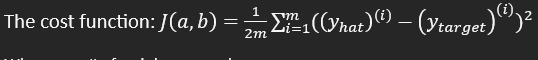 where m=# of training examples. (I did the formula on word, because cant represent it here)
Our goal is to find values of a and b such that J(a,b) is minimized.

NOTE: One issue with gradient descent is you can go to a local minimum which is not a global minimum, thus not optimal.

This why we use the square cost function, because for linear regression, the square cost function has only ONE minimum. Thus, it is always global.

Also, we must choose our learning rate "eta", because the choice of the learning rate will have a big impact on the efficiency of our implementation of gradient descent:
    - Eta too small: Slow convergence
    - Eta too big: No convergence

The formulas for gradient descent that I am going to use are the following:
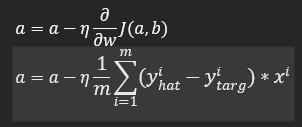 and 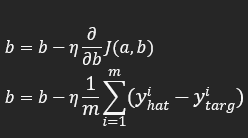 
(again, wrote them on word because impossible on here)

Algebraicaly, using the least square method, we obtain that the exact values of a=3/e and b=0.5(e-1/e)

In [4]:
#First, we compute the cost:
def compute_cost(x, y, a, b):
    #Get the number of training examples
    m = len(x)
    
    #initialize the sum as 0
    cost_sum = 0
    #For each training example, we compute the squared error
    for i in range(m):
        f_ab = a*x[i] + b
        cost = (f_ab - y[i])*(f_ab - y[i])
        cost_sum += cost 
    #We divide the error, to get mean square error.
    total_cost = (1/ (2*m)) * cost_sum 
    return total_cost

#Now, we define a function to compute the gradient
def compute_gradient(x, y, a, b):
    #number of training examples
    m = len(x)
    dj_da = 0
    dj_db = 0
    
    for i in range(m):
        f_ab = a * x[i] + b
        #Apply the formulas above, and add to sum
        dj_da_i = (f_ab-y[i])*x[i]
        dj_db_i = f_ab - y[i]
        dj_db += dj_db_i
        dj_da += dj_da_i
    #Divide both by the number of training examples 
    dj_da /= m
    dj_db /= m
    
    return dj_da, dj_db

#Finally, we define the gradient descent:
a_exact = 3*np.exp(-1)
b_exact = 0.5*(np.exp(1)-np.exp(-1))

def gradient_descent(x_train, y_train, x_test, y_test, a_in, b_in, eta, n):
    #Array to store the errors, for plotting graphs
    para_a = []
    para_b = []
    J_train_history = []
    J_test_history = []
    
    a = a_in
    b = b_in
    
    for i in range(n):
        #Compute the gradient
        dj_da, dj_db = compute_gradient(x_train, y_train, a, b)
        #Update the parameters with the above function
        a = a - eta * dj_da
        b = b - eta * dj_db
        
        para_a.append(np.log10(lsErr(a, a_exact)))
        para_b.append(np.log10(lsErr(b, b_exact)))
        
        J_train_history.append(np.log10(compute_cost(x_train, y_train, a, b)))
        J_test_history.append(np.log10(compute_cost(x_test, y_test, a, b)))
    
    return a, b, para_a, para_b, J_train_history, J_test_history

### Now, its time to test our implementations.

The provided function is F(x) = exp(x)

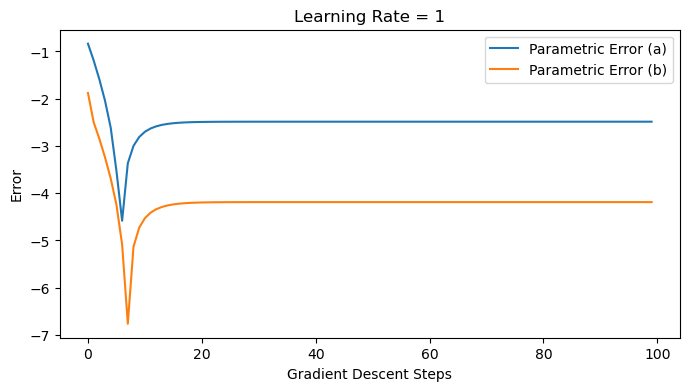

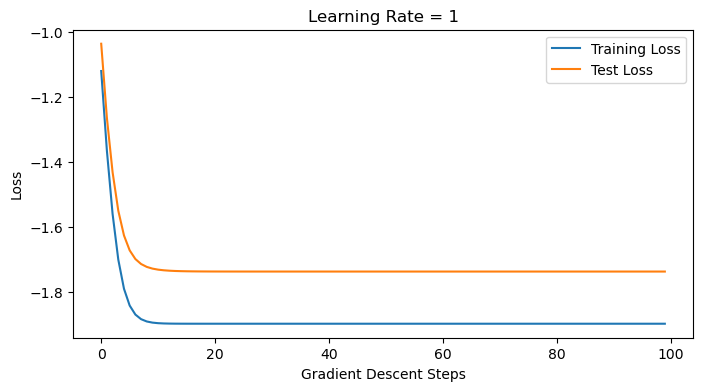

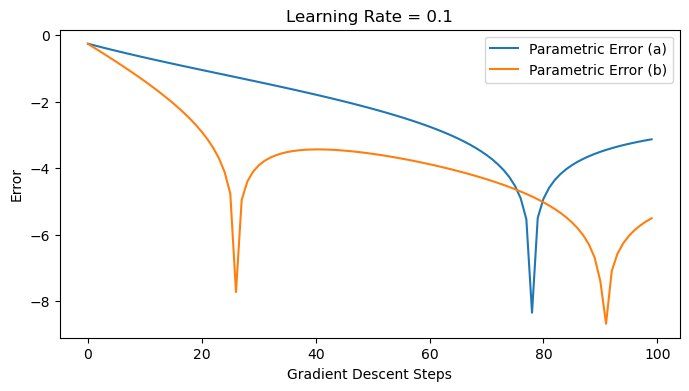

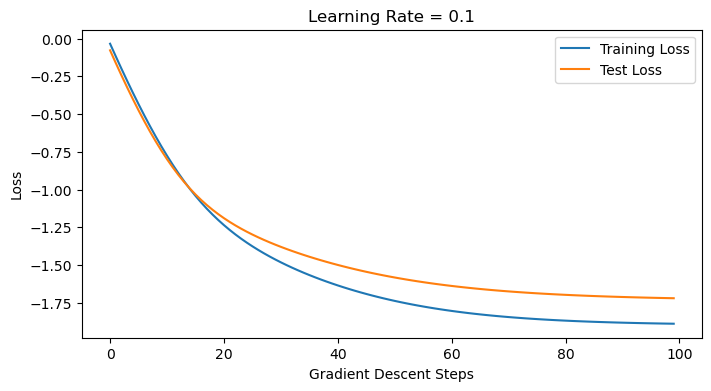

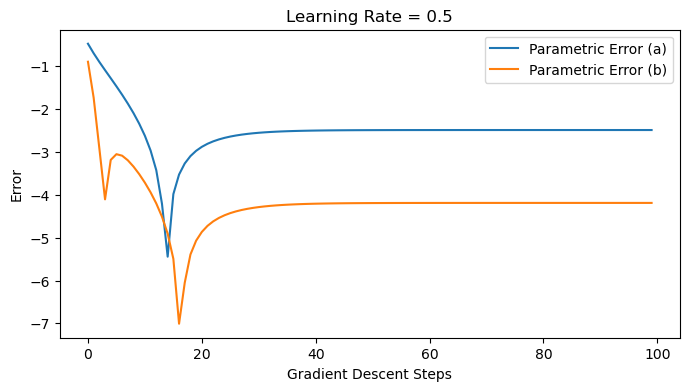

...

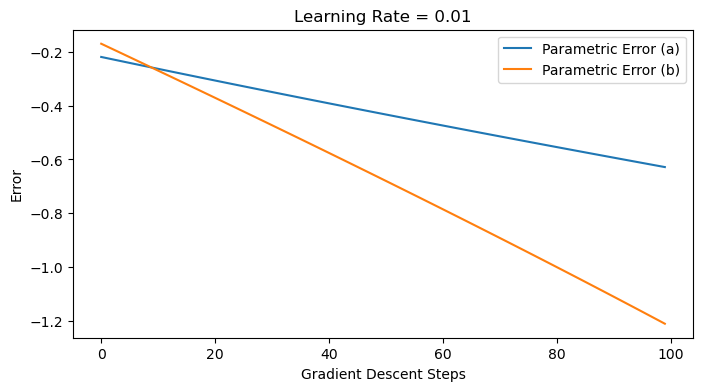

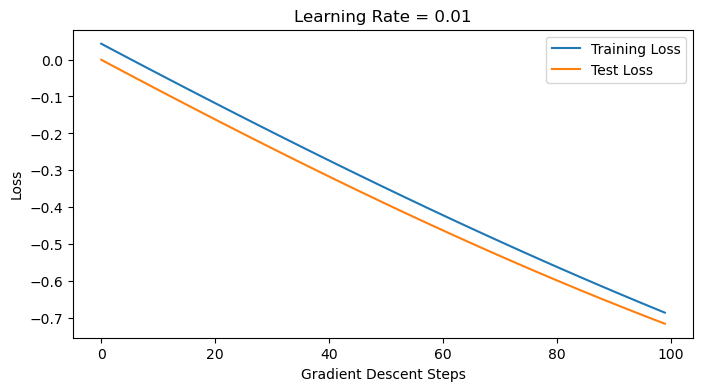

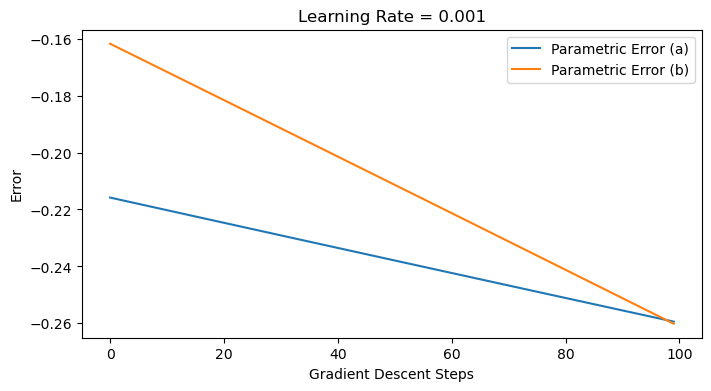

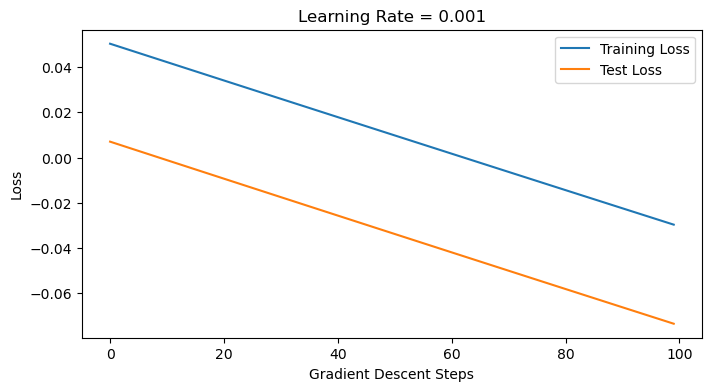

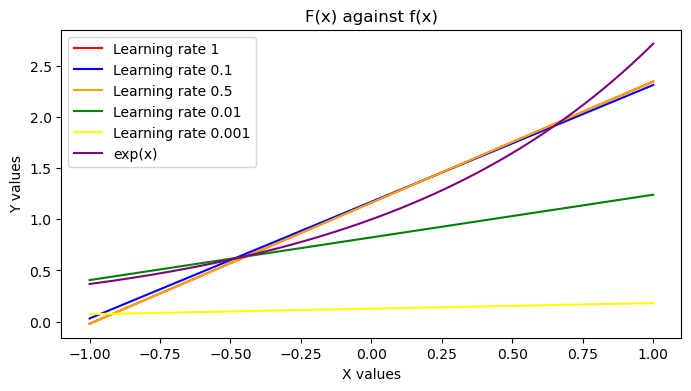

In [5]:
def F(x):
    return np.exp(x)

#First, we create a set of training data and test data
def generate_training_and_test_set(N, f):
    # Generate N random x values uniformly in the interval [-1, 1]
    X_train = np.random.uniform(low=-1, high=1, size=N)
    X_test = np.random.uniform(low=-1, high=1, size=int(N/4))
    
    # Generate random errors with a normal distribution
    errors_train = np.random.normal(0, 1e-16, N)  
    errors_test = np.random.normal(0, 1e-16, int(N/4))  

    # Calculate y values based on the function F(x) and add random errors
    Y_train = [f(x) + e for x, e in zip(X_train, errors_train)]
    Y_test = [f(x) + e for x, e in zip(X_test, errors_test)]

    return X_train, Y_train, X_test, Y_test
    
# Example usage:
N = 100  # Number of data points
X_train, Y_train, X_test, Y_test = generate_training_and_test_set(N, F)

learning_rates = [1, 0.1, 0.5, 0.01, 0.001]
funct=[]
for eta in learning_rates:
    a_final, b_final, para_a, para_b, J_train, J_test = gradient_descent(X_train, Y_train, X_test, Y_test, 0, 0, eta, N)
    funct.append(fun(a_final, b_final))

    
    # Plot Parametric Error
    plt.figure(figsize=(8, 4))
    plt.plot(para_a, label='Parametric Error (a)')
    plt.plot(para_b, label='Parametric Error (b)')
    plt.title(f'Learning Rate = {eta}')
    plt.legend()
    plt.xlabel('Gradient Descent Steps')
    plt.ylabel('Error')
    plt.show()
    
    # Plot Training and Test Loss
    plt.figure(figsize=(8, 4))
    plt.plot(J_train, label='Training Loss')
    plt.plot(J_test, label='Test Loss')
    plt.title(f'Learning Rate = {eta}')
    plt.legend()
    plt.xlabel('Gradient Descent Steps')
    plt.ylabel('Loss')
    plt.show()
    
x_values = np.linspace(-1, 1, 1000)
y_values = F(x_values)

#Plot all of the graphs
plt.figure(figsize=(8,4))
plt.plot(x_values, funct[0](x_values), color='red', label='Learning rate 1')
plt.plot(x_values, funct[1](x_values), color='blue', label='Learning rate 0.1')
plt.plot(x_values, funct[2](x_values), color='orange', label='Learning rate 0.5')
plt.plot(x_values, funct[3](x_values), color='green', label='Learning rate 0.01')
plt.plot(x_values, funct[4](x_values), color='yellow', label='Learning rate 0.001')
plt.plot(x_values, y_values, color='purple', label='exp(x)')
plt.title('F(x) against f(x)')
plt.legend()
plt.xlabel('X values')
plt.ylabel('Y values')
plt.show()



#### Commentary

I observe that the parametric error consistently stays significantly smaller than both the training and test loss. THe parametric errors frequently reach accurate values of 10^-6 to 10^-7 for learning rate 0.5 and 0.1, indicating high accuracy. However, the training and test loss only manage to achieve orders of magnitude around 10^-1 to q10^-2, with variations occuring each time the algorithm is run. This disparity is probably due to the fact that using a linear function to approximate exponential is not ideal. Thus, our model succeed to "reach" the "true" parametric values, but still isnt able to accurately approximate the function.

When running the code, its evidend that the generated graphs vary each time due to the random errors in our training set. Nonetheless, a consistent observation is that learning rates of 0.1 and 0.5 consistently outperform the others.

In line with the theory, small learning rates (0.01 and 0.001) exhibit slow convergence for both parametric and training/test errors, aligning with the anticipated slow convergence. Thus, they fall short of the effectiveness demonstrated by 0.1 and 0.5.

Furthermore, "bouncing" in parametric errors are noticeable, primarily for learning rates of 1, 0.5 and 0.1. This suggests that these rates might occasionnally be overly large, causing fluctuations. Thus, there's room to explore a more suitable value between 0.001 and 0.5 for improved performance.

In the graph F(x) against f(x), we can clearly see that the learning rates 0.5 and 0.1 are far superior to the other learning rates. Also, they yield very similar final results to the naked eye.

I have to admit that dealing with random error introduces a considerable challenge in drawing generalizations for these learning rates. Each observation appears to be elusive, as the variability in results makes it challenging to establish consistent patterns. Therefore, there's only the above limited set of observations that I can confidently assert.

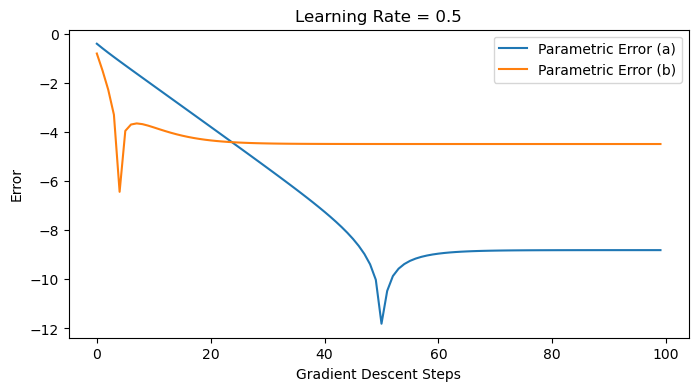

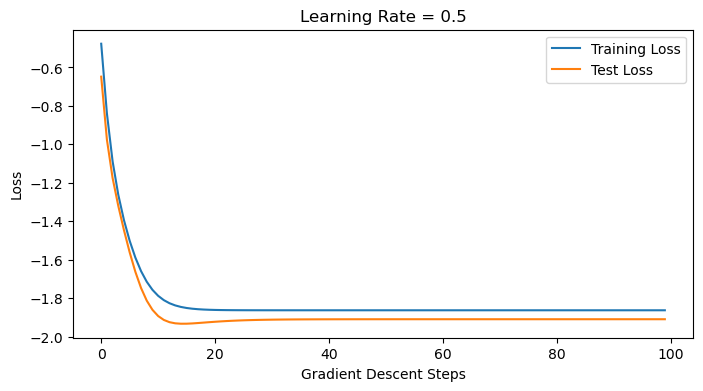

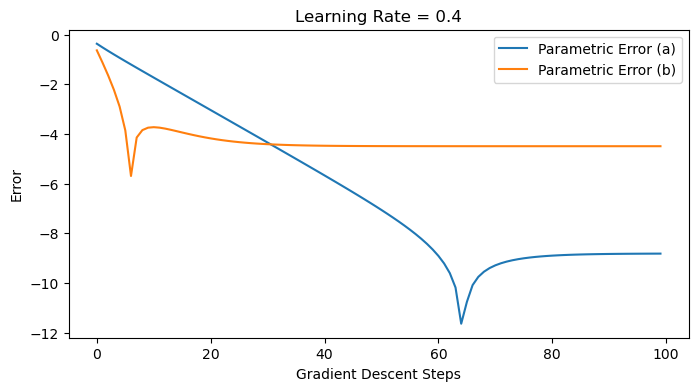

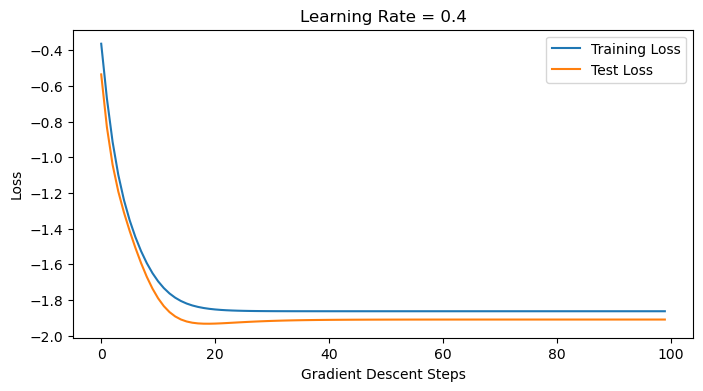

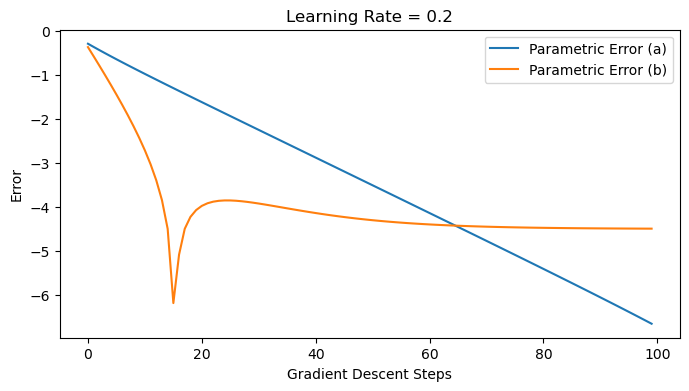

...

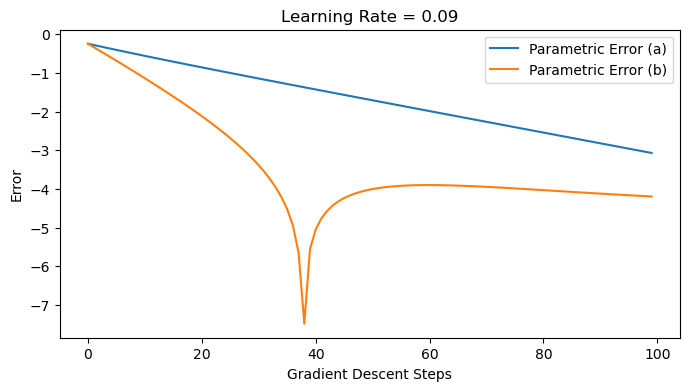

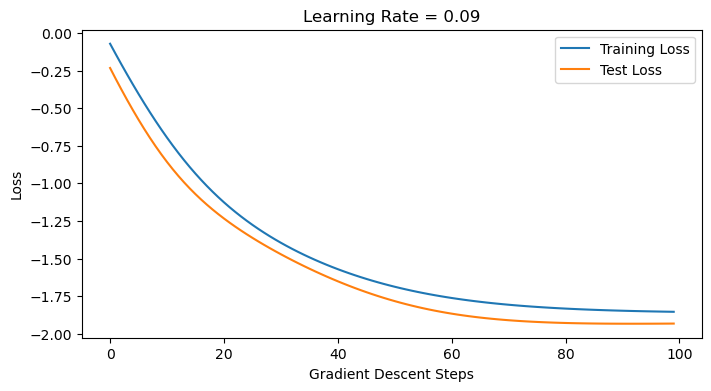

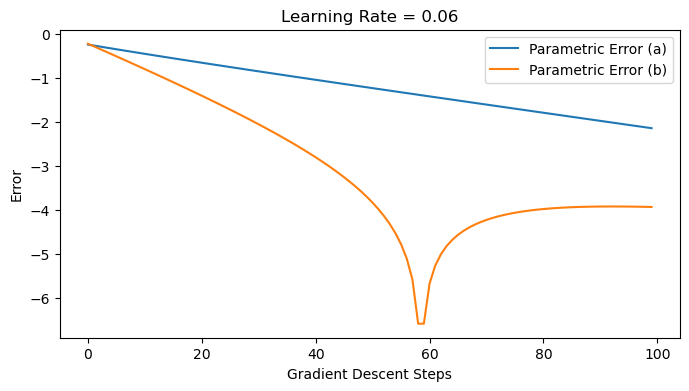

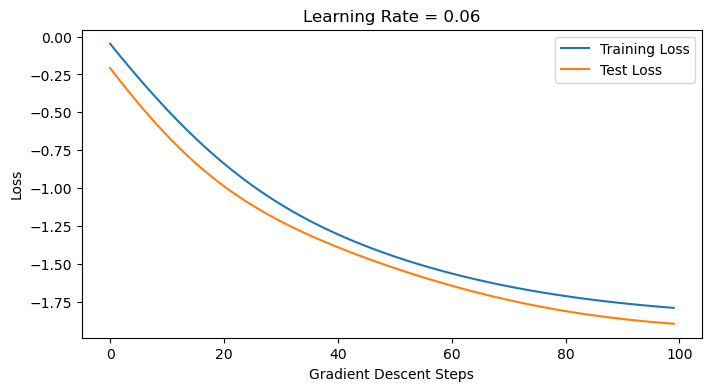

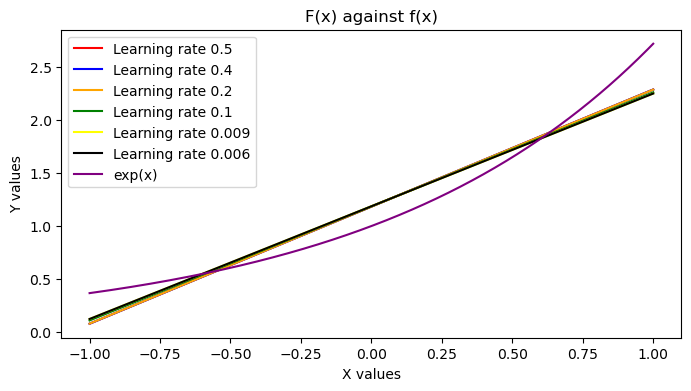

In [6]:
# Example usage:
N = 100  # Number of data points
X_train, Y_train, X_test, Y_test = generate_training_and_test_set(N, F)

learning_rates = [0.5, 0.4, 0.2, 0.1, 0.09, 0.06]
num_steps = 100
funct = []

for eta in learning_rates:
    a_final, b_final, para_a, para_b, J_train, J_test = gradient_descent(X_train, Y_train, X_test, Y_test, 0, 0, eta, num_steps)
    funct.append(fun(a_final, b_final)) #keep every functions
    
    # Plot Parametric Error
    plt.figure(figsize=(8, 4))
    plt.plot(para_a, label='Parametric Error (a)')
    plt.plot(para_b, label='Parametric Error (b)')
    plt.title(f'Learning Rate = {eta}')
    plt.legend()
    plt.xlabel('Gradient Descent Steps')
    plt.ylabel('Error')
    plt.show()
    
    # Plot Training and Test Loss
    plt.figure(figsize=(8, 4))
    plt.plot(J_train, label='Training Loss')
    plt.plot(J_test, label='Test Loss')
    plt.title(f'Learning Rate = {eta}')
    plt.legend()
    plt.xlabel('Gradient Descent Steps')
    plt.ylabel('Loss')
    plt.show()
    
    
x_values = np.linspace(-1, 1, 1000)
y_values = F(x_values)

#Plot all of the graphs
plt.figure(figsize=(8,4))
plt.plot(x_values, funct[0](x_values), color='red', label='Learning rate 0.5')
plt.plot(x_values, funct[1](x_values), color='blue', label='Learning rate 0.4')
plt.plot(x_values, funct[2](x_values), color='orange', label='Learning rate 0.2')
plt.plot(x_values, funct[3](x_values), color='green', label='Learning rate 0.1')
plt.plot(x_values, funct[4](x_values), color='yellow', label='Learning rate 0.009')
plt.plot(x_values, funct[4](x_values), color='black', label='Learning rate 0.006')
plt.plot(x_values, y_values, color='purple', label='exp(x)')
plt.title('F(x) against f(x)')
plt.legend()
plt.xlabel('X values')
plt.ylabel('Y values')
plt.show()
    

#### Commentary

One flagrant observation, not for EVERY time we run the code, but very often when there are "weird patterns" in the parametric loss of learning rate 0.5, the graphs for learning rate 0.4 are VERY similar to the ones of 0.5. This maybe indicate that a difference of 0.1 in learning rate doesnt significantly impact the result...

The introduction of these new values [0.5, 0.4, 0.2, 0.1, 0.09, 0.06], amplifies the challenge of forming a reliable generalization. With each code run, I encounter varied observation, often contradicting the ones before. Pinpointing a definitive choice becomes elusive. While 0.5 and 0.2 SEEM TO ME somewhat consistent, I hesitate to make any firm conclusions on their superiority. 

Again, I observe that the parametric error consistently stays significantly smaller than both the training and test loss. THe parametric errors frequently reach accurate values of 10^-6 to 10^-7 for all learning rates, but significantly more often for learning rate 0.5, 0.4, 0.2 and 0.1, indicating high accuracy. However, the training and test loss only manage to achieve orders of magnitude around 10^-1 to 10^-2, with variations occuring each time the algorithm is run. This disparity is probably due to the fact that using a linear function to approximate exponential is not ideal. Thus, our model succeed to "reach" the "true" parametric values, but still isnt able to accurately approximate the function.

We can very often observe some "bouncing" in the errors (i.e. the errors dimishes very fast then comes back to the same level as fast), which would indicate that for some learning rate taking more care in the number of gradient steps we do could greatly improve its performance. Indeed, if we are able to pinpoint the minimas of these "bouncing" we could obtain a very powerful algorithm/function. 

The F(x) against f(x) graph further proves that the small similar learning rates yield similar result. 

I'd like to assert that, in my perception, the selection of learning rates heavily hinges on the specific scenario, as the "best" learning rate is not the same at each run of the code, it shows that a slight alteration can yield significant differences. Notably, on the graphs instances where 0.2 and 0.1 exhibit similarities are infrequen, while 0.5, 0.4 and 0.2 often share similarities. This is intriguing, given that 0.5 is farther from 0.2 compared to the proximity of 0.2 to 0.1. It implies the existence of a POTENTIAL interval within which optimal learning rates can be chosen?? Further, exploration could be made to discover this.

#### Contour plot of the training set

We make a contour plot of the training loss as a function of (a,b) and depct the path of the gradient descent algorithm for different values of the learning rate and for different initial values (a0, b0). 

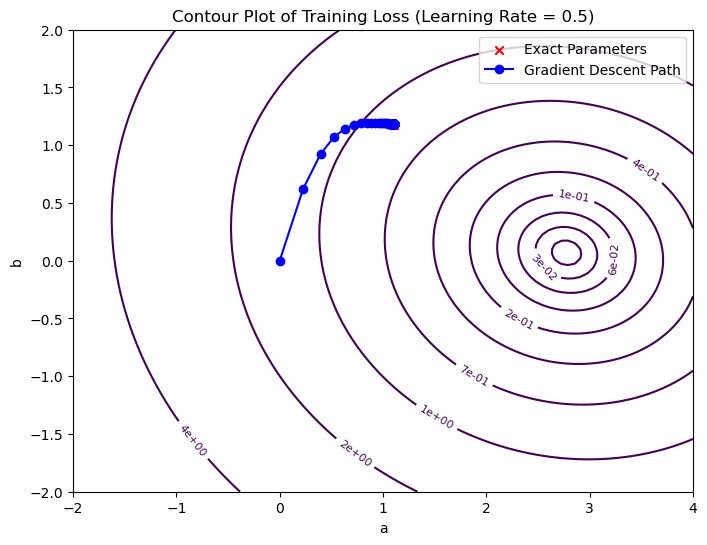

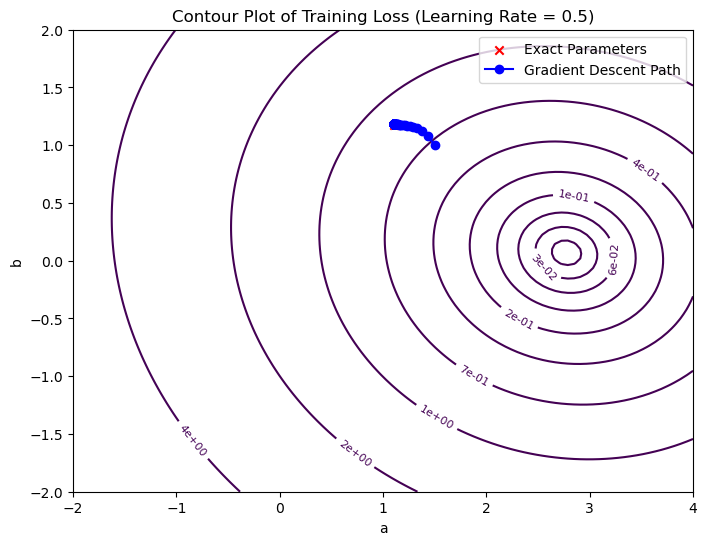

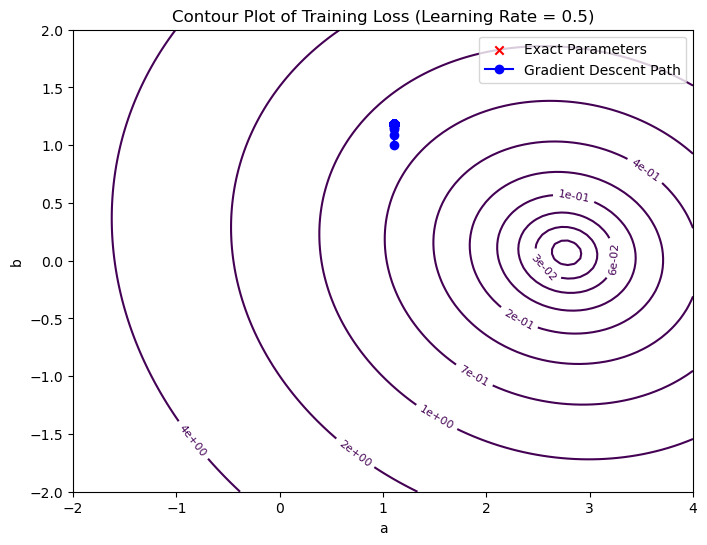

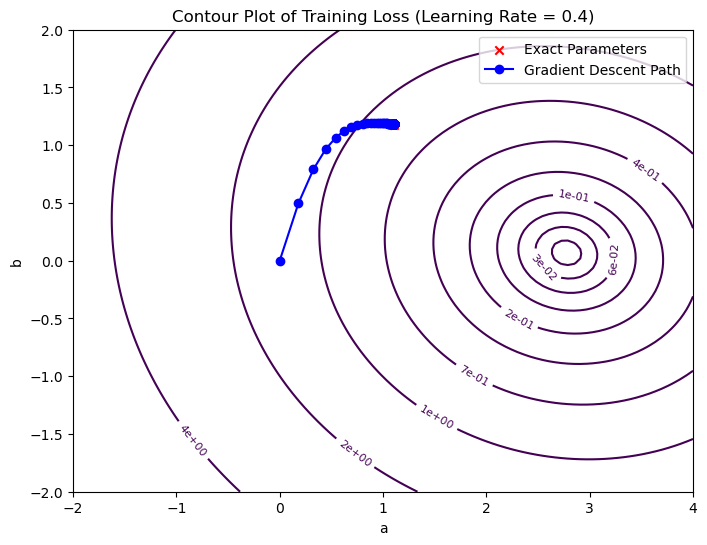

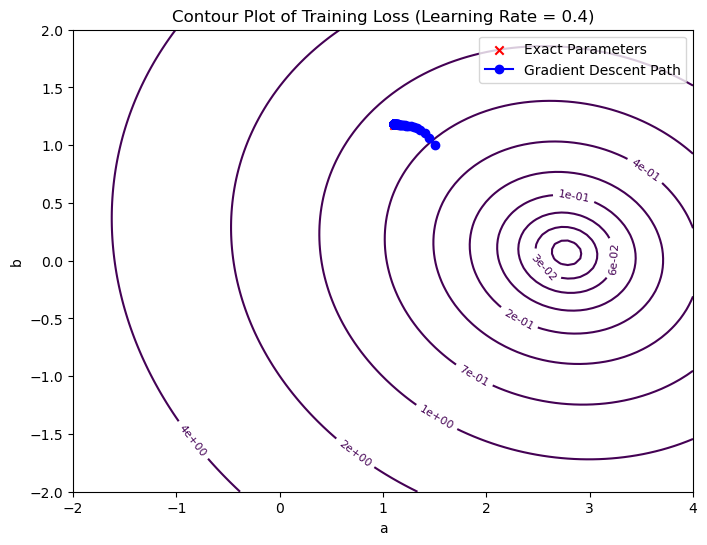

...

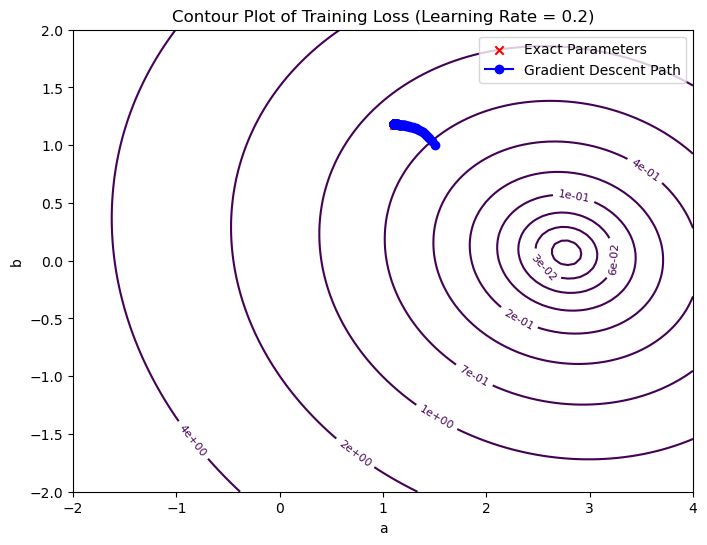

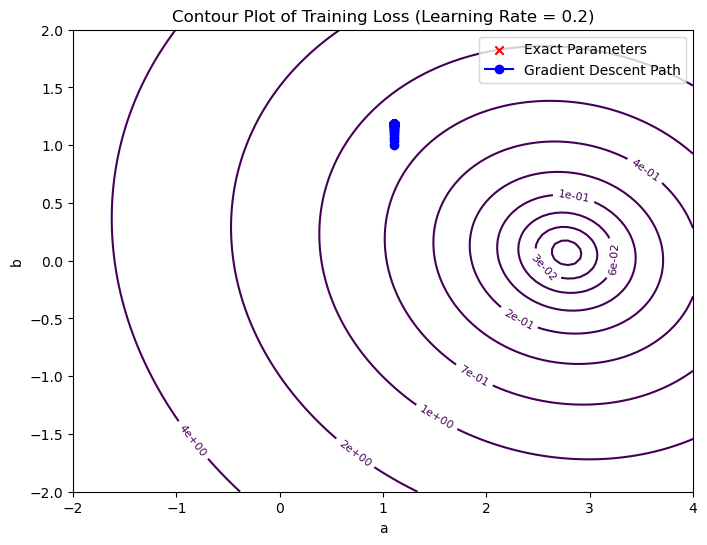

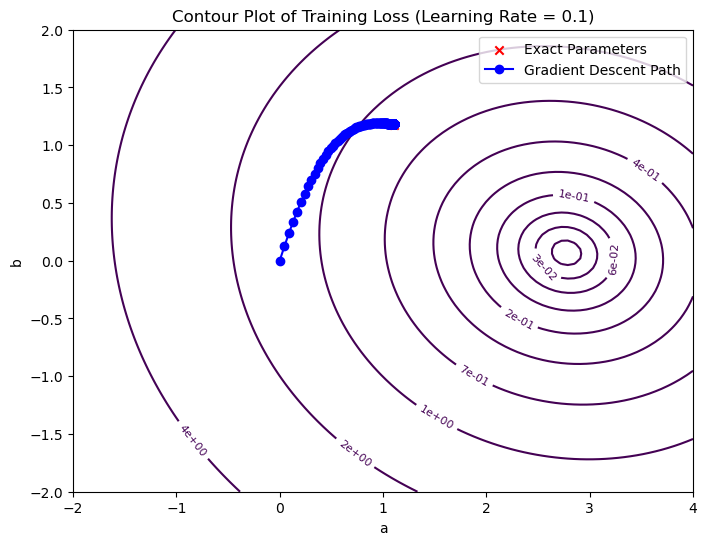

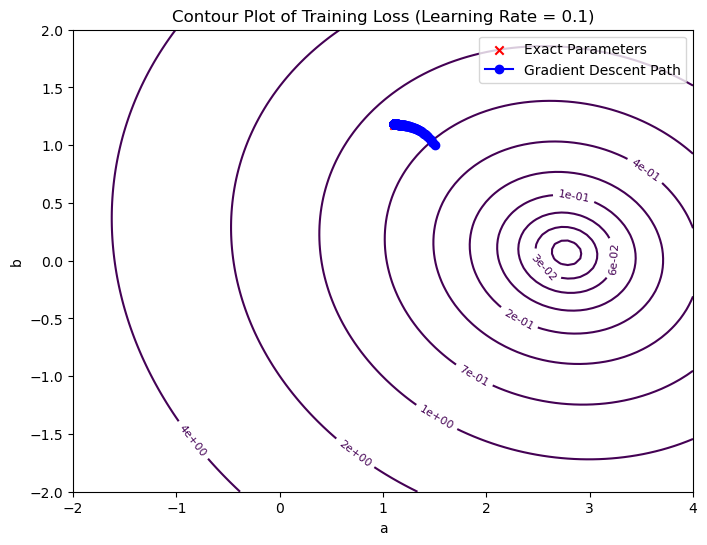

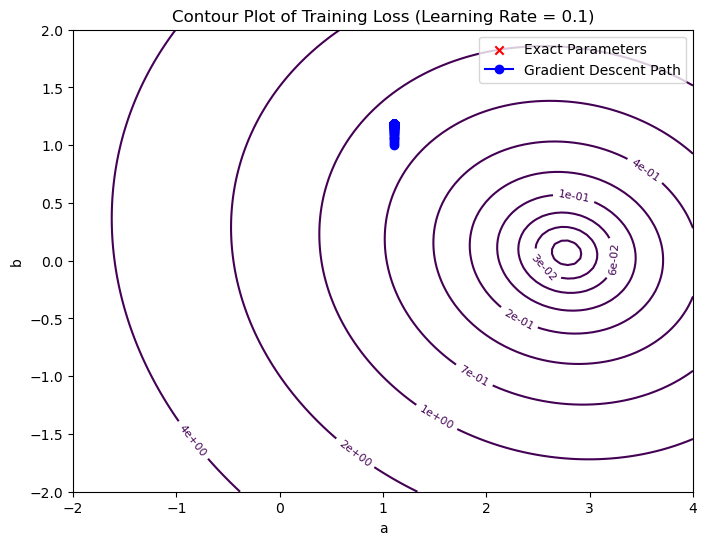

In [7]:
# Define the cost function without taking logs for the contour plot
def compute_cost_without_logs(x, y, a, b):
    m = len(x)
    cost_sum = 0
    for i in range(m):
        f_ab = a*x[i] + b
        cost = (f_ab - y[i])**2
        cost_sum += cost 
    total_cost = (1/ (2*m)) * cost_sum 
    return total_cost

a_exact = 3*np.exp(-1)
b_exact = 0.5*(np.exp(1)-np.exp(-1))

# Function to plot contour and gradient descent path
def plot_contour_and_path(X_train, Y_train, learning_rate, a_initial, b_initial, num_steps):
    # Generate a range of values for a and b
    a_values = np.linspace(-2, 4, 100)
    b_values = np.linspace(-2, 2, 100)

    # Create a grid of (a, b) values
    A, B = np.meshgrid(a_values, b_values)
    
    # Compute the cost for each (a, b) pair
    costs = np.zeros_like(A)
    for i in range(len(a_values)):
        for j in range(len(b_values)):
            costs[i, j] = compute_cost_without_logs(X_train, Y_train, a_values[i], b_values[j])

    # Plot the contour plot
    plt.figure(figsize=(8, 6))
    contour = plt.contour(A, B, costs, levels=np.logspace(-2, 3, 20))
    plt.clabel(contour, inline=True, fontsize=8, fmt='%1.0e')
    plt.title(f'Contour Plot of Training Loss (Learning Rate = {learning_rate})')
    plt.xlabel('a')
    plt.ylabel('b')
    
    #Plot the exact values
    plt.scatter(a_exact, b_exact, color='red', marker='x', label='Exact Parameters')
    # Initialize variables for gradient descent
    a = a_initial
    b = b_initial
    
    # Lists to store the path of gradient descent
    path_a = [a]
    path_b = [b]
    
    # Perform gradient descent
    for step in range(num_steps):
        dj_da, dj_db = compute_gradient(X_train, Y_train, a, b)
        a = a - learning_rate * dj_da
        b = b - learning_rate * dj_db
        path_a.append(a)
        path_b.append(b)
    
    # Plot the path of gradient descent
    plt.plot(path_a, path_b, marker='o', color='blue', label='Gradient Descent Path')
    plt.legend()
    plt.show()

learning_rates = [0.5, 0.4, 0.2, 0.1]
initial_values = [(0, 0), (3/2, 1), (3*np.exp(-1), 1)]  # Different initial values for (a, b)
num_steps = 1000

# Perform experiments with different initial values and learning rates
for learning_rate in learning_rates:
    for a_initial, b_initial in initial_values:
        plot_contour_and_path(X_train, Y_train, learning_rate, a_initial, b_initial, num_steps)

#### Commentary

As observed in the earlier steps, the identified "optimal" learning rates of 0.5, 0.4, 0.2 and 0.1 were chosen for futher testing. Across multiple runs of the code, a consistent pattern emerges, regardless of the learning rate or initial starting point, the gradient descent consistently converges to the desired destination, In essence, it unfailingly reaches the "true" parameters.

An interesting observation is the striking similarity in the "shape" of the gradient descent across all learning rates. It is intriguing to note that as the learning rate decreases, the points along the descent path draw closer together. For instance, with learning rate 0.5 the points exhibit more spacing than those with 0.4, similarly, 0.4 has more spacing than 0.2, and so on for 0.1. This alignment with theoretical expectations is fascinating, it accurately reflects the principle that a smaller learning rate leads to a slower convergence. The careful selection of these "good" learning rates, determined through prior testing, underscores their effectiveness in demonstrating the concept that, when appropriately chosen, a smaller but effective learning rate indeed results in a more gradual convergence.

Now, we will study the importance of the training data set size. For this, we will only use learning rates 0.5 and 0.1 so that it doesnt become overwhelming.

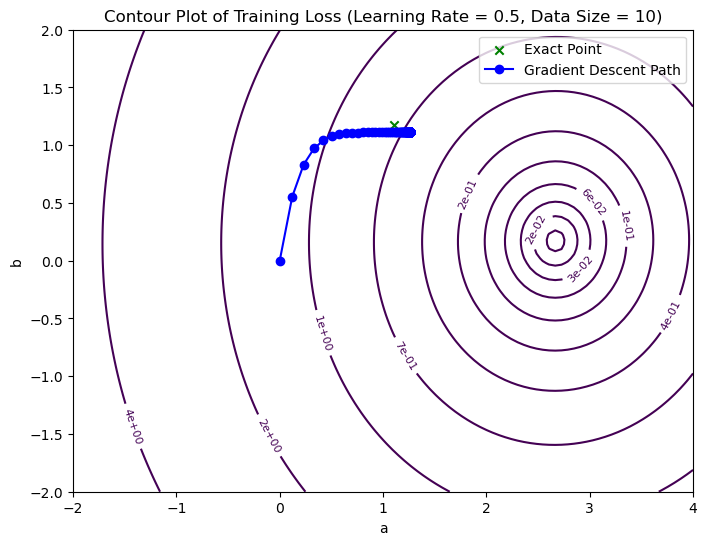

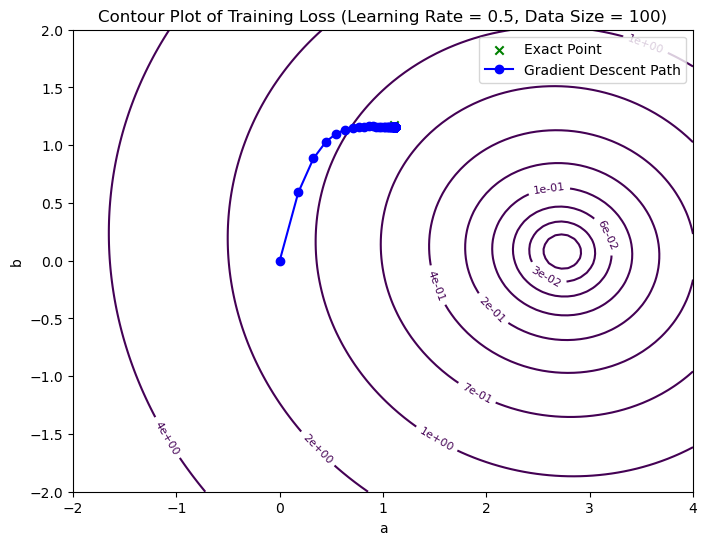

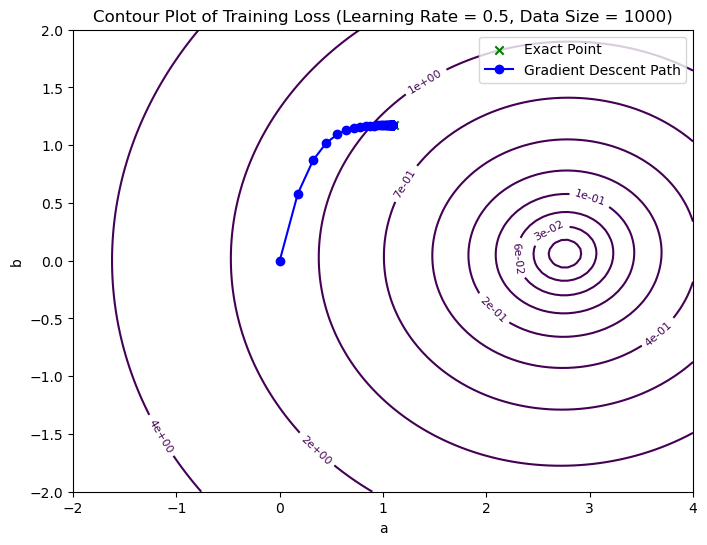

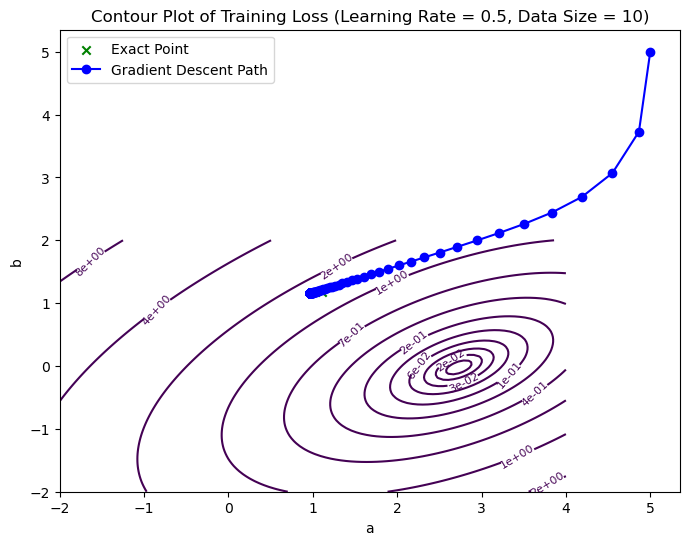

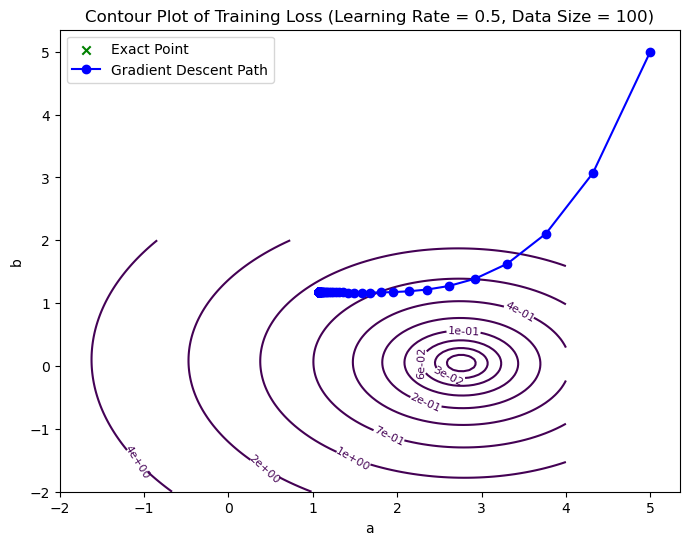

...

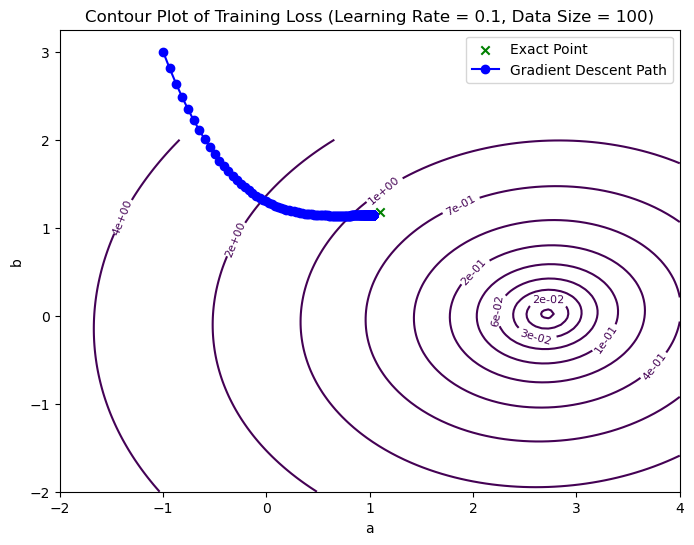

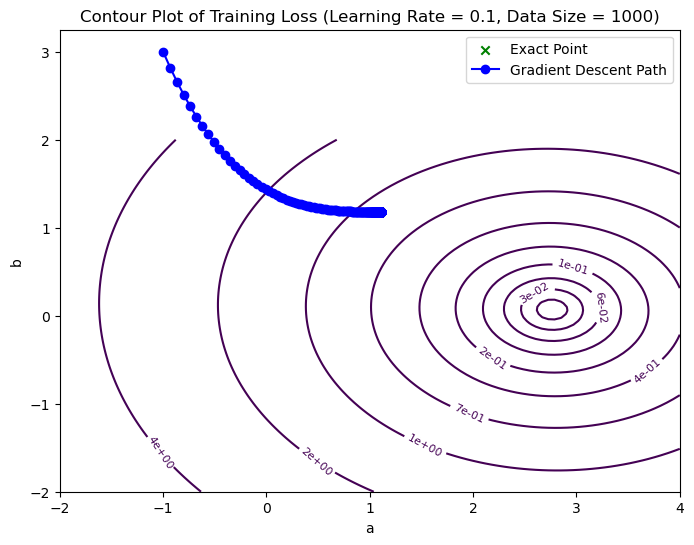

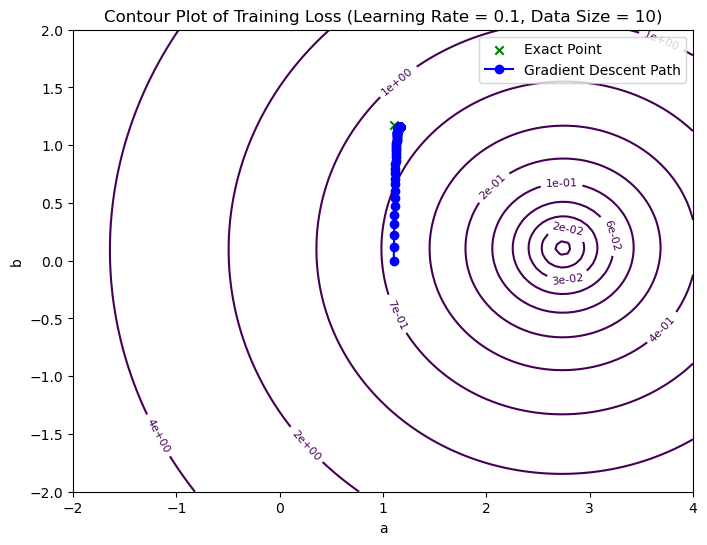

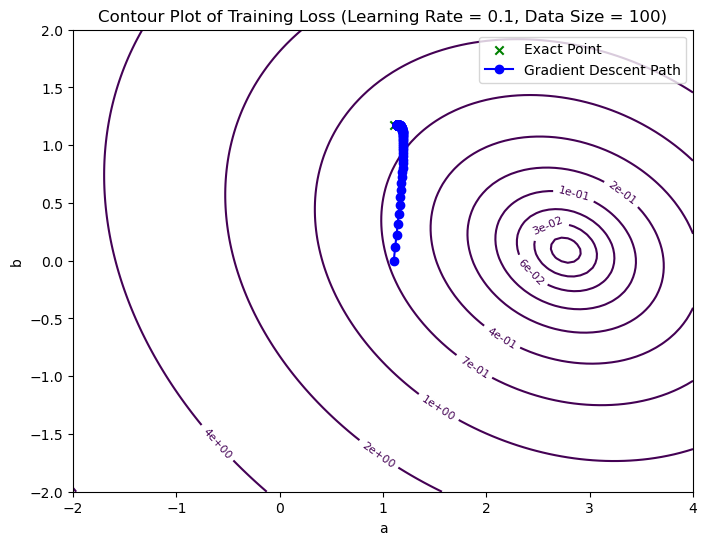

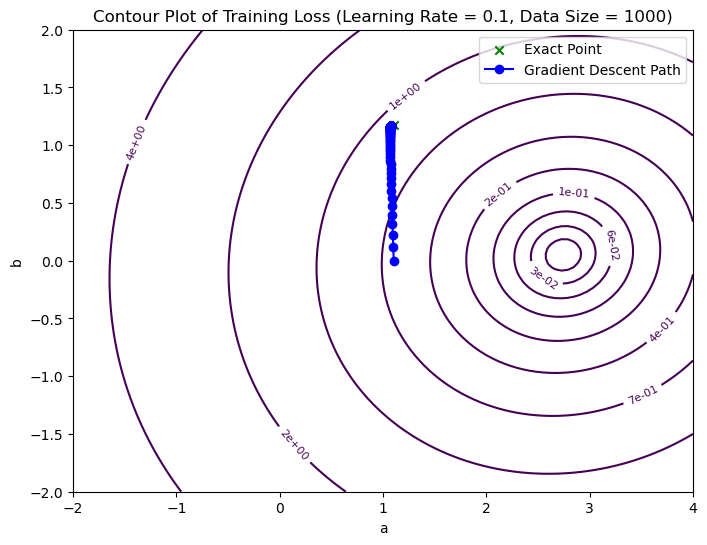

In [8]:
# Function to plot contour and gradient descent path
def plot_contour_and_path(X_train, Y_train, learning_rate, a_initial, b_initial, num_steps):
    # Generate a range of values for a and b
    a_values = np.linspace(-2, 4, 100)
    b_values = np.linspace(-2, 2, 100)

    # Create a grid of (a, b) values
    A, B = np.meshgrid(a_values, b_values)
    
    # Compute the cost for each (a, b) pair
    costs = np.zeros_like(A)
    for i in range(len(a_values)):
        for j in range(len(b_values)):
            costs[i, j] = compute_cost_without_logs(X_train, Y_train, a_values[i], b_values[j])

    # Plot the contour plot
    plt.figure(figsize=(8, 6))
    contour = plt.contour(A, B, costs, levels=np.logspace(-2, 3, 20))
    plt.clabel(contour, inline=True, fontsize=8, fmt='%1.0e')
    plt.title(f'Contour Plot of Training Loss (Learning Rate = {learning_rate}, Data Size = {len(X_train)})')
    plt.xlabel('a')
    plt.ylabel('b')
    
    # Plot the exact point
    plt.scatter(a_exact, b_exact, color='green', marker='x', label='Exact Point')
    
    # Initialize variables for gradient descent
    a = a_initial
    b = b_initial
    
    # Lists to store the path of gradient descent
    path_a = [a]
    path_b = [b]
    
    # Perform gradient descent
    for step in range(num_steps):
        dj_da, dj_db = compute_gradient(X_train, Y_train, a, b)
        a = a - learning_rate * dj_da
        b = b - learning_rate * dj_db
        path_a.append(a)
        path_b.append(b)
    
    # Plot the path of gradient descent
    plt.plot(path_a, path_b, marker='o', color='blue', label='Gradient Descent Path')
    plt.legend()
    plt.show()

# Set the learning rates, initial values, and number of steps
learning_rates = [0.5, 0.1]
initial_values = [(0, 0), (5, 5), (-1, 3), (3/np.exp(1), 0)]  # Different initial values for (a, b)
training_data_sizes = [10, 100, 1000]
num_steps = 1000

# Perform experiments with different initial values, learning rates, and training data sizes
for learning_rate in learning_rates:
    for a_initial, b_initial in initial_values:
        for training_data_size in training_data_sizes:
            X_train, Y_train, X_test, Y_test = generate_training_and_test_set(training_data_size, F)
            plot_contour_and_path(X_train, Y_train, learning_rate, a_initial, b_initial, num_steps)

#### Commentary

The graphs make it clear that the magnitude of improvement in the final parameters is directly influenced by the size of the training data.

For learning rate 0.5, there is evident difficulty in achieving accurate results when the training data size is merely 10. Nevertheless, as the data size increases to 100, the algorithm adeptly converges to the "real" parameters. On the other hand, a lower learning rate of 0.1 occasionally encounters challenges, depending on the code execution, when dealing with smaller trianing data sizes (10 and 100), particularly for starting points that deviate significantly from the "real" parameters.

Notably, when the training data size expands to 1000, both learning rates consistently and precisely identify the "real" parameters. Once again, a striking similarity in the "shape" of the gradient descent path is noticeable, underscoring the consistency in their convergence behaviour.

## Q2: Logistic Regression: F(x) = (x + |x|)/2x

The implementation for the logistic regression is basically the same as the one for linear regression but we change the activation function for the logistic function:

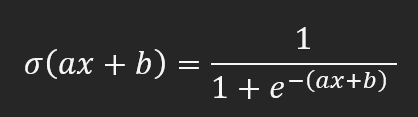
Again, I used word to write the function because I don't know how on here.
The principles for the gradient descent are the same.


Algebraically, I obtain that the "real" parameters are a= 2*infinity , b= 0, so without loss of generality, we will say that a=2000

One difference is the lost function, we must change it, as the old one wont work for the sigmoid function:
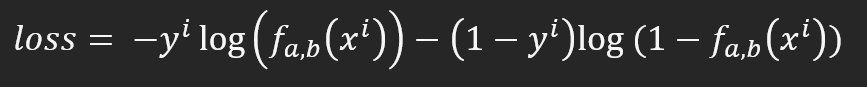
(Again used word to write it)

Also, from lecture:
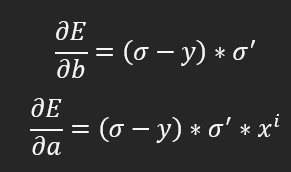
and:
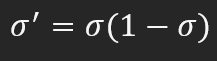

In [9]:
#We implement the sigmoid function
def lo(a,b):
    def go(x):
        return 1 / (1 + np.exp(-(a*x+b)))
    return go

#We implement the target function
def F2(x):
    return (x + np.abs(x))/(2*x)

#To compute the cost
def compute_cost_logistic(x, y, a, b):
    m = len(x)
    cost_sum = 0
    f = lo(a,b)
    for i in range(m):
        f_ab = f(x[i])
        cost = -(y[i] * np.log(f_ab) + (1 - y[i]) * np.log(1 - f_ab)) 
        cost_sum += cost 
    total_cost = (1/m) * cost_sum 
    return total_cost

#Now, we define a function to compute the gradient
def compute_gradient_logistic(x, y, a, b):
    #number of training examples
    m = len(x)
    dj_da = 0
    dj_db = 0
    f = lo(a,b)
    for i in range(m):
        f_ab = f(x[i])
        err_i = f_ab - y[i]
        f_abPrime = f_ab*(1-f_ab) #compute sigma prime
        #Apply the formulas above, and add to sum
        dj_da_i = err_i * f_abPrime * x[i]
        dj_db_i = err_i * f_abPrime
        dj_db += dj_db_i
        dj_da += dj_da_i
    #Divide both by the number of training examples 
    dj_da /= m
    dj_db /= m
    
    return dj_da, dj_db

#Finally, we define the gradient descent:
a_exact = 2000
b_exact = 0

def gradient_descent_logistic(x_train, y_train, x_test, y_test, a_in, b_in, eta, n):
    #Array to store the errors, for plotting graphs
    para_a = []
    para_b = []
    J_train_history = []
    J_test_history = []
    
    a = a_in
    b = b_in
    
    for i in range(n):
        #Compute the gradient
        dj_da, dj_db = compute_gradient_logistic(x_train, y_train, a, b)
        #Update the parameters with the above function
        a = a - eta * dj_da
        b = b - eta * dj_db
        
        para_a.append(np.log10(lsErr(a, a_exact)))
        para_b.append(np.log10(lsErr(b, b_exact)))
        
        J_train_history.append(np.log10(compute_cost_logistic(x_train, y_train, a, b)))
        J_test_history.append(np.log10(compute_cost_logistic(x_test, y_test, a, b)))
    
    return a, b, para_a, para_b, J_train_history, J_test_history

### Now, its time to test our implementation:  
The target function is F(x) = (x + |x|)/2x but its basically the step function h(x) = {0 if x <0, 1 if x >0 }

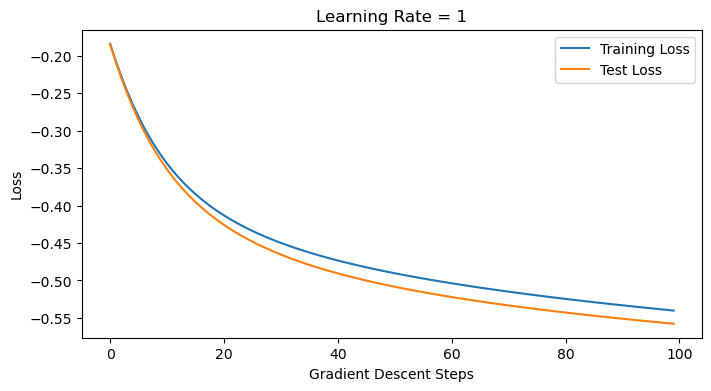

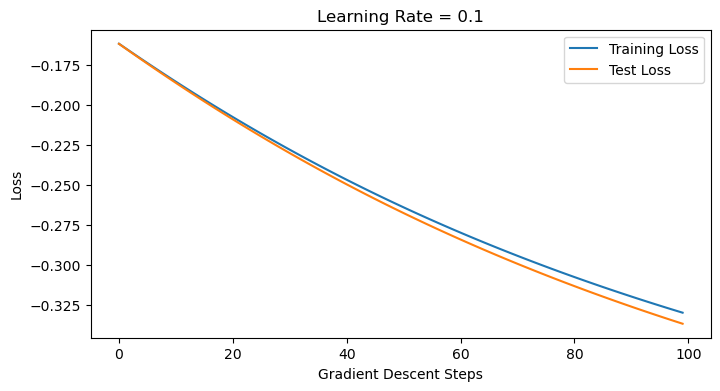

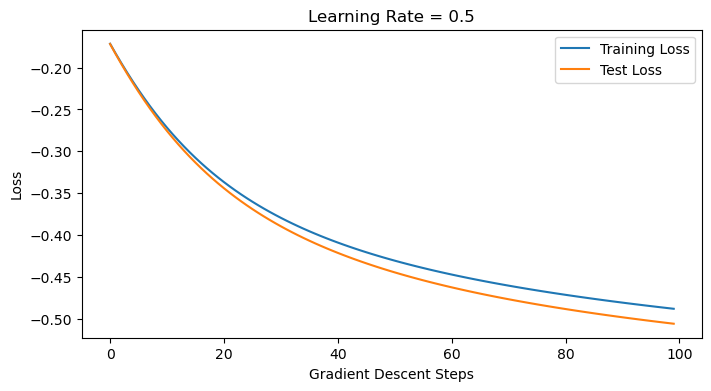

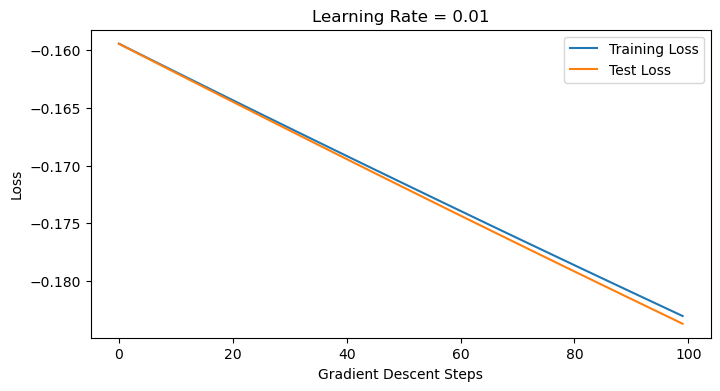

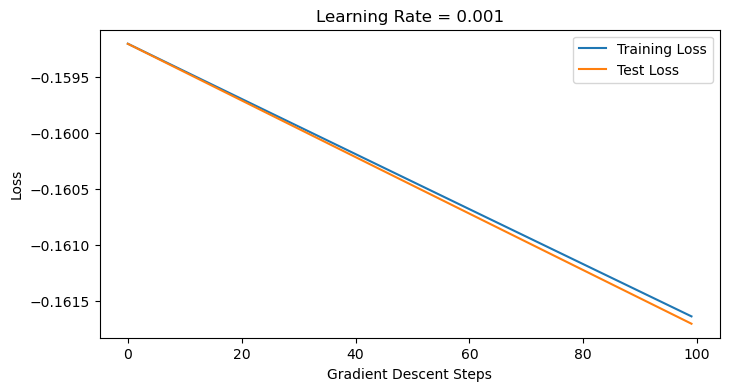

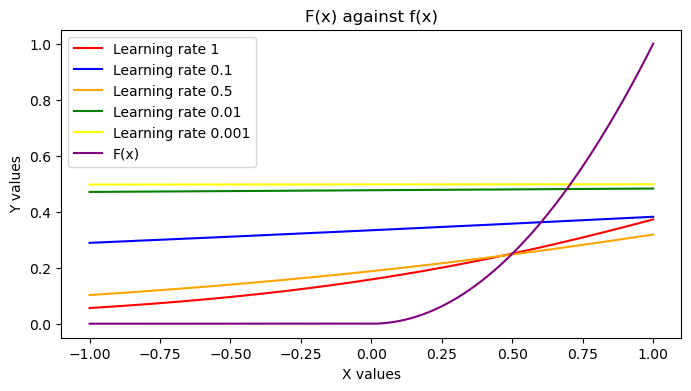

In [10]:
def F2(x):
    return (x+np.abs(x))/2*x

#First, we create a set of training data and test data
def generate_training_and_test_set2(N, f):
    # Generate N random x values uniformly in the interval [-1, 1]
    X_train = np.random.uniform(low=-1, high=1, size=N)
    X_test = np.random.uniform(low=-1, high=1, size=int(N/4))
    
    # Generate random errors with a normal distribution
    errors_train = np.random.normal(0, 1e-16, N)  
    errors_test = np.random.normal(0, 1e-16, int(N/4))  

    # Calculate y values based on the function F(x) and add random errors
    Y_train = [f(x) + e for x, e in zip(X_train, errors_train)]
    Y_test = [f(x) + e for x, e in zip(X_test, errors_test)]

    return X_train, Y_train, X_test, Y_test
    
# Example usage:
N = 100  # Number of data points
X_train, Y_train, X_test, Y_test = generate_training_and_test_set2(N, F2)

learning_rates = [1, 0.1, 0.5, 0.01, 0.001]
funct=[]
for eta in learning_rates:
    a_final, b_final, para_a, para_b, J_train2, J_test2 = gradient_descent_logistic(X_train, Y_train, X_test, Y_test, 0, 0, eta, N)
    funct.append(lo(a_final, b_final))
    
    
    # Plot Training and Test Loss
    plt.figure(figsize=(8, 4))
    plt.plot(J_train2, label='Training Loss')
    plt.plot(J_test2, label='Test Loss')
    plt.title(f'Learning Rate = {eta}')
    plt.legend()
    plt.xlabel('Gradient Descent Steps')
    plt.ylabel('Loss')
    plt.show()
    
x_values = np.linspace(-1, 1, 1000)
y_values = F2(x_values)

#Plot all of the graphs
plt.figure(figsize=(8,4))
plt.plot(x_values, funct[0](x_values), color='red', label='Learning rate 1')
plt.plot(x_values, funct[1](x_values), color='blue', label='Learning rate 0.1')
plt.plot(x_values, funct[2](x_values), color='orange', label='Learning rate 0.5')
plt.plot(x_values, funct[3](x_values), color='green', label='Learning rate 0.01')
plt.plot(x_values, funct[4](x_values), color='yellow', label='Learning rate 0.001')
plt.plot(x_values, y_values, color='purple', label='F(x)')
plt.title('F(x) against f(x)')
plt.legend()
plt.xlabel('X values')
plt.ylabel('Y values')
plt.show()

#### Commentary

In contrast of linear regression, here, we are not able to get an acceptable approximation in only 100 gradient descent, all functions are completely different from the target function. However, we notice on the graph, that the "true" function (purple) doesnt even have its "true" shape. Indeed, it looks like an exponential function when it is supposed to be a step function.

Also, one big difference, is the order of errors. For linear regression, we managed to constantly obtain errors of order 10^-6 and 10^-8, while here, we barely manage to get an error of 10^-1. This indicates that it might be harder to train a logistic regression than a linear regression. Or maybe, the type of function "step-functions" we are trying to approximate are generally hard to approximate. However, by quickly looking at the shape of logistic functions, we know its the right function to approximate it.

Finally, another difference, for linear regression, every time we ran the code, we had different graphs, but for logistic regression, the graphs are slightly different almost the same everytime we run the code. It potentially could indicate that logistic functions handle errors in the inputs better than the linear regression.

Also, here, it seems that for the logistic regression, bigger learning rates are more approriate. As we can see, for learning rates 1 and 0.5, we have the best approximations.

So, lets try bigger values for the learning rates:

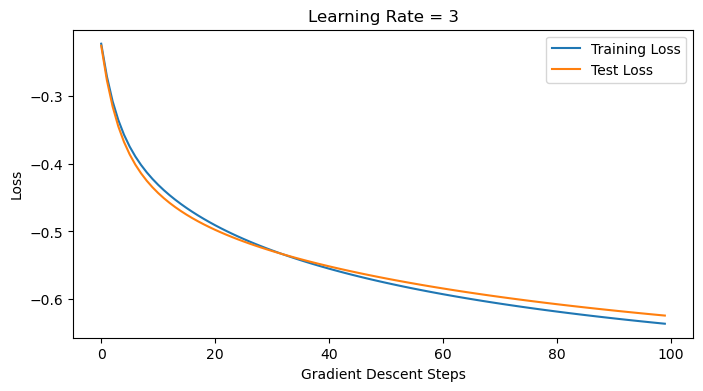

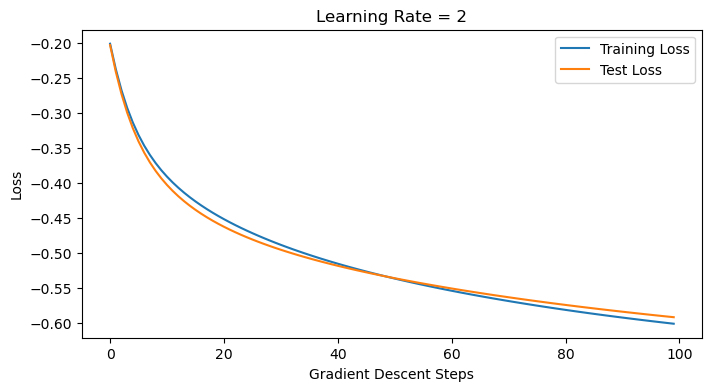

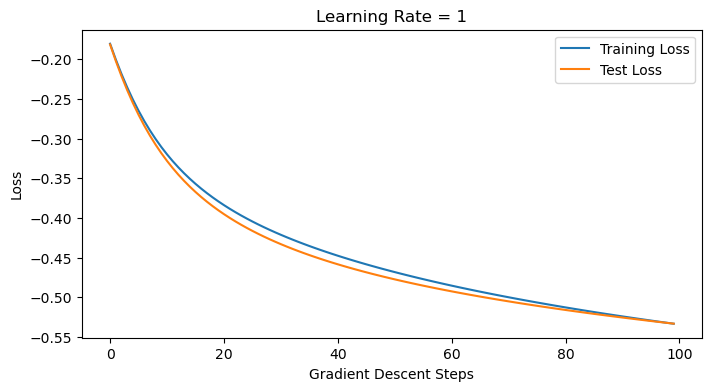

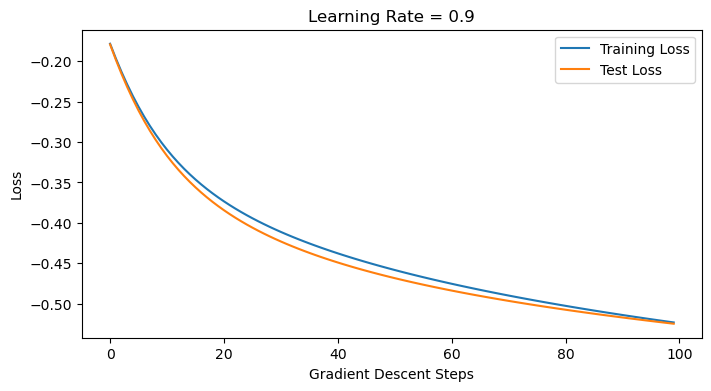

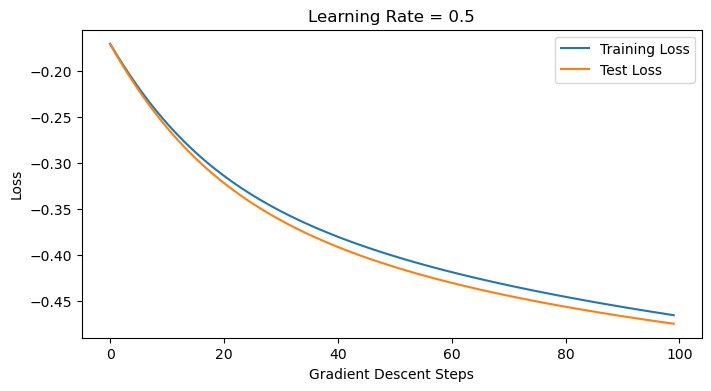

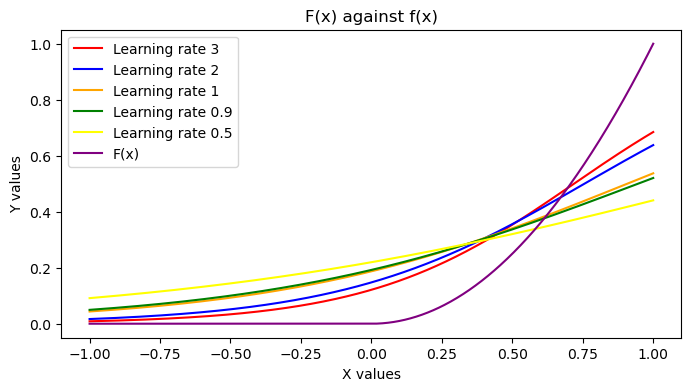

In [11]:
# Example usage:
N = 100  # Number of data points
X_train, Y_train, X_test, Y_test = generate_training_and_test_set2(N, F2)

learning_rates = [3, 2, 1, 0.9, 0.5]
funct=[]
for eta in learning_rates:
    a_final, b_final, para_a, para_b, J_train2, J_test2 = gradient_descent_logistic(X_train, Y_train, X_test, Y_test, 0, 0, eta, N)
    funct.append(lo(a_final, b_final))
    
    # Plot Training and Test Loss
    plt.figure(figsize=(8, 4))
    plt.plot(J_train2, label='Training Loss')
    plt.plot(J_test2, label='Test Loss')
    plt.title(f'Learning Rate = {eta}')
    plt.legend()
    plt.xlabel('Gradient Descent Steps')
    plt.ylabel('Loss')
    plt.show()
    
x_values = np.linspace(-1, 1, 1000)
y_values = F2(x_values)

#Plot all of the graphs
plt.figure(figsize=(8,4))
plt.plot(x_values, funct[0](x_values), color='red', label='Learning rate 3')
plt.plot(x_values, funct[1](x_values), color='blue', label='Learning rate 2')
plt.plot(x_values, funct[2](x_values), color='orange', label='Learning rate 1')
plt.plot(x_values, funct[3](x_values), color='green', label='Learning rate 0.9')
plt.plot(x_values, funct[4](x_values), color='yellow', label='Learning rate 0.5')
plt.plot(x_values, y_values, color='purple', label='F(x)')
plt.title('F(x) against f(x)')
plt.legend()
plt.xlabel('X values')
plt.ylabel('Y values')
plt.show()

#### Commentary

As we can see on the graphs, my hypothesis seems true, the bigger the learning rate, the better for the logistic function, but there seems to still be room for improvement. Indeed, by looking at the graph of learning rates 3, 2, 1, we see that they keep getting better and better, so lets try some even bigger learning rates:

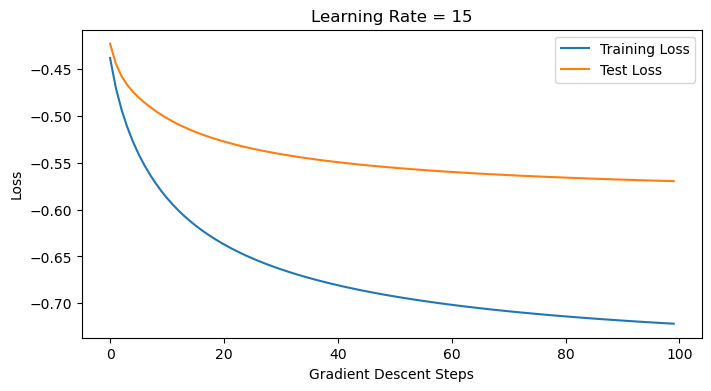

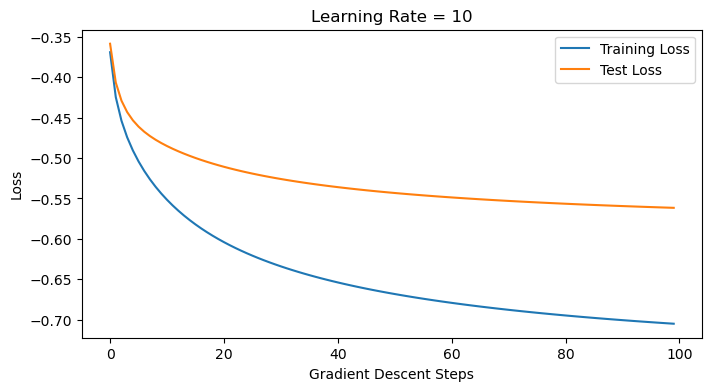

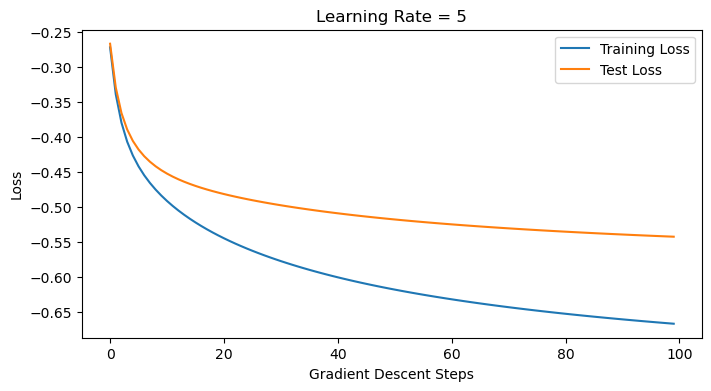

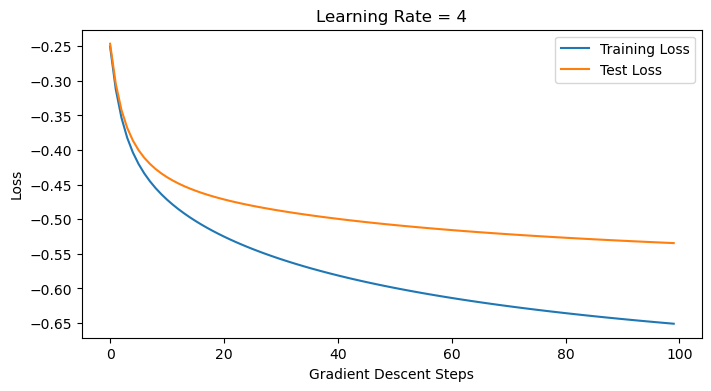

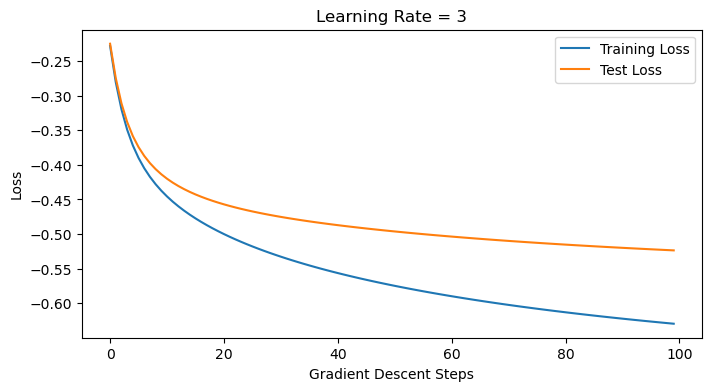

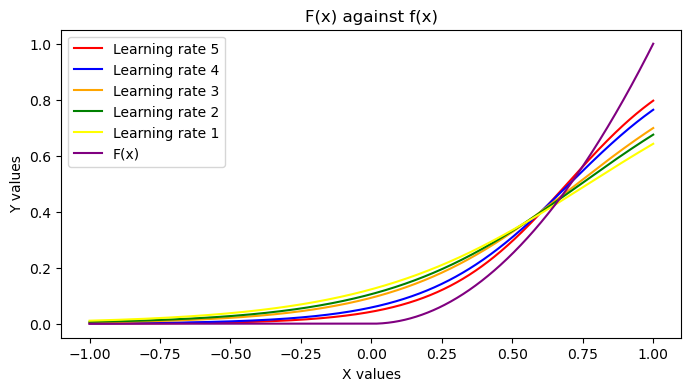

In [12]:
# Example usage:
N = 100  # Number of data points
X_train, Y_train, X_test, Y_test = generate_training_and_test_set2(N, F2)

learning_rates = [15, 10, 5, 4, 3]
funct=[]
for eta in learning_rates:
    a_final, b_final, para_a, para_b, J_train2, J_test2 = gradient_descent_logistic(X_train, Y_train, X_test, Y_test, 0, 0, eta, N)
    funct.append(lo(a_final, b_final))
    
    # Plot Training and Test Loss
    plt.figure(figsize=(8, 4))
    plt.plot(J_train2, label='Training Loss')
    plt.plot(J_test2, label='Test Loss')
    plt.title(f'Learning Rate = {eta}')
    plt.legend()
    plt.xlabel('Gradient Descent Steps')
    plt.ylabel('Loss')
    plt.show()
    
x_values = np.linspace(-1, 1, 1000)
y_values = F2(x_values)

#Plot all of the graphs
plt.figure(figsize=(8,4))
plt.plot(x_values, funct[0](x_values), color='red', label='Learning rate 5')
plt.plot(x_values, funct[1](x_values), color='blue', label='Learning rate 4')
plt.plot(x_values, funct[2](x_values), color='orange', label='Learning rate 3')
plt.plot(x_values, funct[3](x_values), color='green', label='Learning rate 2')
plt.plot(x_values, funct[4](x_values), color='yellow', label='Learning rate 1')
plt.plot(x_values, y_values, color='purple', label='F(x)')
plt.title('F(x) against f(x)')
plt.legend()
plt.xlabel('X values')
plt.ylabel('Y values')
plt.show()

#### Commentary

We observe that again the greater the learning rate, the better our approximation is, but still, there seems to be room for improvement so (again) lets try some bigger learning rates:

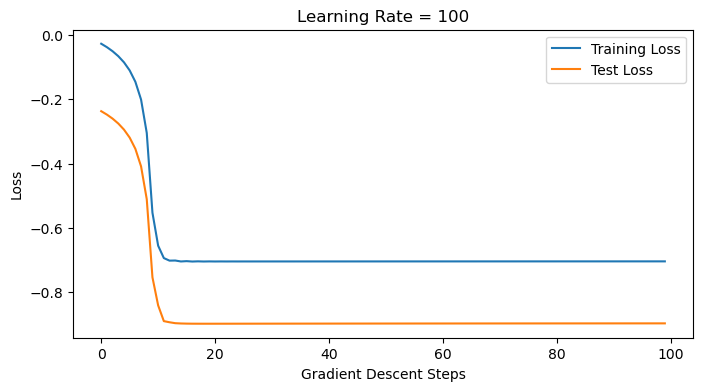

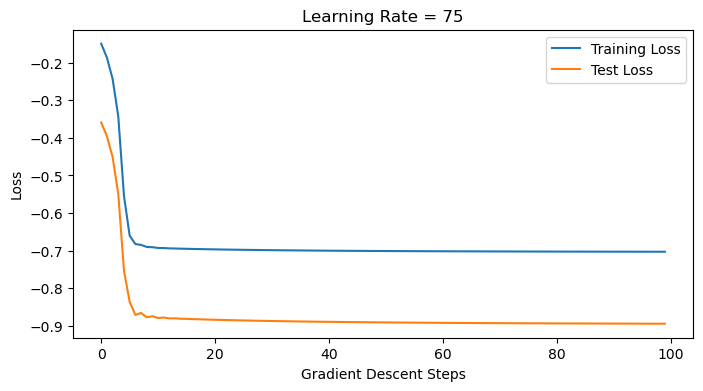

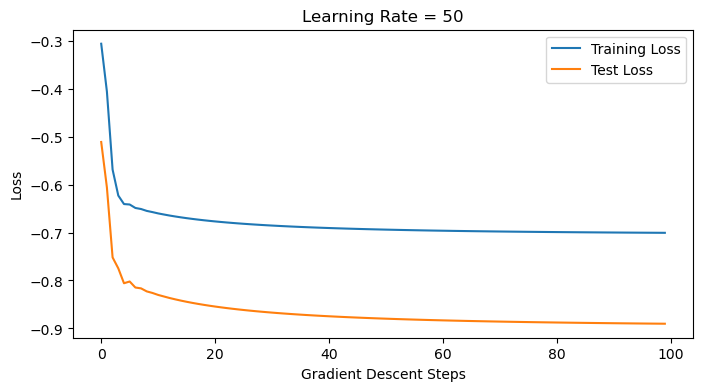

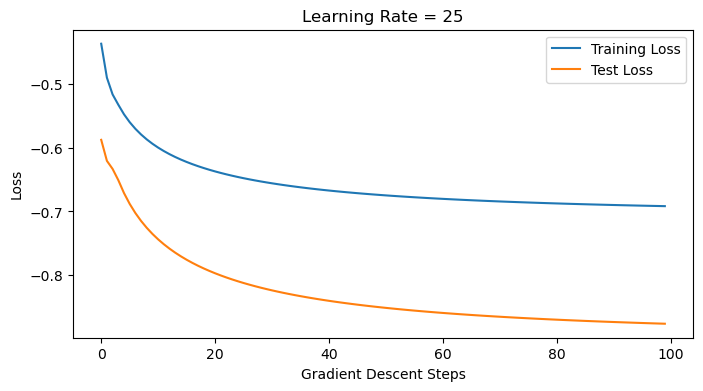

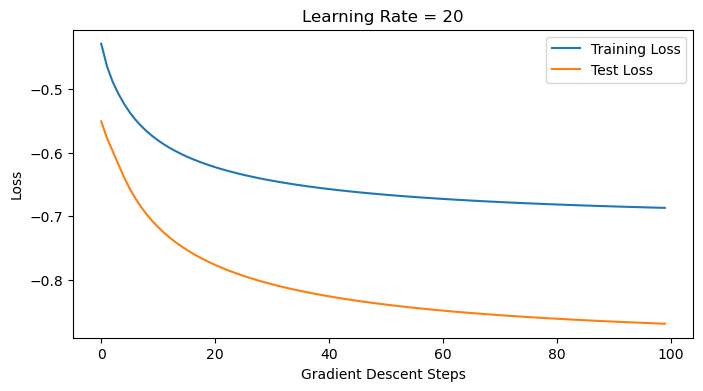

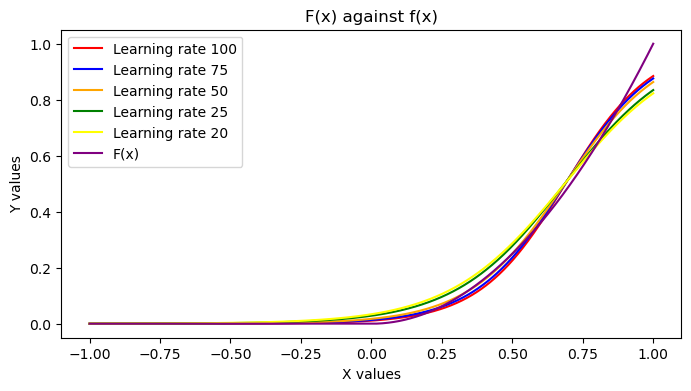

In [13]:
# Example usage:
N = 100  # Number of data points
X_train, Y_train, X_test, Y_test = generate_training_and_test_set2(N, F2)

learning_rates = [100, 75, 50, 25, 20]
funct=[]
for eta in learning_rates:
    a_final, b_final, para_a, para_b, J_train2, J_test2 = gradient_descent_logistic(X_train, Y_train, X_test, Y_test, 0, 0, eta, N)
    funct.append(lo(a_final, b_final))
    
    # Plot Training and Test Loss
    plt.figure(figsize=(8, 4))
    plt.plot(J_train2, label='Training Loss')
    plt.plot(J_test2, label='Test Loss')
    plt.title(f'Learning Rate = {eta}')
    plt.legend()
    plt.xlabel('Gradient Descent Steps')
    plt.ylabel('Loss')
    plt.show()
    
x_values = np.linspace(-1, 1, 1000)
y_values = F2(x_values)

#Plot all of the graphs
plt.figure(figsize=(8,4))
plt.plot(x_values, funct[0](x_values), color='red', label='Learning rate 100')
plt.plot(x_values, funct[1](x_values), color='blue', label='Learning rate 75')
plt.plot(x_values, funct[2](x_values), color='orange', label='Learning rate 50')
plt.plot(x_values, funct[3](x_values), color='green', label='Learning rate 25')
plt.plot(x_values, funct[4](x_values), color='yellow', label='Learning rate 20')
plt.plot(x_values, y_values, color='purple', label='F(x)')
plt.title('F(x) against f(x)')
plt.legend()
plt.xlabel('X values')
plt.ylabel('Y values')
plt.show()

#### Commentary

We notice a trend in our tests, where a larger learning rate doesnt consistently lead to better approximations, in most runs of the code, sometimes, larger learning rates like 100 and 75 will get better result than learning rate 50, but only in rare cases. Specifically, for learning rates 100 and 75, we observe a less accurate approximation compared to a learning rate of 50. However, increasing the learning rate from 20 to 50 results in progrssively better approximations. Indicating, that there is a potential limit, or maximum optimal learning rate.

Sometimes, we will get very similar values for the training/test loss graphs for the learning rates 15, 10, 5 and 100, 75, 50, 25. However, the graphs of the approximated functions against the "true" function of the bigger learning rates 100, 75, 50 will be much better, they will look a lot more like the "true" function we are trying to approximate. Indicating that even tho the training loss and test loss are similar, the final result is much better for bigger learning rates. Thus, confirmes our hypothesis that bigger learning rates will yield better results.

Furthermore, the graphs of the training/test loss for learning rates 50, 25 and 20 exhibit a similar "shape". This "shape" resembles an exponential curve, indicating an improvement in approximation over time. Notably, with larger learning rates like 50.

Also, we notice that the graph of the approximations against the "true" function yield MUCH better approximations.

Also, weirdly, sometimes the graph for learning rate 25 will be better than the one for learning rate 50, but the one for learning rate 100 will be better than both, which is very confusing.

A noteworthy observation is that the test loss consistently remains smaller than the training loss. This pattern is a positive indicator, suggesting that our trained functions are adept at approximating the "true" function.

Now, we study the evolution of the path of the gradient descent, to do so, we will use the big learning rates, we found were better at approximating the function.

### Coutour plot:
For different learning rates values and different initial parameters.

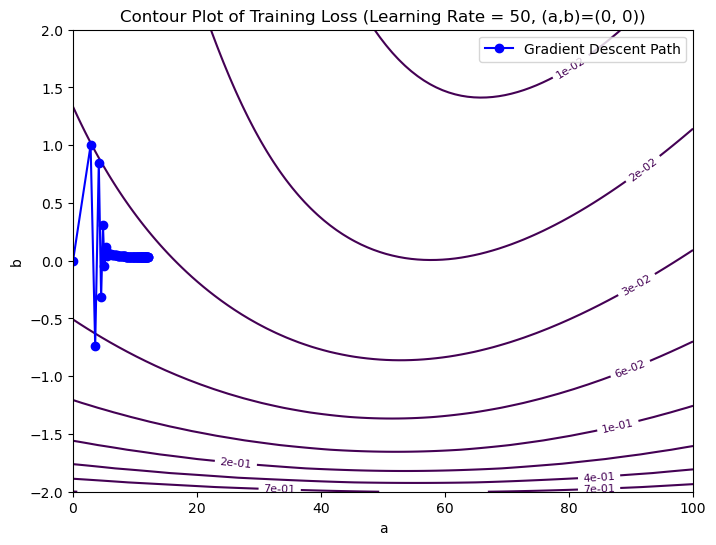

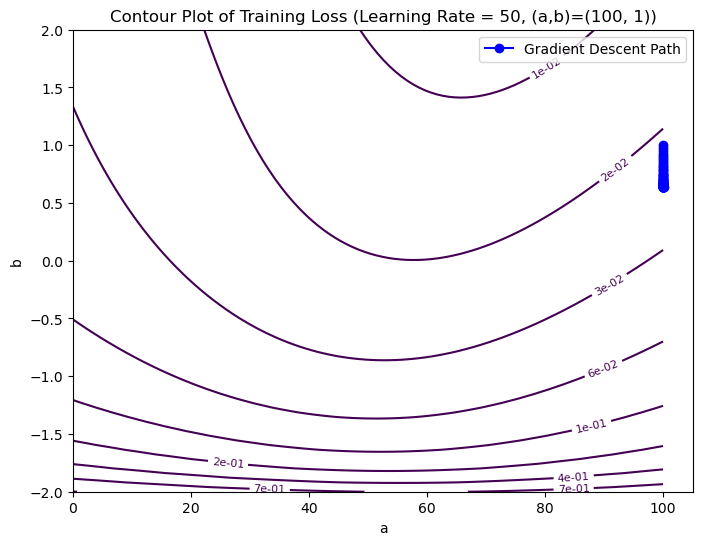

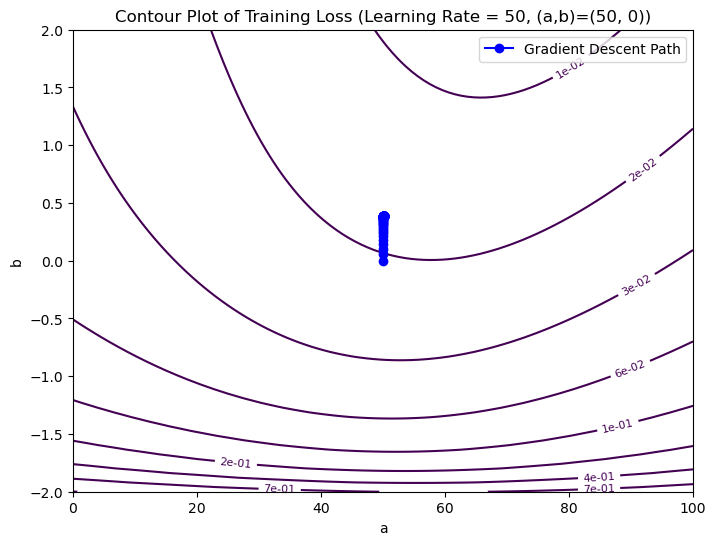

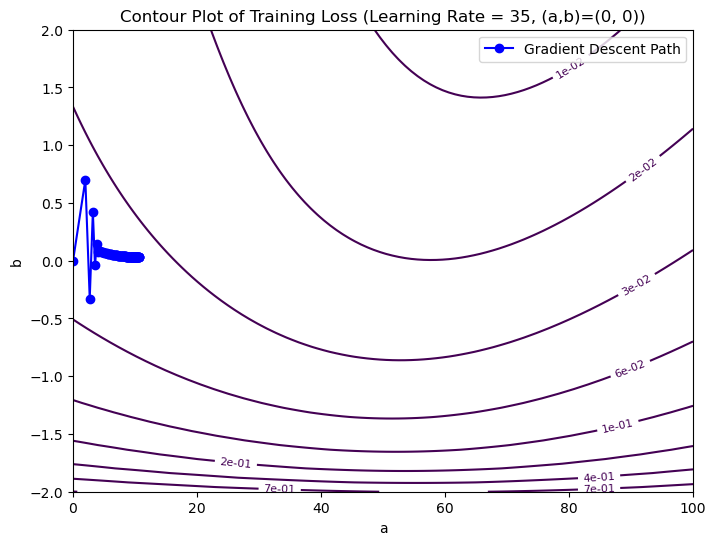

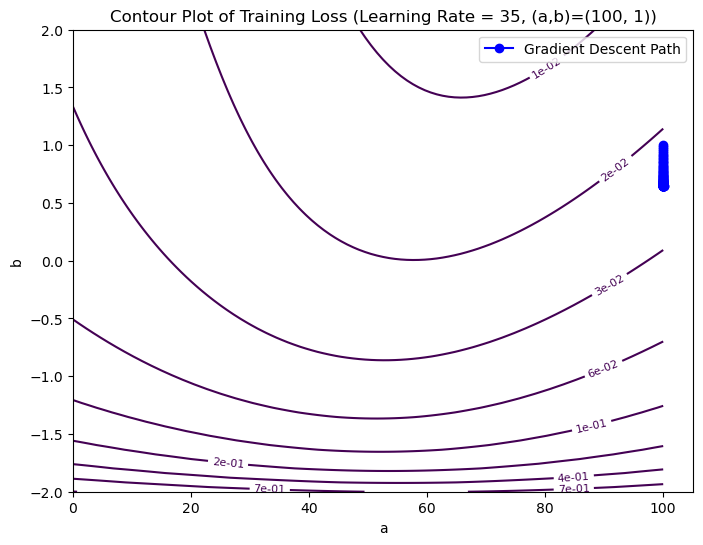

...

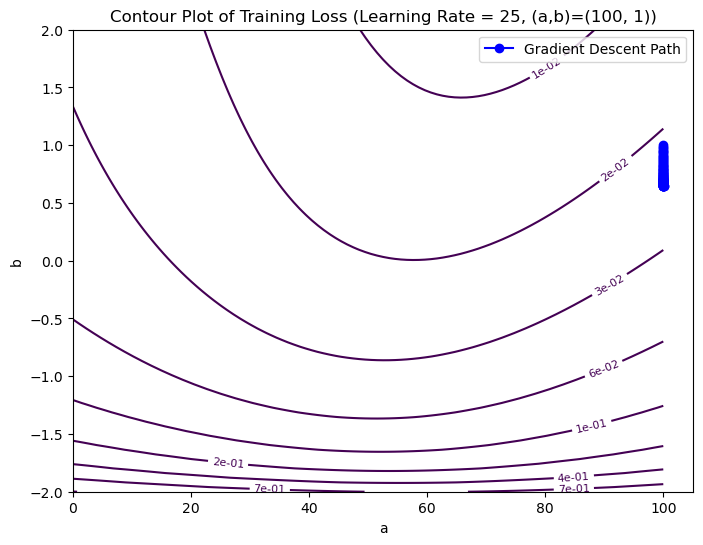

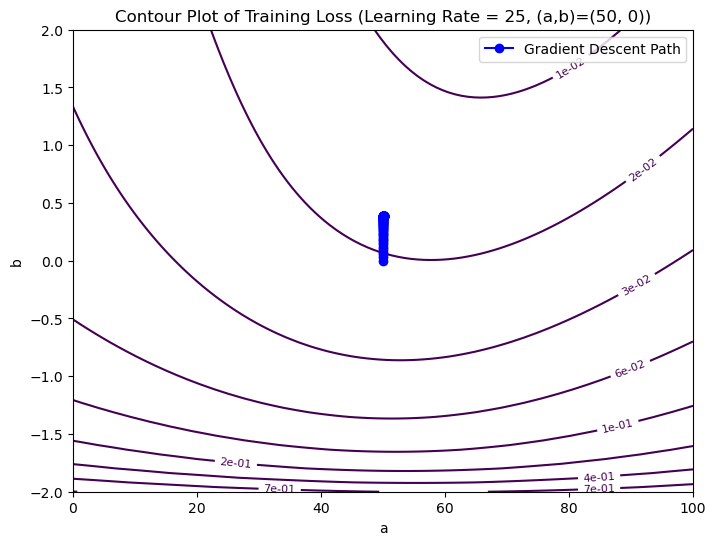

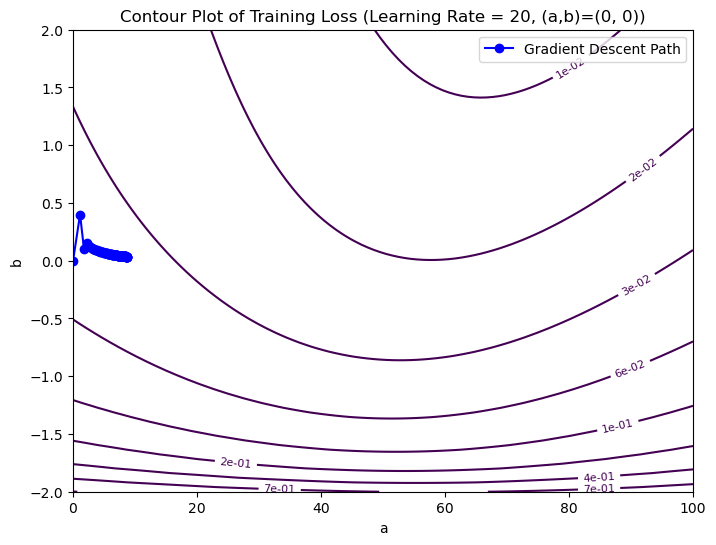

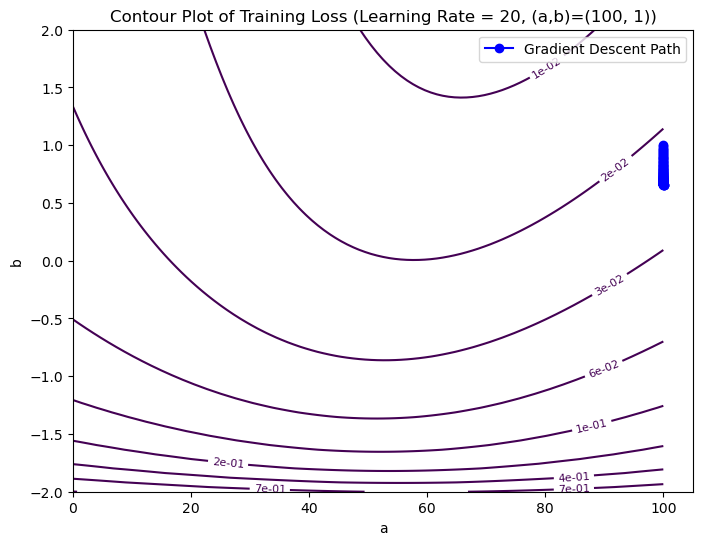

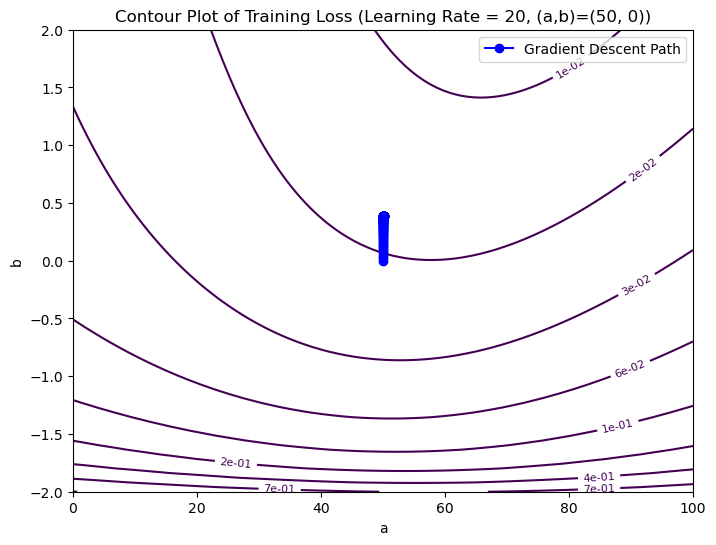

In [14]:
def lo(a,b):
    def go(x):
        z = np.clip(-(a*x+b), -700, 700) #Limits overflow, otherwise get overflow all the time.
        return 1 / (1 + np.exp(z))
    return go

#We implement the target function
def F2(x):
    return (x + np.abs(x))/(2*x)

# Define the cost function without taking logs for the contour plot
def compute_cost_without_logs(x, y, a, b, epsilon=1e-15):
    m = len(x)
    cost_sum = 0
    f = lo(a,b)
    for i in range(m):
        f_ab = f(x[i])
        cost = -y[i] * np.log(f_ab + epsilon) - (1 - y[i]) * np.log(1 - f_ab + epsilon)
        cost_sum += cost 
    total_cost = (1 / m) * cost_sum 
    return total_cost
        
# Function to plot contour and gradient descent path
def plot_contour_and_path(X_train, Y_train, learning_rate, a_initial, b_initial, num_steps):
    # Generate a range of values for a and b
    a_values = np.linspace(0, 100, 100)
    b_values = np.linspace(-2, 2, 100)

    # Create a grid of (a, b) values
    A, B = np.meshgrid(a_values, b_values)
    
    # Compute the cost for each (a, b) pair
    costs = np.zeros_like(A)
    for i in range(len(a_values)):
        for j in range(len(b_values)):
            costs[i, j] = compute_cost_without_logs(X_train, Y_train, a_values[i], b_values[j])
    # Plot the contour plot
    plt.figure(figsize=(8, 6))
    contour = plt.contour(A, B, costs, levels=np.logspace(-2, 3, 20))
    plt.clabel(contour, inline=True, fontsize=8, fmt='%1.0e')
    plt.title(f'Contour Plot of Training Loss (Learning Rate = {learning_rate}, (a,b)={a_initial, b_initial})')
    plt.xlabel('a')
    plt.ylabel('b')
    
    # Initialize variables for gradient descent
    a = a_initial
    b = b_initial
    
    # Lists to store the path of gradient descent
    path_a = [a]
    path_b = [b]
    
    # Perform gradient descent
    for step in range(num_steps):
        dj_da, dj_db = compute_gradient_logistic(X_train, Y_train, a, b)
        a = a - learning_rate * dj_da
        b = b - learning_rate * dj_db
        path_a.append(a)
        path_b.append(b)
    
    # Plot the path of gradient descent
    plt.plot(path_a, path_b, marker='o', color='blue', label='Gradient Descent Path')
    plt.legend()
    plt.show()

learning_rates = [50, 35, 25, 20]
initial_values = [(0, 0), (100, 1), (50, 0)]  # Different initial values for (a, b)
num_steps = 100
X_train, Y_train, X_test, Y_test = generate_training_and_test_set2(num_steps, F2)

# Perform experiments with different initial values and learning rates
for learning_rate in learning_rates:
    for a_initial, b_initial in initial_values:
        plot_contour_and_path(X_train, Y_train, learning_rate, a_initial, b_initial, num_steps)

### NOTE: THIS WILL TAKE A LONG TIME, BUT IT WILL WORK!

#### Commentary:

The challenge of dealing with an infinite true value for 'a' and a '0' true value for 'b' is indeed intriguing. It's interesting to observe how different initial values and learning rates impact the regression process.

For larger initial values of 'a', like 100, the regression tends to focus more on reducing 'b' rather than increasing 'a'. Similarly, for an initial value of 'a' as 50, the emphasis is on diminishing 'b'. However, when starting with (0,0) as initial values, the regression attempts to increase 'a' over time.

The consistent shape of the regression curves across different learning rates for the same initial values raises interesting questions. It could imply that certain combinations of initial values and learning rates guide the optimization process toward similar paths. The significance of this pattern is a bit elusive and might require further exploration.

Additionally, the observation about smaller learning rates leading to smaller distances between regression points aligns with what we've seen in linear regression. The impact of learning rate on the convergence and stability of the optimization process seems to carry over to logistic regression as well.

Given the past tests indicating the effectiveness of a learning rate of 50, it's a reasonable choice for delving into the effects of training data size. This consistency in choosing the learning rate provides a stable foundation for studying how the size of the training data influences the regression outcomes:

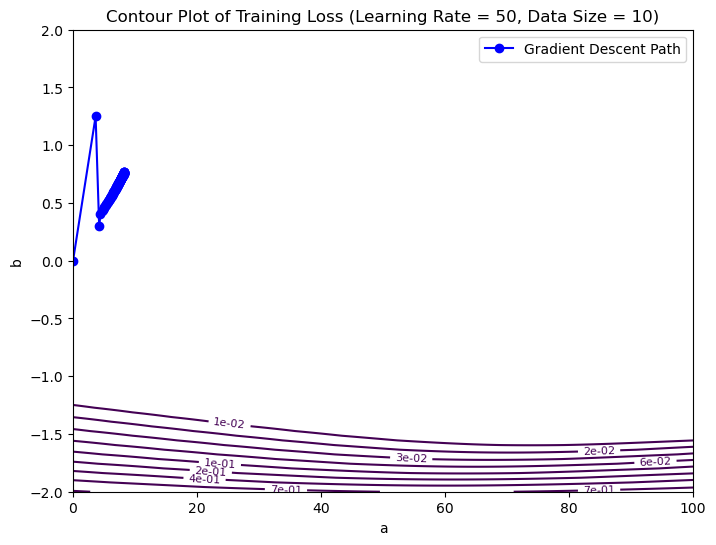

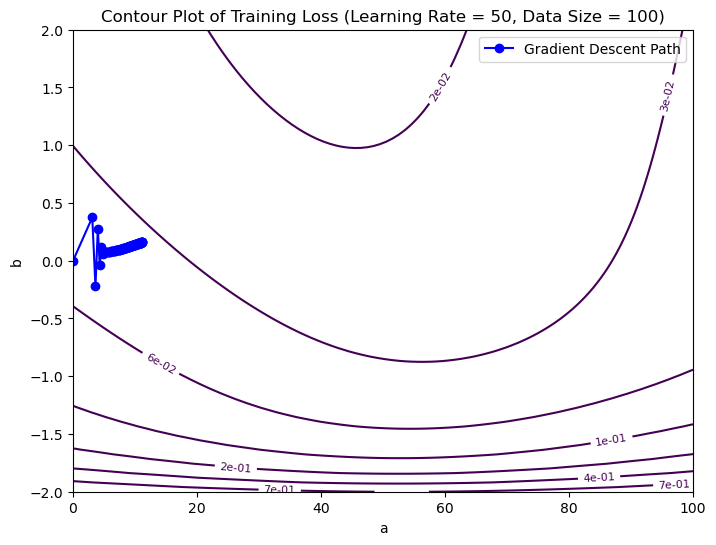

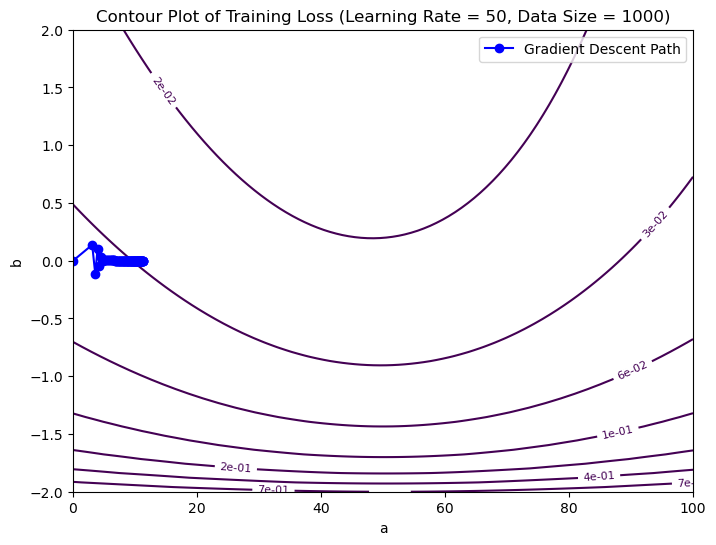

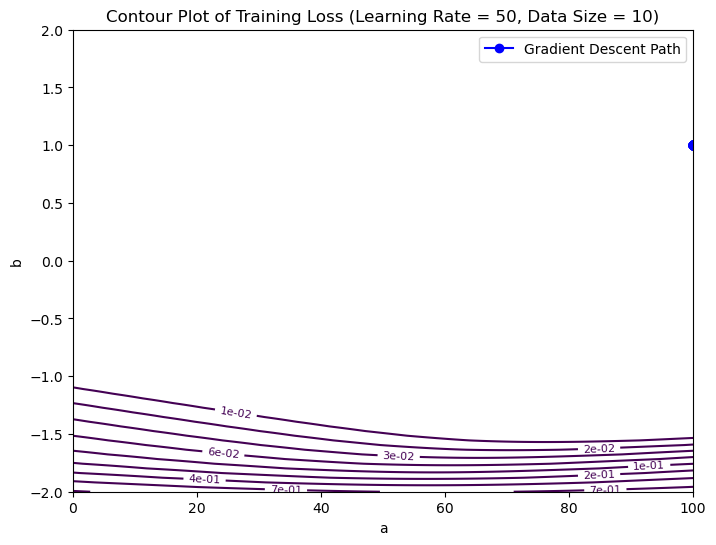

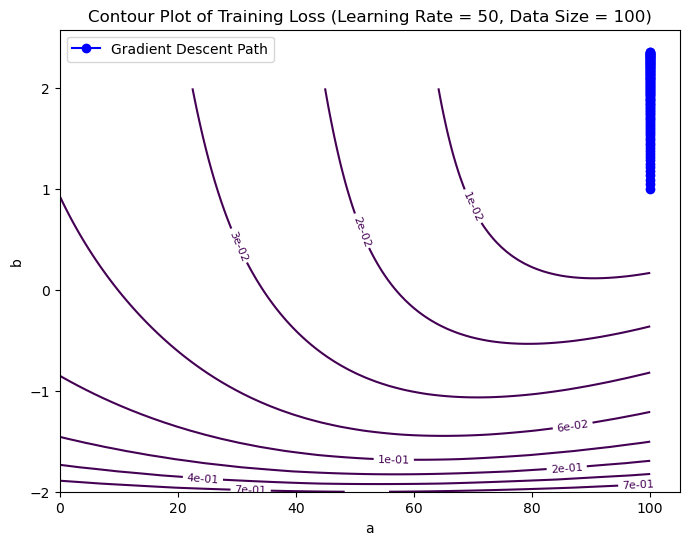

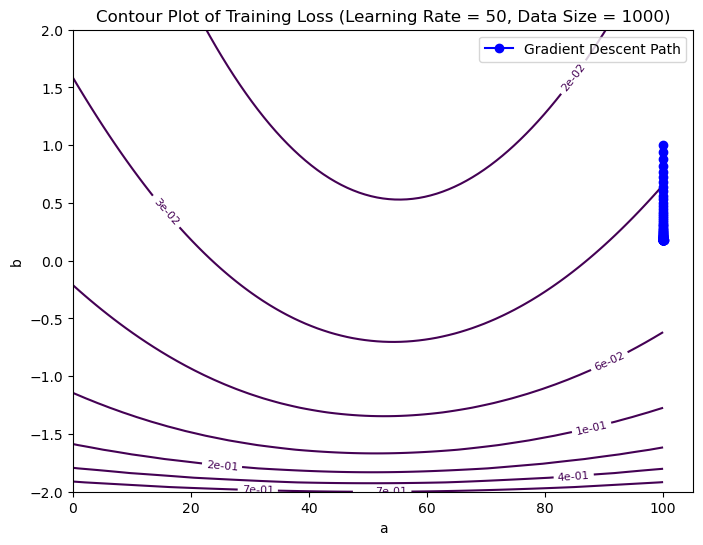

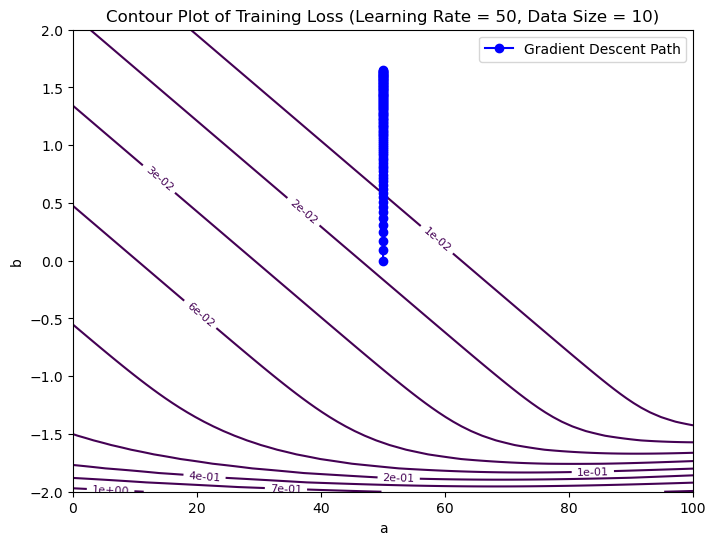

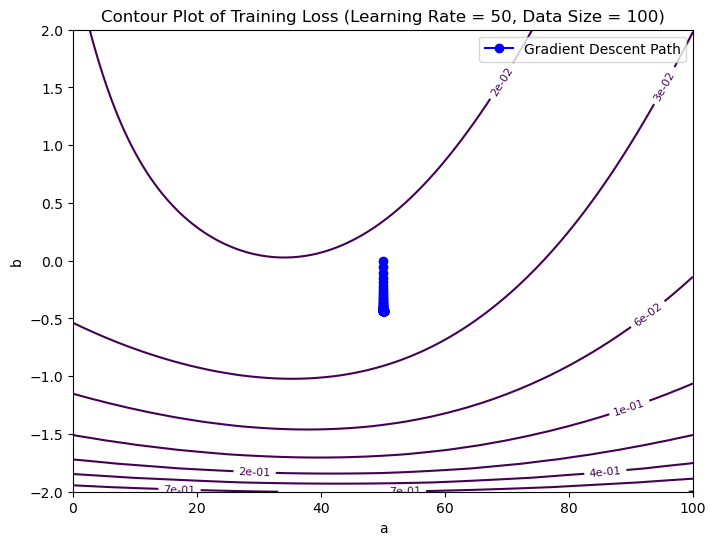

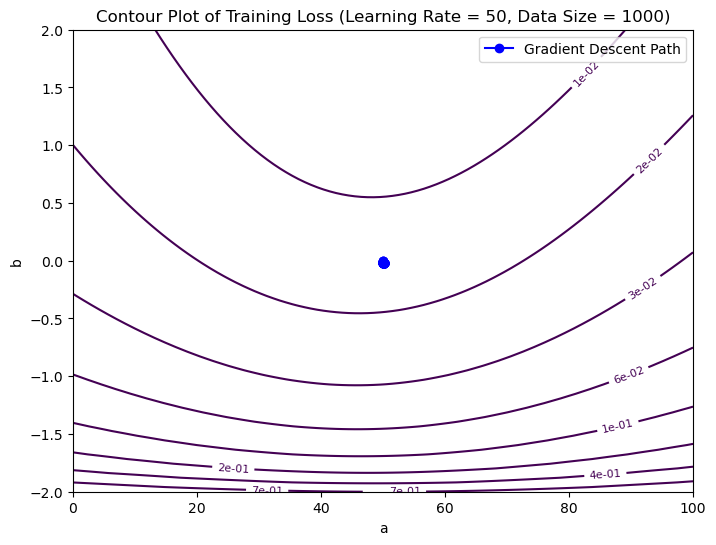

In [15]:
# Function to plot contour and gradient descent path
def plot_contour_and_path(X_train, Y_train, learning_rate, a_initial, b_initial, num_steps):
    # Generate a range of values for a and b
    a_values = np.linspace(0, 100, 100)
    b_values = np.linspace(-2, 2, 100)

    # Create a grid of (a, b) values
    A, B = np.meshgrid(a_values, b_values)
    
    # Compute the cost for each (a, b) pair
    costs = np.zeros_like(A)
    for i in range(len(a_values)):
        for j in range(len(b_values)):
            costs[i, j] = compute_cost_without_logs(X_train, Y_train, a_values[i], b_values[j])

    # Plot the contour plot
    plt.figure(figsize=(8, 6))
    contour = plt.contour(A, B, costs, levels=np.logspace(-2, 3, 20))
    plt.clabel(contour, inline=True, fontsize=8, fmt='%1.0e')
    plt.title(f'Contour Plot of Training Loss (Learning Rate = {learning_rate}, Data Size = {len(X_train)})')
    plt.xlabel('a')
    plt.ylabel('b')
    
    # Initialize variables for gradient descent
    a = a_initial
    b = b_initial
    
    # Lists to store the path of gradient descent
    path_a = [a]
    path_b = [b]
    
    # Perform gradient descent
    for step in range(num_steps):
        dj_da, dj_db = compute_gradient_logistic(X_train, Y_train, a, b)
        a = a - learning_rate * dj_da
        b = b - learning_rate * dj_db
        path_a.append(a)
        path_b.append(b)
    
    # Plot the path of gradient descent
    plt.plot(path_a, path_b, marker='o', color='blue', label='Gradient Descent Path')
    plt.legend()
    plt.show()

# Set the learning rates, initial values, and number of steps
learning_rates = [50]
initial_values = [(0, 0), (100, 1), (50, 0)]  # Different initial values for (a, b)
training_data_sizes = [10, 100, 1000]
num_steps = 100

# Perform experiments with different initial values, learning rates, and training data sizes
for learning_rate in learning_rates:
    for a_initial, b_initial in initial_values:
        for training_data_size in training_data_sizes:
            X_train, Y_train, X_test, Y_test = generate_training_and_test_set2(training_data_size, F2)
            plot_contour_and_path(X_train, Y_train, learning_rate, a_initial, b_initial, num_steps)

### AGAIN: I STRONGLY ADVISE AGAINST RUNNING THIS BECAUSE IT WILL TAKE A LONG TIME

#### Commentary

The regression plots remain challenging to interpret, and extracting meaningful observations from them is a tough nut to crack. A detailed look reveals that the starting points significantly influence whether the regression behaves differently based on the number of training data.

For the starting point (0,0), the regression with a training data size of 10 exhibits a troubling pattern. It slowly increases the value of 'a' but excessively diminishes 'b,' diverging from the initial real value of 0. This downward trend in 'b' continues, yielding progressively worse values.

In contrast, the starting point (100, 1) results in a consistently downward-sloping regression line for all training data sizes. The best approximation occurs with a data size of 1000, as the data size of 100 mimics the problematic behavior seen with (0,0), going too low and providing inferior values for 'b.'

The initial value (50, 0) produces a different pattern. The regression for a data size of 10 resembles a dot, indicating minimal movement which is reasonable since (50,0) is already a strong approximation for the function. Both data sizes 100 and 1000 exhibit an L shape, but the data size of 100 goes too low, resulting in poorer 'b' values. The best approximation emerges with a data set size of 1000.

Conclusively, a larger dataset consistently improves regression outcomes. However, the overarching challenge remains: the "true" value of 'a' being infinity makes accurate approximation impossible. Nevertheless, the surprisingly effective approximations achieved with 'a' values like 50 or 100 further complicate drawing concrete conclusions, revealing the intricacies of logistic regression in this context.

This section of the lab has left me feeling dissatisfied and disappointed. Despite diligently following the theory, studying online resources, and putting in the effort, achieving satisfactory approximations remains elusive. The inherent difficulty arises from the nature of the function being approximated. As we encountered in lab3, attempting to approximate functions with asymptotic behaviors poses an exceptionally challenging task. The step function, with its asymptotic behavior, falls into this category, making the process of obtaining accurate and aesthetically pleasing graphs exceedingly difficult.

## q3: Stochastic Gradient Descent

We use the same "true" function: f(x) = (x + |x|)/2x

Stochastic gradient descent updates the parameters more often.
Use the implementation from the textbook:

In [16]:
#We implement the sigmoid function
def lo(a,b):
    def go(x):
        return 1 / (1 + np.exp(-(a*x+b)))
    return go

#We implement the target function
def F2(x):
    return (x + np.abs(x))/(2*x)

def compute_cost_logistic(x, y, a, b, epsilon=1e-15):
    m = len(x)
    cost_sum = 0
    f = lo(a,b)
    for i in range(m):
        f_ab = f(x[i])
        cost = -(y[i] * np.log(f_ab + epsilon) + (1 - y[i]) * np.log(1 - f_ab + epsilon))
        cost_sum += cost 
    total_cost = (1/m) * cost_sum 
    return total_cost

#Now, we define a function to compute the gradient
def compute_gradient_logistic(x, y, a, b):
    #Only one example per computation
    f = lo(a,b)
    f_ab = f(x)
    err = f_ab - y
    f_abPrime = f_ab*(1-f_ab) #compute sigma prime
    #Apply the formulas above, and add to sum
    dj_db = err * f_abPrime
    dj_da = err * f_abPrime * x
    
    return dj_da, dj_db

def stochas_gradient_descent_logistic(x_train, y_train, x_test, y_test, a_in, b_in, eta, n):
    #Array to store the errors, for plotting graphs
    para_a = []
    para_b = []
    J_train_history = []
    J_test_history = []
    
    a = a_in
    b = b_in
    
    data = list(zip(x_train, y_train)) #Need to put them together 
    for i in range(n):
        np.random.shuffle(data)
        for example in data:
            x_example, y_example = example #example is a tuple 
            #Compute the gradient
            dj_da, dj_db = compute_gradient_logistic(x_example, y_example, a, b)
            #Update the parameters with the above function
            a = a - eta * dj_da
            b = b - eta * dj_db
        
        J_train_history.append(np.log10(compute_cost_logistic(x_train, y_train, a, b)))
        J_test_history.append(np.log10(compute_cost_logistic(x_test, y_test, a, b)))
    
    return a, b, para_a, para_b, J_train_history, J_test_history

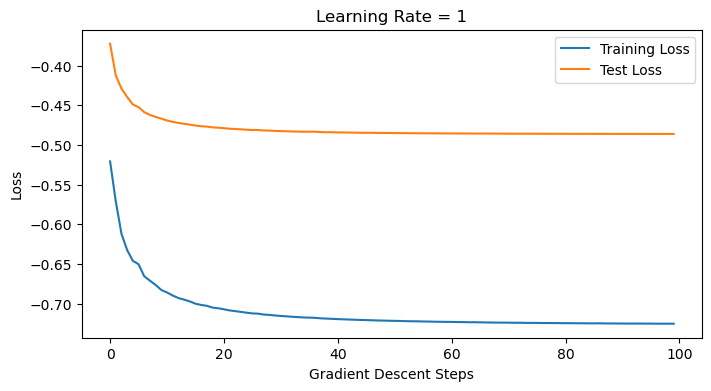

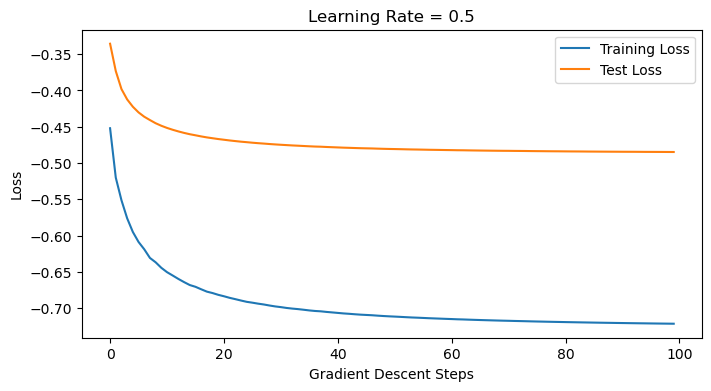

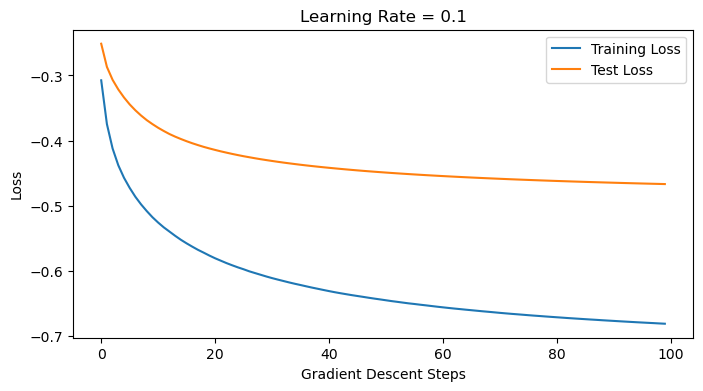

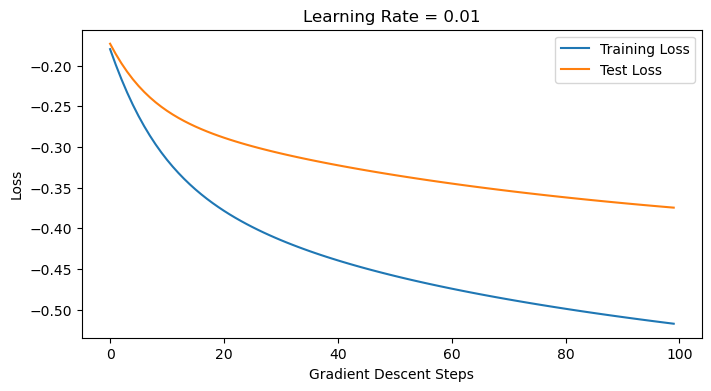

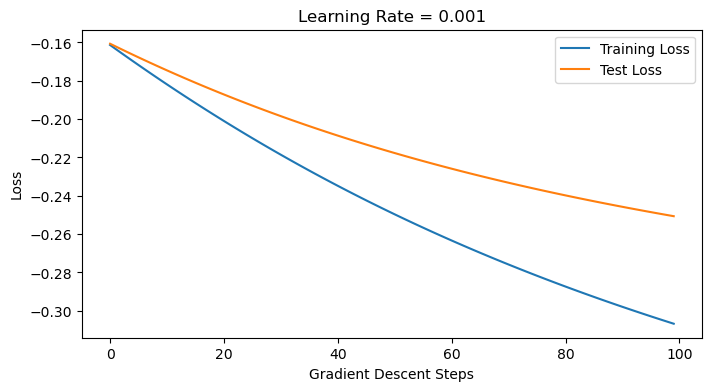

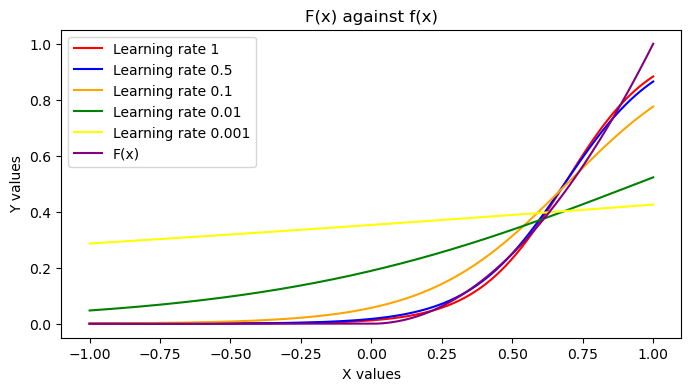

In [17]:
def target_function(x):
    return (x+np.abs(x))/2*x

#First, we create a set of training data and test data
def generate_training_and_test_set2(N, f):
    # Generate N random x values uniformly in the interval [-1, 1]
    X_train = np.random.uniform(low=-1, high=1, size=N)
    X_test = np.random.uniform(low=-1, high=1, size=int(N/4))
    
    # Generate random errors with a normal distribution
    errors_train = np.random.normal(0, 1e-16, N)  
    errors_test = np.random.normal(0, 1e-16, int(N/4))  

    # Calculate y values based on the function F(x) and add random errors
    Y_train = [f(x) + e for x, e in zip(X_train, errors_train)]
    Y_test = [f(x) + e for x, e in zip(X_test, errors_test)]

    return X_train, Y_train, X_test, Y_test
    
# Example usage:
N = 100  # Number of data points
X_train, Y_train, X_test, Y_test = generate_training_and_test_set2(N, target_function)

learning_rates = [1, 0.5, 0.1, 0.01, 0.001]
funct=[]
for eta in learning_rates:
    a_final, b_final, para_a, para_b, J_train2, J_test2 = stochas_gradient_descent_logistic(X_train, Y_train, X_test, Y_test, 0, 0, eta, N)
    funct.append(lo(a_final, b_final))
    
    
    # Plot Training and Test Loss
    plt.figure(figsize=(8, 4))
    plt.plot(J_train2, label='Training Loss')
    plt.plot(J_test2, label='Test Loss')
    plt.title(f'Learning Rate = {eta}')
    plt.legend()
    plt.xlabel('Gradient Descent Steps')
    plt.ylabel('Loss')
    plt.show()
    
x_values = np.linspace(-1, 1, 1000)
y_values = target_function(x_values)

#Plot all of the graphs
plt.figure(figsize=(8,4))
plt.plot(x_values, funct[0](x_values), color='red', label='Learning rate 1')
plt.plot(x_values, funct[1](x_values), color='blue', label='Learning rate 0.5')
plt.plot(x_values, funct[2](x_values), color='orange', label='Learning rate 0.1')
plt.plot(x_values, funct[3](x_values), color='green', label='Learning rate 0.01')
plt.plot(x_values, funct[4](x_values), color='yellow', label='Learning rate 0.001')
plt.plot(x_values, y_values, color='purple', label='F(x)')
plt.title('F(x) against f(x)')
plt.legend()
plt.xlabel('X values')
plt.ylabel('Y values')
plt.show()

#### Commentary

Curiously, the training and test loss graphs exhibit a consistent pattern across all learning rates, resembling the shape observed in batch gradient descent. An interesting parallel is that higher learning rates correspond to better training and test loss values.

Adding to the peculiarity, the test and training loss graphs change with each run of the code, resulting in either improved or slightly less accurate approximation values. Nevertheless, what remains consistent is the remarkable precision of the "final" graphs for learning rates 1 and 0.5.

Surprisingly, despite using the same learning rates as in batch gradient descent, stochastic gradient descent produces significantly improved training and test loss values, suggesting its greater relevance in this context. Notably, the final approximation graphs closely resemble the true function we aim to model. In fact, they are on par or even superior to the graphs obtained through batch gradient descent with larger learning rates like 100 and 50. This reaffirms the effectiveness of stochastic gradient descent in this particular scenario.

Given these insights, let's experiment by further increasing the learning rates:

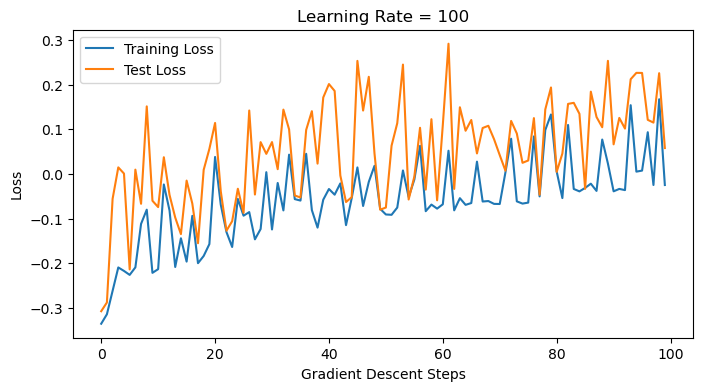

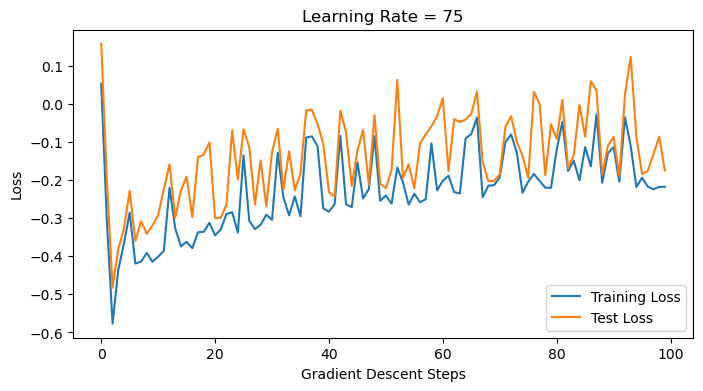

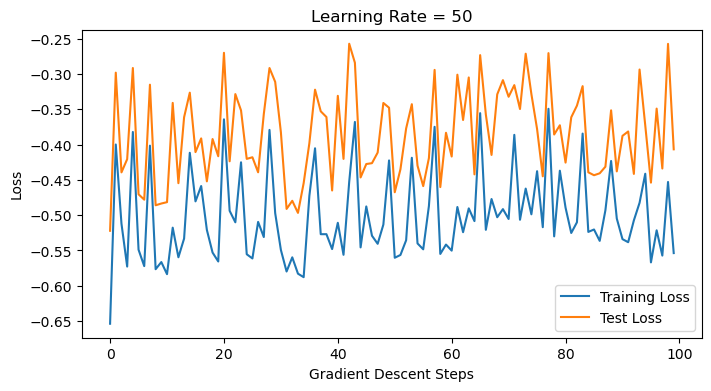

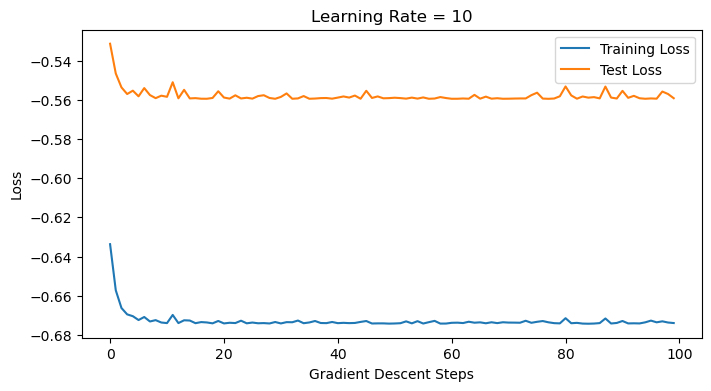

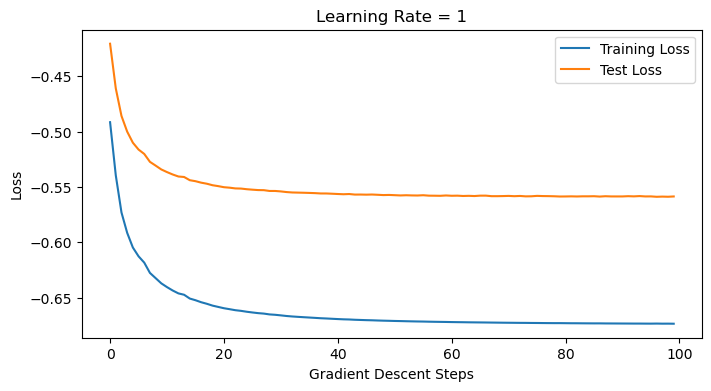

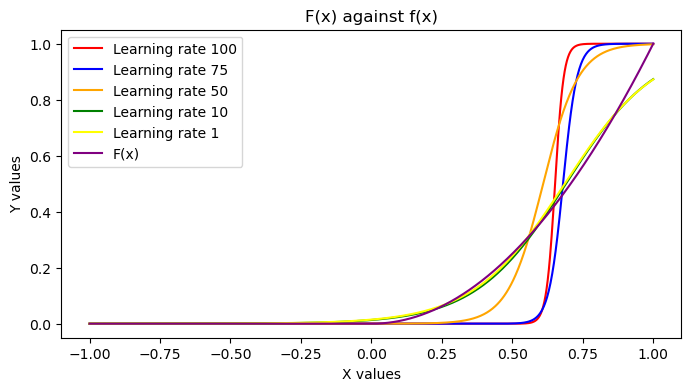

In [18]:
def target_function(x):
    return (x+np.abs(x))/2*x

#First, we create a set of training data and test data
def generate_training_and_test_set2(N, f):
    # Generate N random x values uniformly in the interval [-1, 1]
    X_train = np.random.uniform(low=-1, high=1, size=N)
    X_test = np.random.uniform(low=-1, high=1, size=int(N/4))
    
    # Generate random errors with a normal distribution
    errors_train = np.random.normal(0, 1e-16, N)  
    errors_test = np.random.normal(0, 1e-16, int(N/4))  

    # Calculate y values based on the function F(x) and add random errors
    Y_train = [f(x) + e for x, e in zip(X_train, errors_train)]
    Y_test = [f(x) + e for x, e in zip(X_test, errors_test)]

    return X_train, Y_train, X_test, Y_test
    
# Example usage:
N = 100  # Number of data points
X_train, Y_train, X_test, Y_test = generate_training_and_test_set2(N, target_function)

learning_rates = [100, 75, 50, 10, 1]
funct=[]
for eta in learning_rates:
    a_final, b_final, para_a, para_b, J_train2, J_test2 = stochas_gradient_descent_logistic(X_train, Y_train, X_test, Y_test, 0, 0, eta, N)
    funct.append(lo(a_final, b_final))
    
    
    # Plot Training and Test Loss
    plt.figure(figsize=(8, 4))
    plt.plot(J_train2, label='Training Loss')
    plt.plot(J_test2, label='Test Loss')
    plt.title(f'Learning Rate = {eta}')
    plt.legend()
    plt.xlabel('Gradient Descent Steps')
    plt.ylabel('Loss')
    plt.show()
    
x_values = np.linspace(-1, 1, 1000)
y_values = target_function(x_values)

#Plot all of the graphs
plt.figure(figsize=(8,4))
plt.plot(x_values, funct[0](x_values), color='red', label='Learning rate 100')
plt.plot(x_values, funct[1](x_values), color='blue', label='Learning rate 75')
plt.plot(x_values, funct[2](x_values), color='orange', label='Learning rate 50')
plt.plot(x_values, funct[3](x_values), color='green', label='Learning rate 10')
plt.plot(x_values, funct[4](x_values), color='yellow', label='Learning rate 1')
plt.plot(x_values, y_values, color='purple', label='F(x)')
plt.title('F(x) against f(x)')
plt.legend()
plt.xlabel('X values')
plt.ylabel('Y values')
plt.show()

#### Commentary

As outlined in the theoretical context, the use of large learning rates, such as 100, 75, and 50 (subject to variations in code runs), leads to evident and pronounced fluctuations in the training and test loss graphs.

A perplexing observation emerges when comparing the test and training loss graphs of learning rates 10 and 1—often yielding superior values compared to the larger learning rates of 100, 75, and 50. However, upon examining the final approximation graphs against the "true" function, it becomes apparent that the final graphs for learning rates 1 and 10 appear more accurate than those for larger learning rates. Intriguingly, the true graph of the true function, while not resembling the plotted graph, exhibits a shape remarkably similar to the final graphs of learning rates 100, 75, and 50. Despite the visual disparity, these final graphs prove to be faithful representations of the true function.

In light of these findings, it is noteworthy that, contrary to visual impressions, greater learning rates result in more accurate approximations. To mitigate the pronounced fluctuations, the textbook suggests a gradual reduction in the learning rate. Consequently, this will be the next step in the exploration.

In [19]:
#We implement the sigmoid function
def lo(a,b):
    def go(x):
        return 1 / (1 + np.exp(-(a*x+b)))
    return go

#We implement the target function
def F2(x):
    return (x + np.abs(x))/(2*x)

def compute_cost_logistic(x, y, a, b, epsilon=1e-15):
    m = len(x)
    cost_sum = 0
    f = lo(a,b)
    for i in range(m):
        f_ab = f(x[i])
        cost = -(y[i] * np.log(f_ab + epsilon) + (1 - y[i]) * np.log(1 - f_ab + epsilon))
        cost_sum += cost 
    total_cost = (1/m) * cost_sum 
    return total_cost

#Now, we define a function to compute the gradient
def compute_gradient_logistic(x, y, a, b):
    #Only one example per computation
    f = lo(a,b)
    f_ab = f(x)
    err = f_ab - y
    f_abPrime = f_ab*(1-f_ab) #compute sigma prime
    #Apply the formulas above, and add to sum
    dj_db = err * f_abPrime
    dj_da = err * f_abPrime * x
    
    return dj_da, dj_db

def stochas_gradient_descent_logistic(x_train, y_train, x_test, y_test, a_in, b_in, eta, n):
    #Array to store the errors, for plotting graphs
    para_a = []
    para_b = []
    J_train_history = []
    J_test_history = []
    
    a = a_in
    b = b_in
    
    data = list(zip(x_train, y_train)) #Need to put them together 
    for i in range(n):
        np.random.shuffle(data)
        #At each iteration, we reduce the learning rate.
        theta = eta / (i+1) #need plus one or we get division by 0 at first
        for example in data:
            x_example, y_example = example #example is a tuple 
            #Compute the gradient
            dj_da, dj_db = compute_gradient_logistic(x_example, y_example, a, b)
            #Update the parameters with the above function
            a = a - theta * dj_da
            b = b - theta * dj_db
        
        J_train_history.append(np.log10(compute_cost_logistic(x_train, y_train, a, b)))
        J_test_history.append(np.log10(compute_cost_logistic(x_test, y_test, a, b)))
    
    return a, b, para_a, para_b, J_train_history, J_test_history

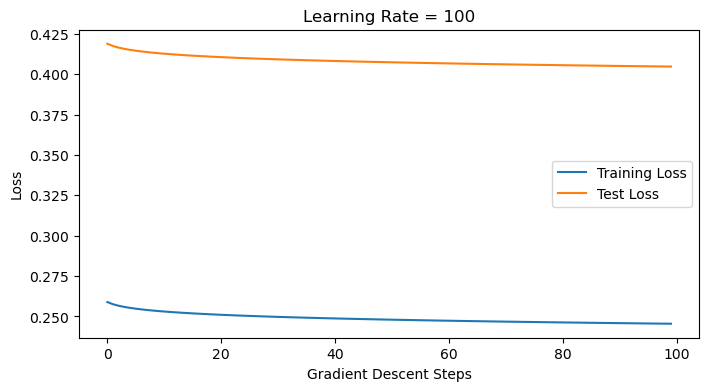

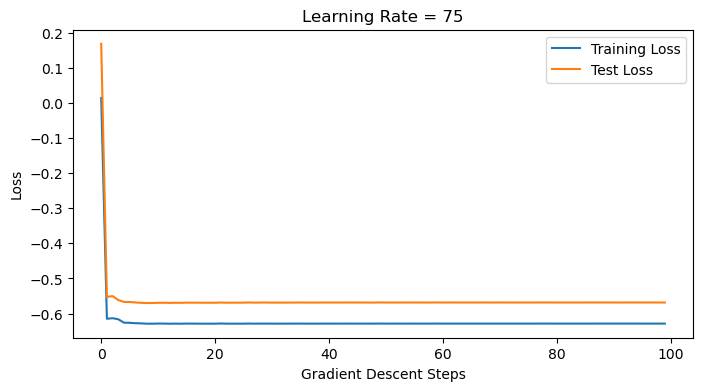

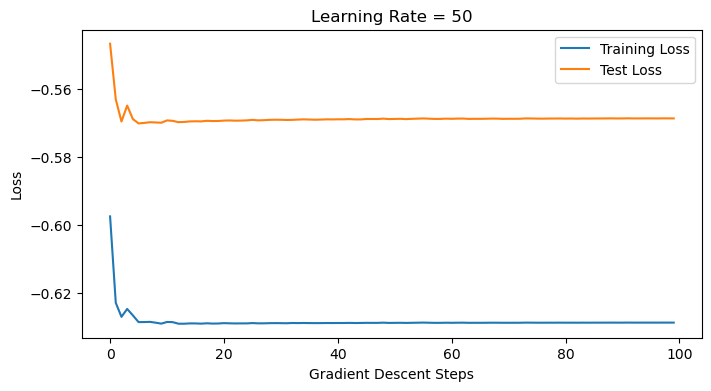

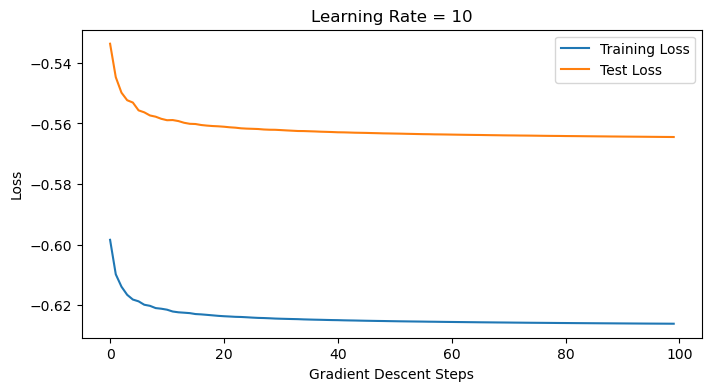

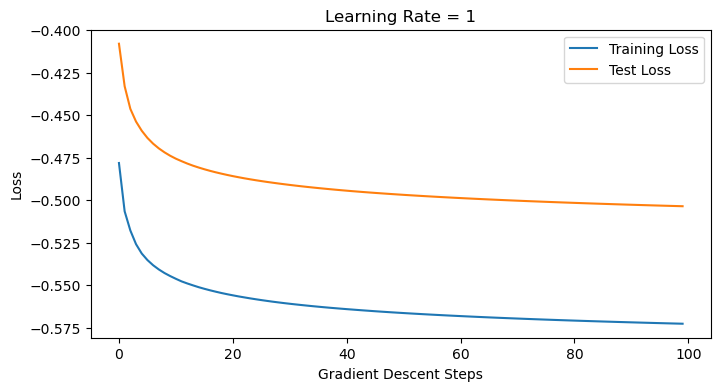

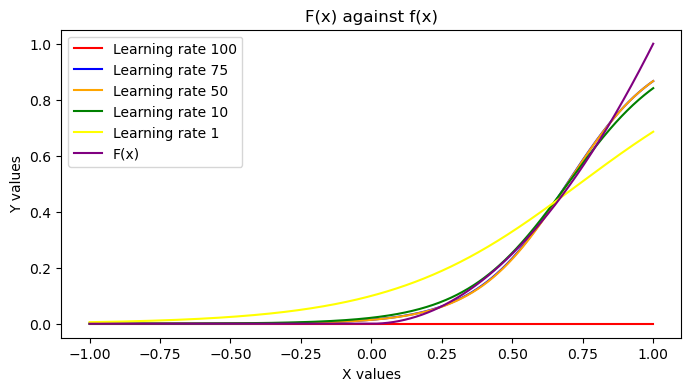

In [20]:
def target_function(x):
    return (x+np.abs(x))/2*x

#First, we create a set of training data and test data
def generate_training_and_test_set2(N, f):
    # Generate N random x values uniformly in the interval [-1, 1]
    X_train = np.random.uniform(low=-1, high=1, size=N)
    X_test = np.random.uniform(low=-1, high=1, size=int(N/4))
    
    # Generate random errors with a normal distribution
    errors_train = np.random.normal(0, 1e-16, N)  
    errors_test = np.random.normal(0, 1e-16, int(N/4))  

    # Calculate y values based on the function F(x) and add random errors
    Y_train = [f(x) + e for x, e in zip(X_train, errors_train)]
    Y_test = [f(x) + e for x, e in zip(X_test, errors_test)]

    return X_train, Y_train, X_test, Y_test
    
# Example usage:
N = 100  # Number of data points
X_train, Y_train, X_test, Y_test = generate_training_and_test_set2(N, target_function)

learning_rates = [100, 75, 50, 10, 1]
funct=[]
for eta in learning_rates:
    a_final, b_final, para_a, para_b, J_train2, J_test2 = stochas_gradient_descent_logistic(X_train, Y_train, X_test, Y_test, 0, 0, eta, N)
    funct.append(lo(a_final, b_final))
    
    
    # Plot Training and Test Loss
    plt.figure(figsize=(8, 4))
    plt.plot(J_train2, label='Training Loss')
    plt.plot(J_test2, label='Test Loss')
    plt.title(f'Learning Rate = {eta}')
    plt.legend()
    plt.xlabel('Gradient Descent Steps')
    plt.ylabel('Loss')
    plt.show()
    
x_values = np.linspace(-1, 1, 1000)
y_values = target_function(x_values)

#Plot all of the graphs
plt.figure(figsize=(8,4))
plt.plot(x_values, funct[0](x_values), color='red', label='Learning rate 100')
plt.plot(x_values, funct[1](x_values), color='blue', label='Learning rate 75')
plt.plot(x_values, funct[2](x_values), color='orange', label='Learning rate 50')
plt.plot(x_values, funct[3](x_values), color='green', label='Learning rate 10')
plt.plot(x_values, funct[4](x_values), color='yellow', label='Learning rate 1')
plt.plot(x_values, y_values, color='purple', label='F(x)')
plt.title('F(x) against f(x)')
plt.legend()
plt.xlabel('X values')
plt.ylabel('Y values')
plt.show()

#### Commentary

Notably, we've managed to mitigate fluctuations, and in some instances, completely eliminate them. 

Something really important to note is that the result of this, HEAVILY varies depending on the run of the code. Indeed, sometimes, we will get really good errors like -0.85, and sometimes we will get errors that are positive which is really bad. Also, the "best" learning rate, seems to be impossible to figure out, at each run of the code, we get completely different results for the test/training loss graphs, and for the final approximations graphs, we mostly get the same thing, but sometimes, we get some really weird functions, indicating anomalies.

Interestingly, with the introduction of progressive diminution, the final approximation graphs exhibit a remarkable similarity to the "true" function. Nevertheless, this comes at the cost of losing the true shape of the "real" "true" function, particularly for larger learning rates. While these graphs appear to be good approximations and closely resemble the actual graph, it's crucial to emphasize that they deviate from the genuine shape of the "true" "true" function—a step function that we successfully replicated without diminishing the learning rates.

However, by running this code MULTIPLE TIMES, I managed once or twice to make the final approximation graph of learning rate 100 look like the "real" "true" function, but it doesnt append really often.

### Coutour plot:
For different learning rates values and different initial parameters.

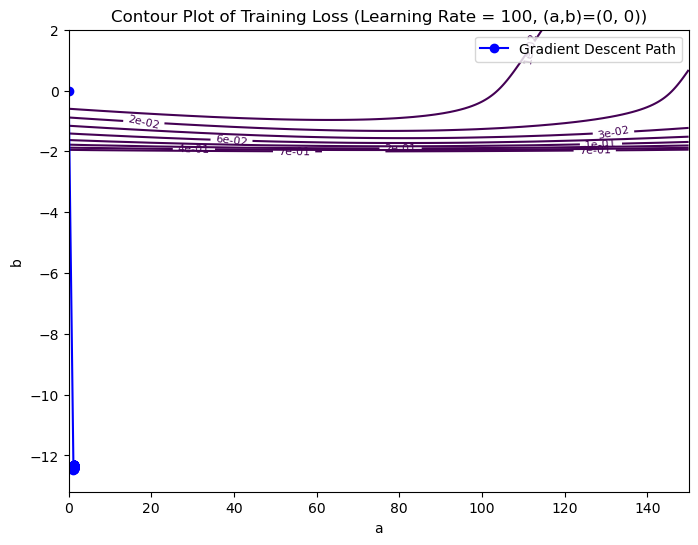

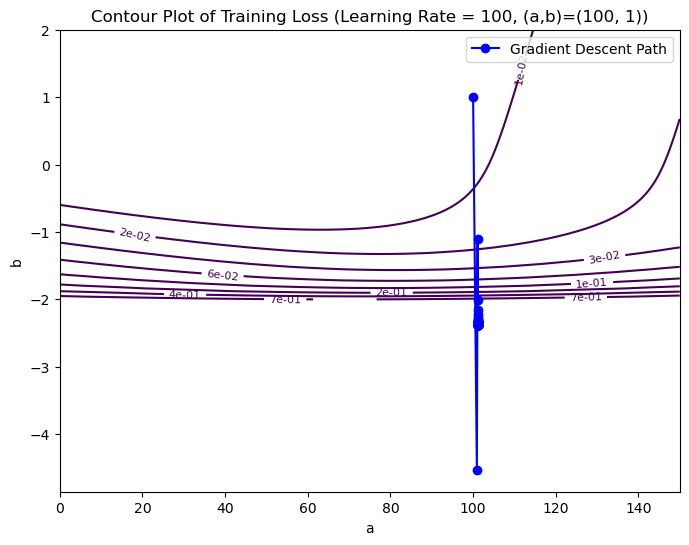

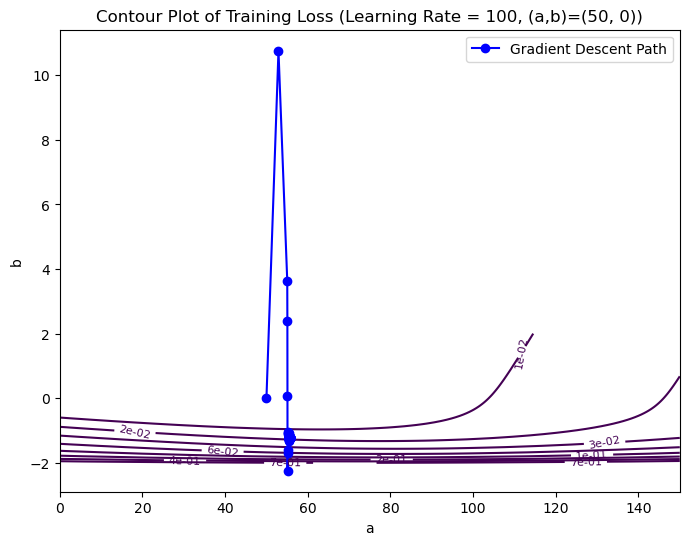

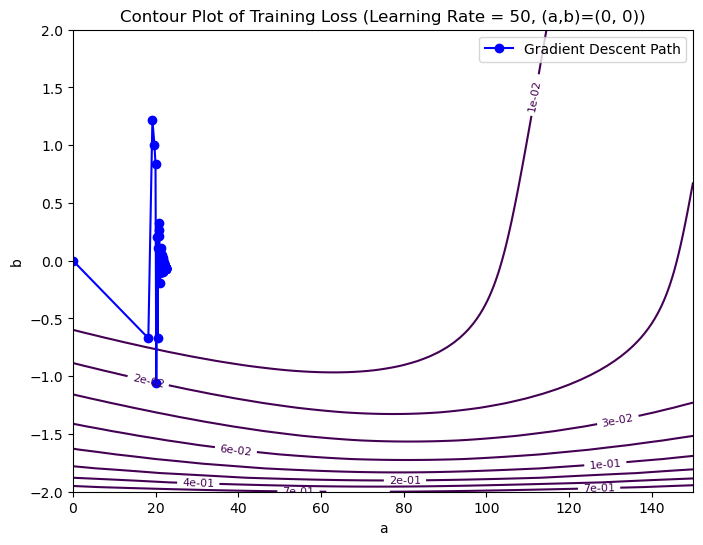

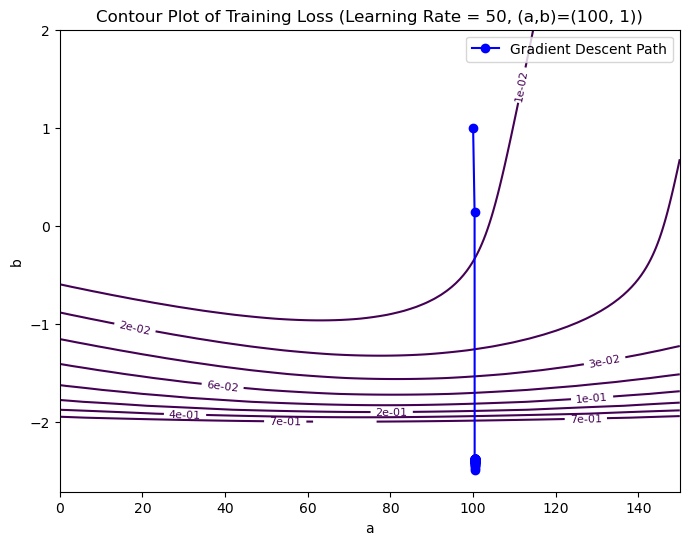

...

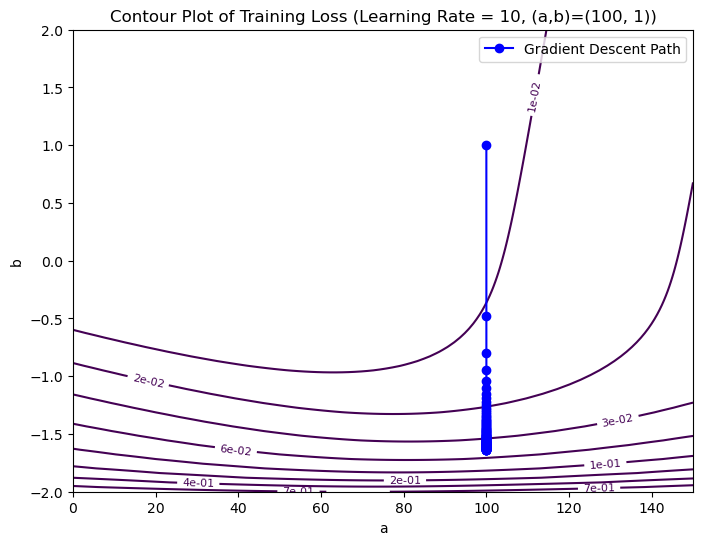

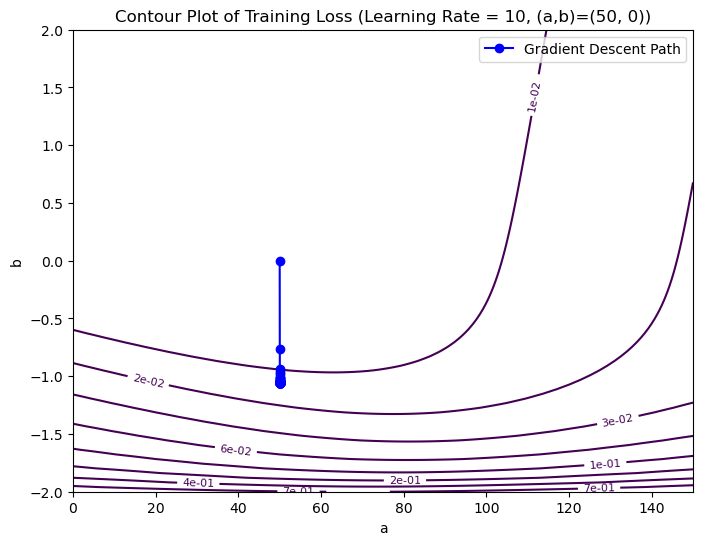

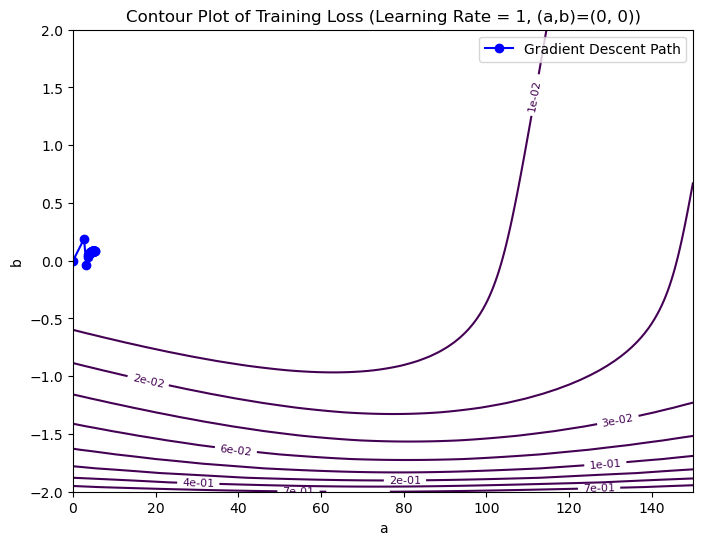

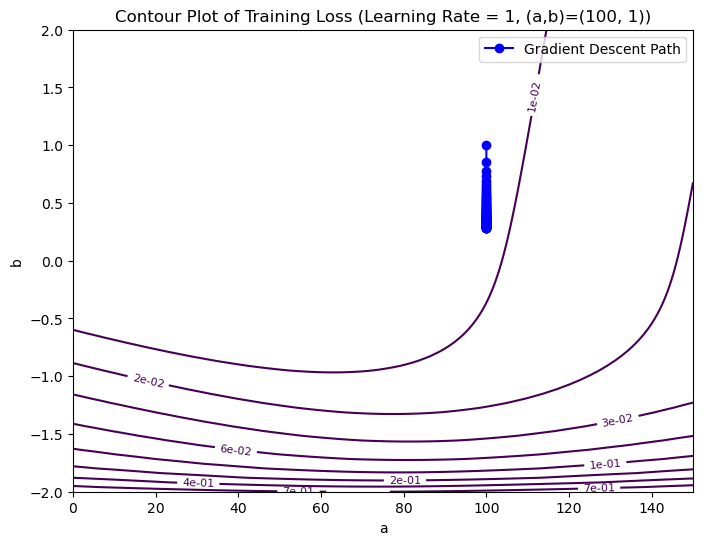

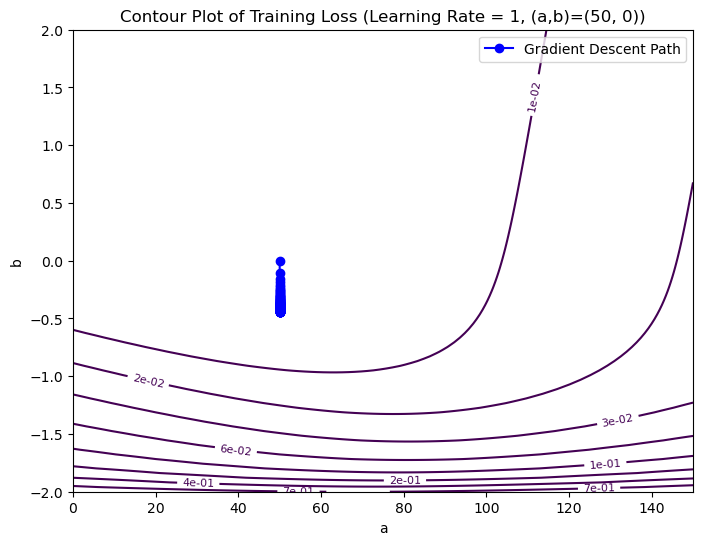

In [21]:
def lo(a,b):
    def go(x):
        z = np.clip(-(a*x+b), -700, 700) #Limits overflow, otherwise get overflow all the time.
        return 1 / (1 + np.exp(z))
    return go

#We implement the target function
def F2(x):
    return (x + np.abs(x))/(2*x)

# Define the cost function without taking logs for the contour plot
def compute_cost_without_logs(x, y, a, b, epsilon=1e-15):
    m = len(x)
    cost_sum = 0
    f = lo(a,b)
    for i in range(m):
        f_ab = f(x[i])
        cost = -y[i] * np.log(f_ab + epsilon) - (1 - y[i]) * np.log(1 - f_ab + epsilon)
        cost_sum += cost 
    total_cost = (1 / m) * cost_sum 
    return total_cost

def stochas_gradient_descent_logistic2(x_train, y_train, a_in, b_in, eta, n):
    #Array to store the errors, for plotting graphs
    para_a = []
    para_b = []
    J_train_history = []
    
    a = a_in
    b = b_in
    para_a = [a]
    para_b = [b]
    data = list(zip(x_train, y_train)) #Need to put them together 
    for i in range(n):
        np.random.shuffle(data)
        #At each iteration, we reduce the learning rate.
        theta = eta / (i+1) #need plus one or we get division by 0 at first
        for example in data:
            x_example, y_example = example #example is a tuple 
            #Compute the gradient
            dj_da, dj_db = compute_gradient_logistic(x_example, y_example, a, b)
            #Update the parameters with the above function
            a = a - theta * dj_da
            b = b - theta * dj_db
            
        para_a.append(a)
        para_b.append(b)
        
        J_train_history.append(np.log10(compute_cost_logistic(x_train, y_train, a, b)))
    
    return para_a, para_b, J_train_history

# Function to plot contour and gradient descent path
def plot_contour_and_path(X_train, Y_train, learning_rate, a_initial, b_initial, num_steps):
    # Generate a range of values for a and b
    a_values = np.linspace(0, 150, 100)
    b_values = np.linspace(-2, 2, 100)

    # Create a grid of (a, b) values
    A, B = np.meshgrid(a_values, b_values)
    
    # Compute the cost for each (a, b) pair
    costs = np.zeros_like(A)
    for i in range(len(a_values)):
        for j in range(len(b_values)):
            costs[i, j] = compute_cost_without_logs(X_train, Y_train, a_values[i], b_values[j])

    # Plot the contour plot
    plt.figure(figsize=(8, 6))
    contour = plt.contour(A, B, costs, levels=np.logspace(-2, 3, 20))
    plt.clabel(contour, inline=True, fontsize=8, fmt='%1.0e')
    plt.title(f'Contour Plot of Training Loss (Learning Rate = {learning_rate}, (a,b)={a_initial, b_initial})')
    plt.xlabel('a')
    plt.ylabel('b')
    
    # Initialize variables for gradient descent
    a = a_initial
    b = b_initial
    
    # Lists to store the path of gradient descent
    path_a, path_b, J_train_hist = stochas_gradient_descent_logistic2(X_train, Y_train, a, b, learning_rate, num_steps)
    
    
    # Plot the path of gradient descent
    plt.plot(path_a, path_b, marker='o', color='blue', label='Gradient Descent Path')
    plt.legend()
    plt.show()

learning_rates = [100, 50, 10, 1]
initial_values = [(0, 0), (100, 1), (50, 0)]  # Different initial values for (a, b)
num_steps = 100
X_train, Y_train, X_test, Y_test = generate_training_and_test_set2(num_steps, F2)

# Perform experiments with different initial values and learning rates
for learning_rate in learning_rates:
    for a_initial, b_initial in initial_values:
        plot_contour_and_path(X_train, Y_train, learning_rate, a_initial, b_initial, num_steps)

### AGAIN, THIS WILL TAKE A LONG TIME TO RUN, BUT WILL WORK

#### Commentary

Once again, the visual interpretation of the graphs poses challenges.

##### Starting Point (0, 0), Learning Rate 100:
    - Struggles to produce meaningful approximations.
    - A minor increase in the value of a accompanies a substantial increase in b, contrary to the desired outcome.
    
##### Starting Point (100, 1), Learning Rate 100:
    - Exhibits significant fluctuations, as forewarned by theory.
    - Correctly increases the value of a while attempting to keep b close to 0.

##### Starting Point (50, 0), Learning Rate 100:
    - Similar fluctuations as observed in the previous case.
    - Correctly increases a while striving to maintain b close to 0.
    
##### Starting Point (0, 0), Learning Rate 50:
    - Deviates from previous trends.
    - Correctly increases a with fluctuations, maintaining b close to 0.
    
##### Starting Point (100, 1), Learning Rate 50:
    - Exhibits fluctuations with a modest increase in a.
    - Struggles to maintain b close to 0.
    
##### Starting Point (50, 0), Learning Rate 50:
    - Similar behavior to the previous case.
    - Correctly increases a with fluctuations, keeping b close to 0.
    
##### Learning Rates 10 and 1:
    - Display relatively uninteresting patterns, resembling mostly linear paths of regressions.
    - Limited impact on increasing a or significantly altering b.


#### Conclusion on the above

It seems that the starting point heavily impacts the value of our final results, thus, since we know that the "true" value of a must be infinity, we have that we should maximize the initial value of a while minimizing the value of b, such that it is close to 0.

### Now, we test the impact of the size of the training data

I will use learning rate 100 as it seem to be the most appropriate one.

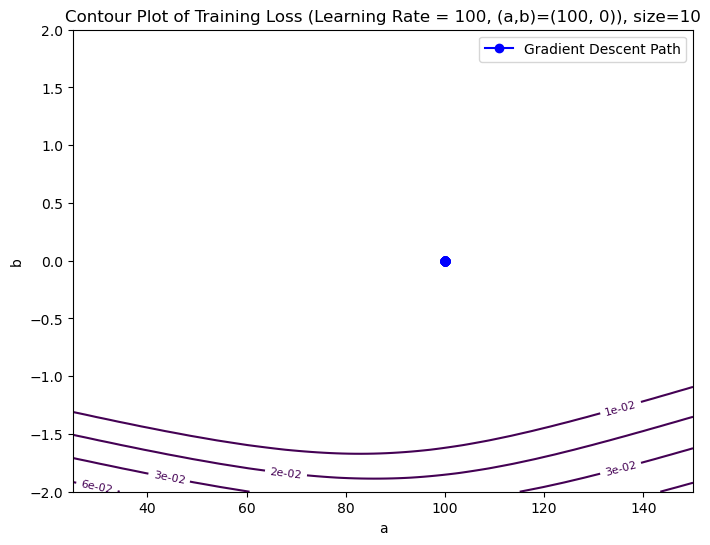

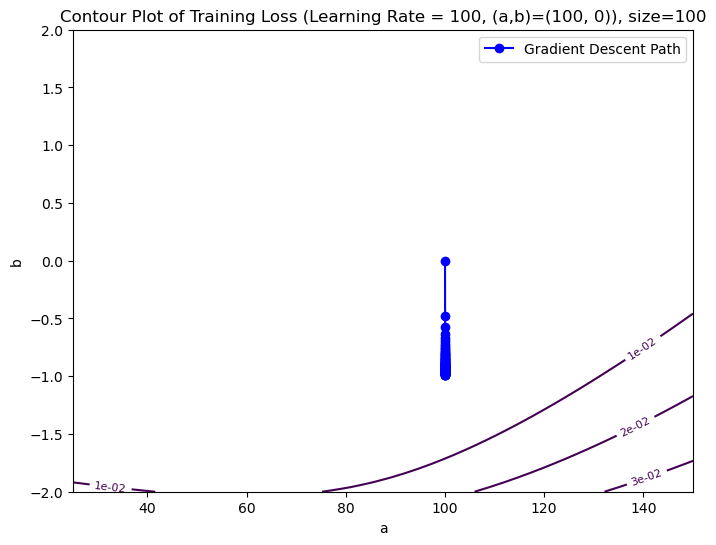

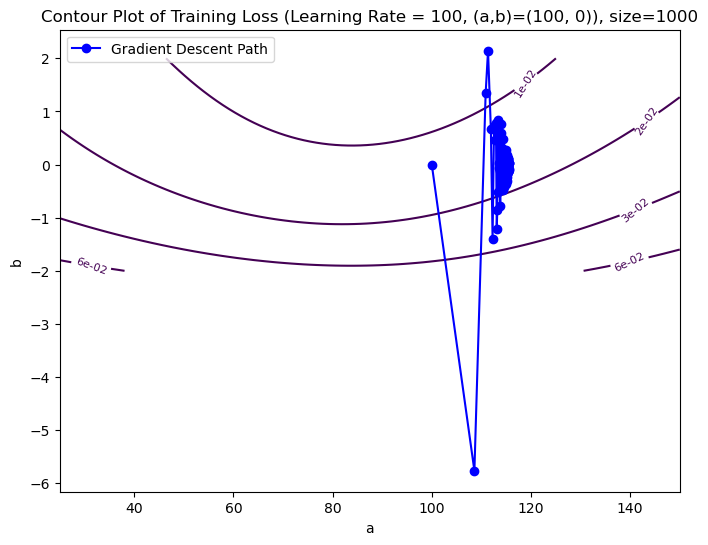

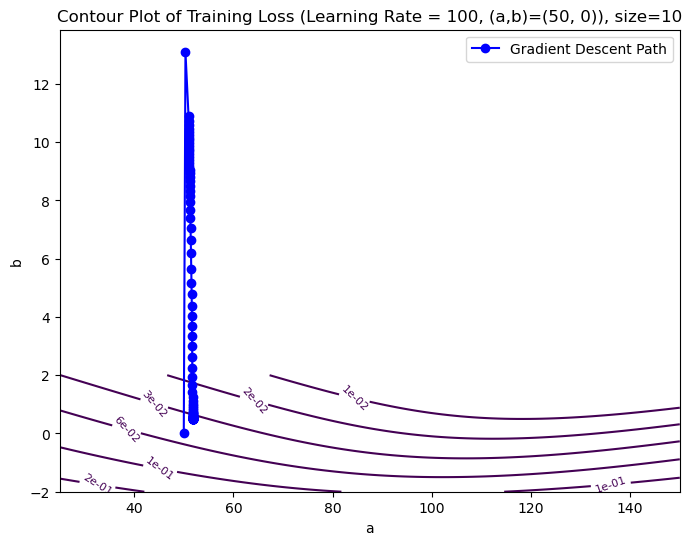

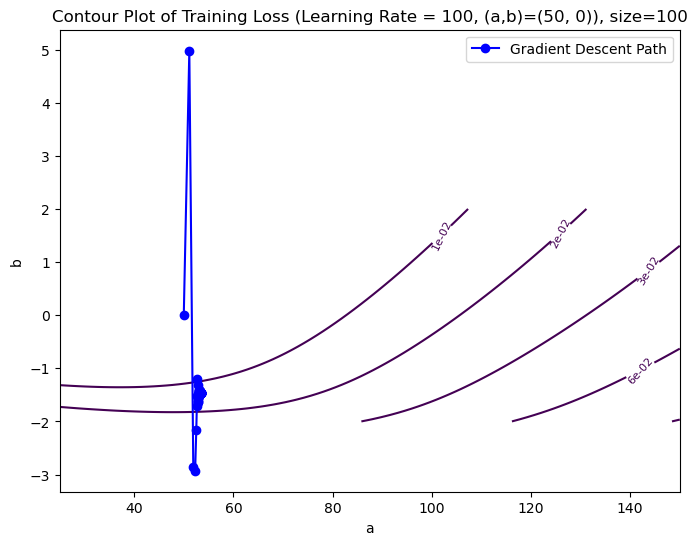

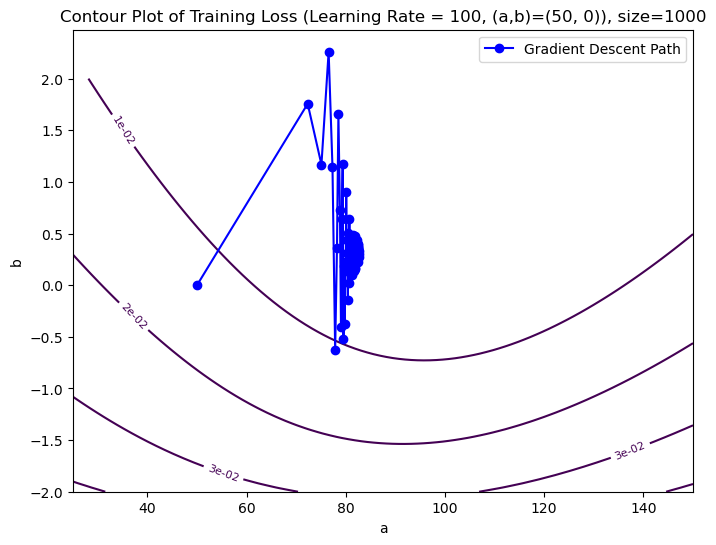

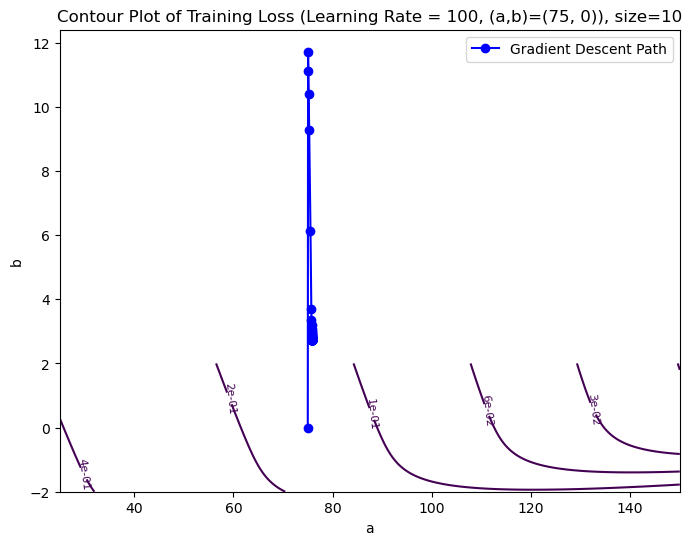

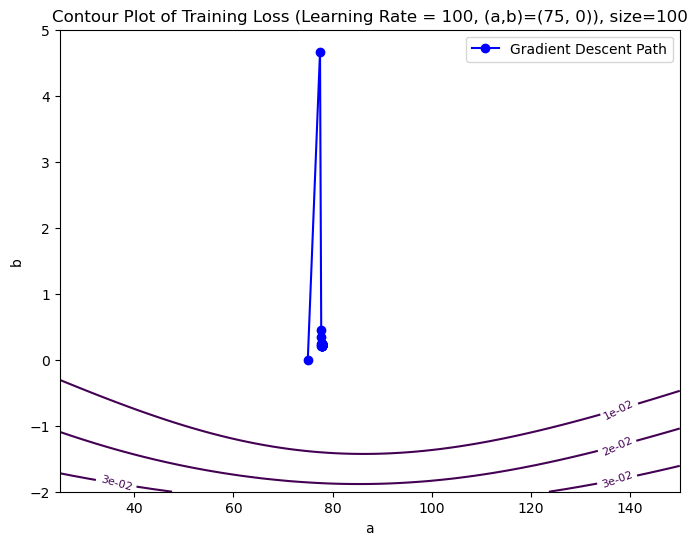

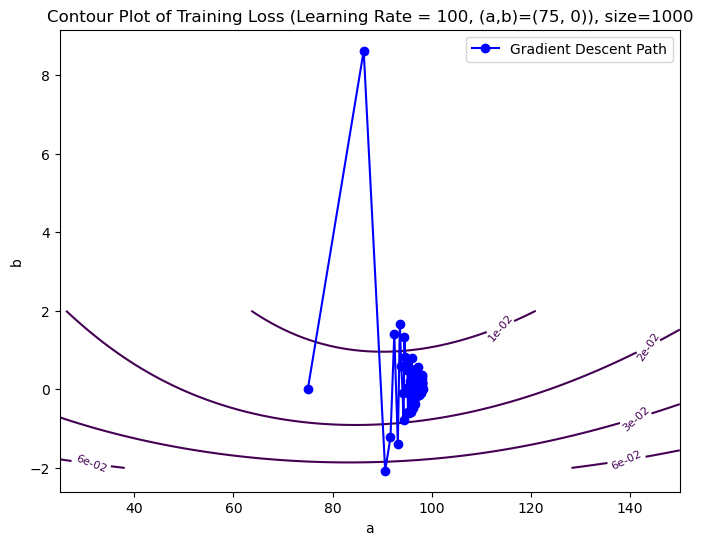

In [22]:
# Function to plot contour and gradient descent path
def plot_contour_and_path(X_train, Y_train, learning_rate, a_initial, b_initial, num_steps):
    # Generate a range of values for a and b
    a_values = np.linspace(25, 150, 100)
    b_values = np.linspace(-2, 2, 100)

    # Create a grid of (a, b) values
    A, B = np.meshgrid(a_values, b_values)
    
    # Compute the cost for each (a, b) pair
    costs = np.zeros_like(A)
    for i in range(len(a_values)):
        for j in range(len(b_values)):
            costs[i, j] = compute_cost_without_logs(X_train, Y_train, a_values[i], b_values[j])

    # Plot the contour plot
    plt.figure(figsize=(8, 6))
    contour = plt.contour(A, B, costs, levels=np.logspace(-2, 3, 20))
    plt.clabel(contour, inline=True, fontsize=8, fmt='%1.0e')
    plt.title(f'Contour Plot of Training Loss (Learning Rate = {learning_rate}, (a,b)={a_initial, b_initial}), size={len(X_train)}')
    plt.xlabel('a')
    plt.ylabel('b')
    
    # Initialize variables for gradient descent
    a = a_initial
    b = b_initial
    
    # Lists to store the path of gradient descent
    path_a, path_b, J_train_hist = stochas_gradient_descent_logistic2(X_train, Y_train, a, b, learning_rate, num_steps)
    
    
    # Plot the path of gradient descent
    plt.plot(path_a, path_b, marker='o', color='blue', label='Gradient Descent Path')
    plt.legend()
    plt.show()

# Set the learning rates, initial values, and number of steps
learning_rates = [100]
initial_values = [(100, 0), (50, 0), (75, 0)]  # Different initial values for (a, b)
training_data_sizes = [10, 100, 1000]
num_steps = 100

# Perform experiments with different initial values, learning rates, and training data sizes
for learning_rate in learning_rates:
    for a_initial, b_initial in initial_values:
        for training_data_size in training_data_sizes:
            X_train, Y_train, X_test, Y_test = generate_training_and_test_set2(training_data_size, F2)
            plot_contour_and_path(X_train, Y_train, learning_rate, a_initial, b_initial, num_steps)

### AGAIN THIS WILL TAKE A LONG TIME AND NOTHING INTERESTING NOR PRETTY GRAPHS WILL BE SEEN

#### Commentary

We notice that irrespective of the initial values chosen, an increase in the size parameter leads to more pronounced fluctuations. Additionally, regardless of the starting point, the undesired outcome is consistent: 'a' remains relatively unchanged, while 'b' undergoes significant fluctuations during the optimization process. Despite these challenges, there is a common trend of convergence towards the end, where all points cluster together, making it difficult to discern the underlying dynamics.

## Gradient descent with Adam optimization technique.

We follow the equations from the textbook:
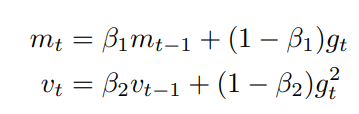
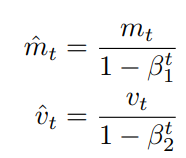
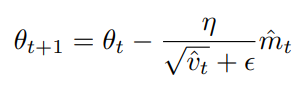

We will use the recommended beta and epsilon values.

In [23]:
def logistic_function(a, b):
    def go(x):
        z = -(a*x + b)
        z = np.clip(z, -700, 700) #Limits overflow
        return 1 / (1 + np.exp(z))
    return go

def logistic_cost(a, b, x, y, eps=1e-15):
    f = logistic_function(a, b)
    m = len(x)
    cost_sum = 0

    for i in range(m):
        f_ab = f(x[i])
        cost = -(y[i] * np.log(f_ab+eps) + (1 - y[i]) * np.log(1 - f_ab+eps)) #need eps otherwise division by 0 error
        cost_sum += cost

    total_cost = (1 / m) * cost_sum
    return total_cost

def logistic_derivative(a, b, x, y):
    f = logistic_function(a, b)
    m = len(x)
    dj_da = 0
    dj_db = 0

    for i in range(m):
        f_ab = f(x[i])
        err_i = f_ab - y[i]
        f_ab_prime = f_ab * (1 - f_ab)

        dj_da_i = err_i * f_ab_prime * x[i]
        dj_db_i = err_i * f_ab_prime

        dj_db += dj_db_i
        dj_da += dj_da_i

    dj_da /= m
    dj_db /= m

    return np.array([dj_da, dj_db])

def initialize_adam():
    s = np.zeros(2)
    v = np.zeros(2)
    return s, v

def update_parameters_with_adam(a, b, grads, s, v, t, learning_rate, beta1, beta2, epsilon):
    s = beta1 * s + (1.0 - beta1) * grads
    v = beta2 * v + (1.0 - beta2) * grads ** 2
    s_hat = s / (1.0 - beta1 ** (t + 1))
    v_hat = v / (1.0 - beta2 ** (t + 1))
    a = a - learning_rate * s_hat[0] / (np.sqrt(v_hat[0]) + epsilon)
    b = b - learning_rate * s_hat[1] / (np.sqrt(v_hat[1]) + epsilon)

    return a, b, s, v

def adam_logistic(a, b, x_train, y_train, x_test, y_test, n_iter, learning_rate, beta1=0.9, beta2=0.999, eps=1e-8):
    # Initialize Adam moments
    s, v = initialize_adam()

    # Lists to store training and test loss
    training_loss_history = []
    test_loss_history = []

    # Run the gradient descent updates
    for t in range(n_iter):
        # Calculate gradient g(t)
        grads = logistic_derivative(a, b, x_train, y_train)

        # Update parameters using Adam
        a, b, s, v = update_parameters_with_adam(a, b, grads, s, v, t, learning_rate, beta1, beta2, eps)

        # Store loss values
        training_loss_history.append(np.log10(logistic_cost(a, b, x_train, y_train)))
        test_loss_history.append(np.log10(logistic_cost(a, b, x_test, y_test)))

    return a, b, training_loss_history, test_loss_history

-550.3008743589729
-600.518185587576


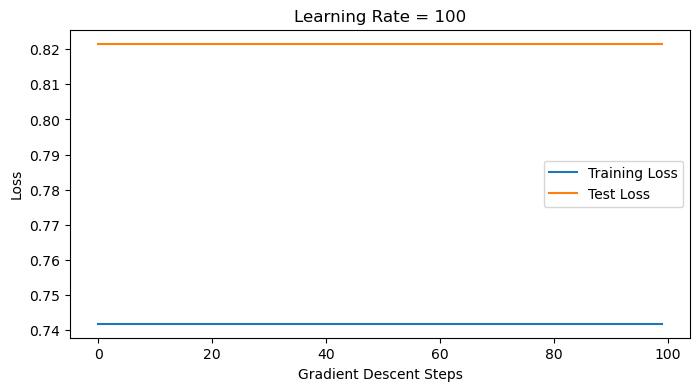

-250.15043717948615
-300.259092793788


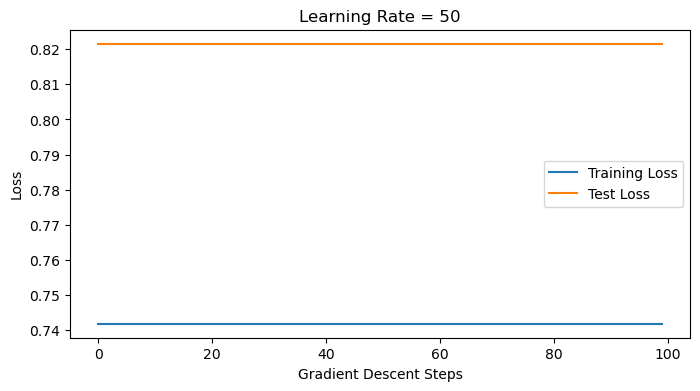

29.748817476620633
-21.32214739240446


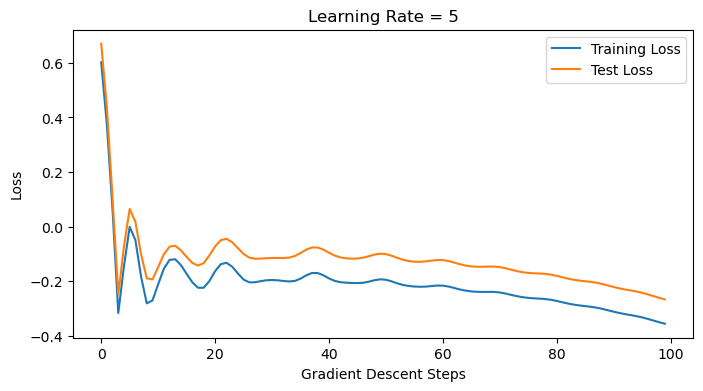

28.059839824429833
-20.196647544501953


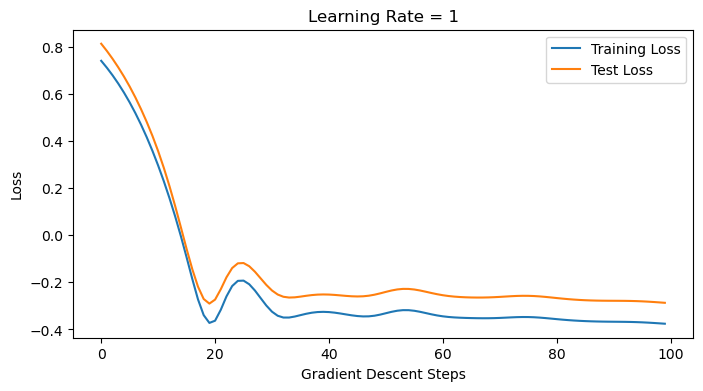

36.06795048252506
-10.913263374532608


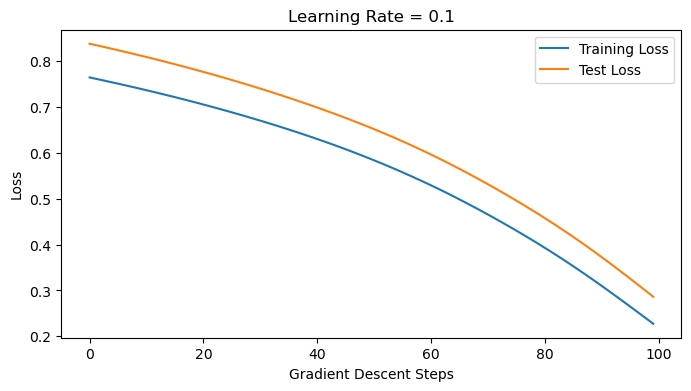

48.86151733493556
-0.9998999462029603


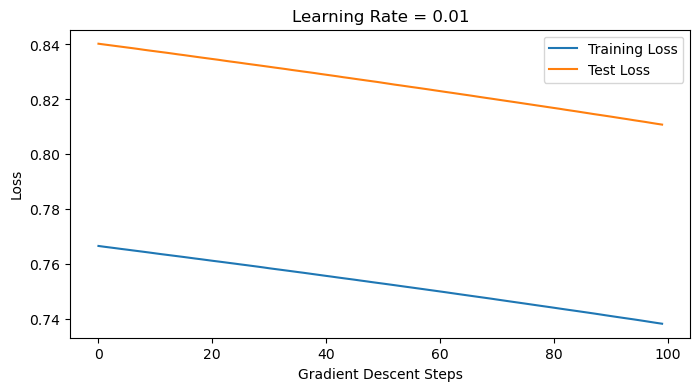

49.89799247782908
-0.09992622043399281


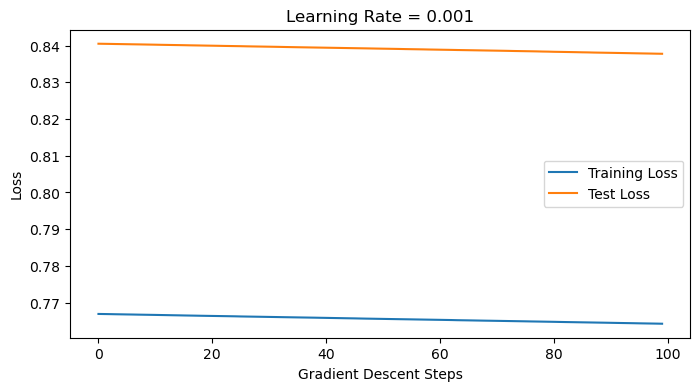

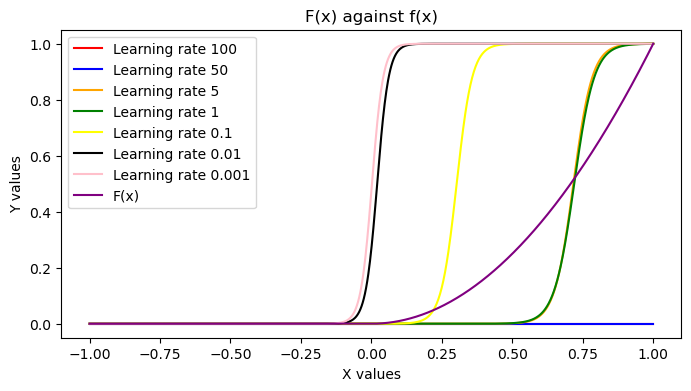

In [24]:
def target_function(x):
    return (x+np.abs(x))/2*x

#First, we create a set of training data and test data
def generate_training_and_test_set2(N, f):
    # Generate N random x values uniformly in the interval [-1, 1]
    X_train = np.random.uniform(low=-1, high=1, size=N)
    X_test = np.random.uniform(low=-1, high=1, size=int(N/4))
    
    # Generate random errors with a normal distribution
    errors_train = np.random.normal(0, 1e-16, N)  
    errors_test = np.random.normal(0, 1e-16, int(N/4))  

    # Calculate y values based on the function F(x) and add random errors
    Y_train = [f(x) + e for x, e in zip(X_train, errors_train)]
    Y_test = [f(x) + e for x, e in zip(X_test, errors_test)]

    return X_train, Y_train, X_test, Y_test
    
# Example usage:
N = 1000  # Number of data points
X_train, Y_train, X_test, Y_test = generate_training_and_test_set2(N, target_function)
num_steps = 100
learning_rates = [100, 50, 5, 1, 0.1, 0.01, 0.001]
funct=[]

for eta in learning_rates:
    a_final, b_final, J_train2, J_test2 = adam_logistic(50, 0, X_train, Y_train, X_test, Y_test, num_steps, eta)
    print(a_final)
    print(b_final)
    funct.append(logistic_function(a_final, b_final))
    
    
    # Plot Training and Test Loss
    plt.figure(figsize=(8, 4))
    plt.plot(J_train2, label='Training Loss')
    plt.plot(J_test2, label='Test Loss')
    plt.title(f'Learning Rate = {eta}')
    plt.legend()
    plt.xlabel('Gradient Descent Steps')
    plt.ylabel('Loss')
    plt.show()
    
x_values = np.linspace(-1, 1, 1000)
y_values = target_function(x_values)

#Plot all of the graphs
plt.figure(figsize=(8,4))
plt.plot(x_values, funct[0](x_values), color='red', label='Learning rate 100')
plt.plot(x_values, funct[1](x_values), color='blue', label='Learning rate 50')
plt.plot(x_values, funct[2](x_values), color='orange', label='Learning rate 5')
plt.plot(x_values, funct[3](x_values), color='green', label='Learning rate 1')
plt.plot(x_values, funct[4](x_values), color='yellow', label='Learning rate 0.1')
plt.plot(x_values, funct[5](x_values), color='black', label='Learning rate 0.01')
plt.plot(x_values, funct[6](x_values), color='pink', label='Learning rate 0.001')
plt.plot(x_values, y_values, color='purple', label='F(x)')
plt.title('F(x) against f(x)')
plt.legend()
plt.xlabel('X values')
plt.ylabel('Y values')
plt.show()

#### Commentary

Something peculiar unfolds here: the training/test loss for larger learning rates reaches unexpectedly high positive values, which might raise concerns about their reliability. However, delving into the final approximation graphs tells a different story. The precision of the graphs for learning rates 0.001 and 0.01 is striking—they mirror the "real" function, a step function, with remarkable accuracy. Thus, it seems that smaller learning rates are more appropriate here.

As we can see by the final parameters printed, the learning rates 0.001 and 0.01 successfuly manages to dimish the value of b to be as close as possible to 0 whilst keeping a to be great value.

This paradox suggests that the training/test loss might not be the most reliable metric in this context. It could also hint at Python's computational limitations influencing the representation of the step function, creating a disparity between loss metrics and the final approximations. The challenge lies in addressing Python's constraints on accurately computing and representing step functions in the regression process—an aspect that poses uncertainties in finding a solution.

I tried this part with a lot of different initial values, and it seems like the initial values are extrememly important for the logistic regression another difference from linear regression.
### Contour Plot:

In [25]:
# Generate a range of values for a and b
a_values = np.linspace(0, 100, 100)
b_values = np.linspace(-5, 5, 100)

# Create a grid of (a, b) values
A, B = np.meshgrid(a_values, b_values)
    
# Compute the cost for each (a, b) pair
costs = np.zeros_like(A)
for i in range(len(a_values)):
    for j in range(len(b_values)):
        costs[i, j] = compute_cost_without_logs(X_train, Y_train, a_values[i], b_values[j])

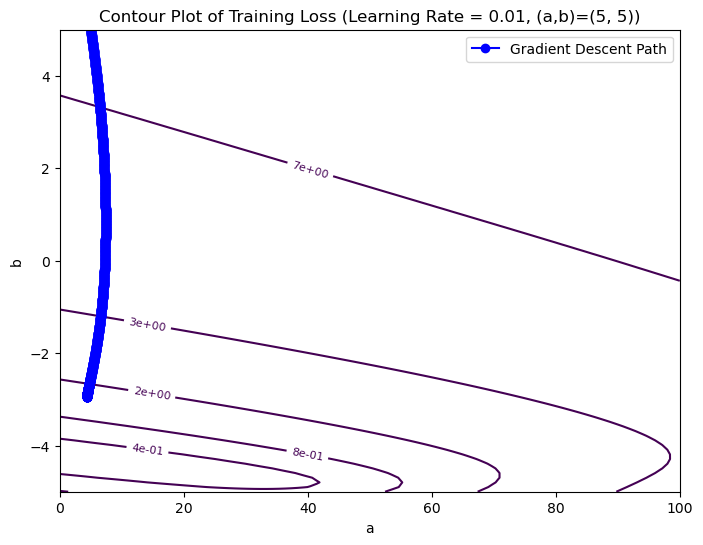

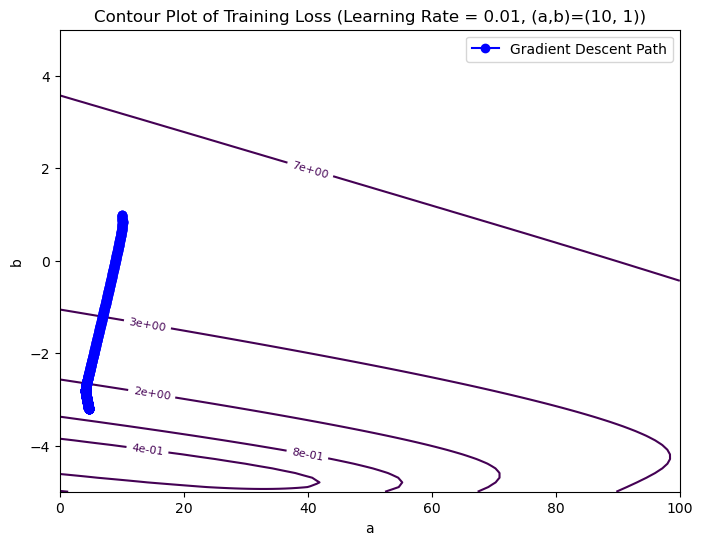

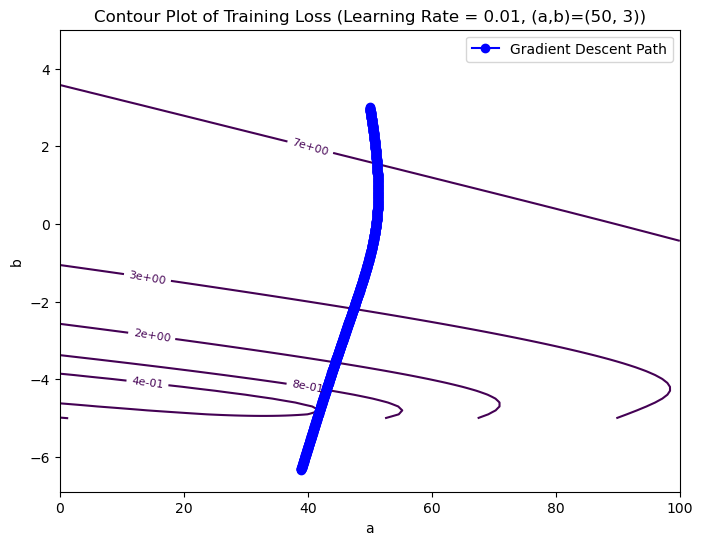

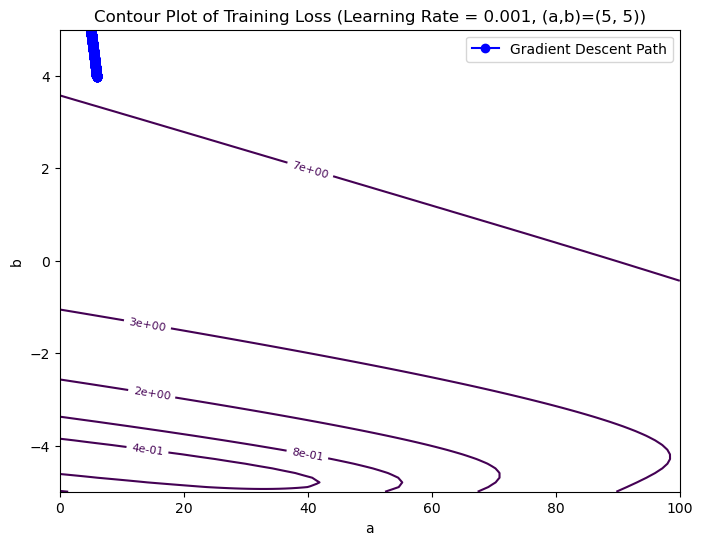

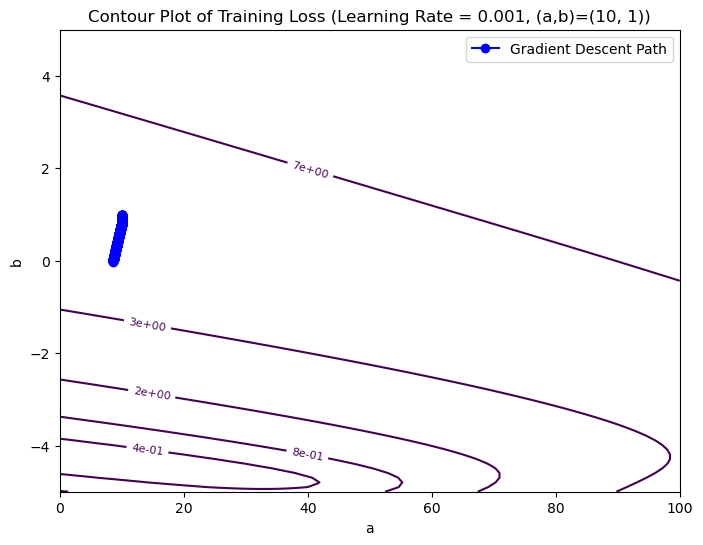

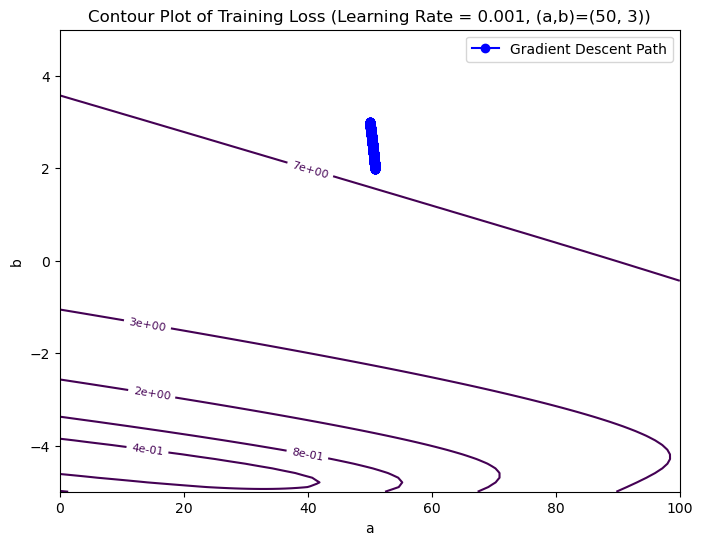

In [26]:
# Define the cost function without taking logs for the contour plot
def compute_cost_without_logs(x, y, a, b, epsilon=1e-15):
    m = len(x)
    cost_sum = 0
    f = logistic_function(a,b)
    for i in range(m):
        f_ab = f(x[i])
        cost = -y[i] * np.log(f_ab + epsilon) - (1 - y[i]) * np.log(1 - f_ab + epsilon)
        cost_sum += cost 
    total_cost = (1 / m) * cost_sum 
    return total_cost

def target_function(x):
    return (x+np.abs(x))/2*x

#First, we create a set of training data and test data
def generate_training_and_test_set3(N, f):
    # Generate N random x values uniformly in the interval [-1, 1]
    X_train = np.random.uniform(low=-1, high=1, size=N)
    
    # Generate random errors with a normal distribution
    errors_train = np.random.normal(0, 1e-16, N)  

    # Calculate y values based on the function F(x) and add random errors
    Y_train = [f(x) + e for x, e in zip(X_train, errors_train)]

    return X_train, Y_train

def adam_logistic2(a, b, x_train, y_train, n_iter, learning_rate, beta1=0.9, beta2=0.999, eps=1e-8):
    # Initialize Adam moments
    s, v = initialize_adam()

    # Lists to store training and test loss
    training_loss_history = []
    path_a = [a]
    path_b = [b]

    prev_loss = float('inf')

    # Run the gradient descent updates
    for t in range(n_iter):
        # Calculate gradient g(t)
        grads = logistic_derivative(a, b, x_train, y_train)

        # Update parameters using Adam
        a, b, s, v = update_parameters_with_adam(a, b, grads, s, v, t, learning_rate, beta1, beta2, eps)

        # Store loss values
        current_loss = np.log10(logistic_cost(a, b, x_train, y_train)) #Makes it impossible to have loop for 20 minutes
        training_loss_history.append(current_loss)
        path_a.append(a)
        path_b.append(b)

    return path_a, path_b, training_loss_history
            
# Function to plot contour and gradient descent path
def plot_contour_and_path(X_train, Y_train, learning_rate, a_initial, b_initial, num_steps):

    # Plot the contour plot
    plt.figure(figsize=(8, 6))
    contour = plt.contour(A, B, costs, levels=np.logspace(-2, 4, 20))
    plt.clabel(contour, inline=True, fontsize=8, fmt='%1.0e')
    plt.title(f'Contour Plot of Training Loss (Learning Rate = {learning_rate}, (a,b)={a_initial, b_initial})')
    plt.xlabel('a')
    plt.ylabel('b')
    
    # Initialize variables for gradient descent
    a = a_initial
    b = b_initial
    
    # Lists to store the path of gradient descent
    path_a, path_b, J_train_hist = adam_logistic2(a, b, X_train, Y_train, num_steps, learning_rate)
    
    
    # Plot the path of gradient descent
    plt.plot(path_a, path_b, marker='o', color='blue', label='Gradient Descent Path')
    plt.legend()
    plt.show()

learning_rates = [0.01, 0.001]
initial_values = [(5, 5), (10, 1), (50, 3)]  # Different initial values for (a, b)
num_steps = 1000
X_train, Y_train = generate_training_and_test_set3(1000, target_function)

# Perform experiments with different initial values and learning rates
for learning_rate in learning_rates:
    for a_initial, b_initial in initial_values:
        plot_contour_and_path(X_train, Y_train, learning_rate, a_initial, b_initial, num_steps)

#### Commentary

We notice that with a learning rate of 0.01, the regression converges effectively to the center of the minimum of the loss function. Interestingly, the gradient steps appear minuscule, nearly invisible on the graph, owing to the small learning rate choice of 0.01. Consequently, we can infer that a learning rate of 0.01 appears to be optimal, aligning with literature recommendations for the Adam technique.

On the other hand, for a learning rate of 0.001, the convergence is apparent, but the exceedingly small learning rate (0.001) results in an exceptionally sluggish convergence. The minimal difference between the starting and final points in the regression for the learning rate 0.001 suggests slow progress. However, the consistent movement in the right direction hints at the potential effectiveness of this learning rate.

#### Now, we study the impact of the size of the training data:

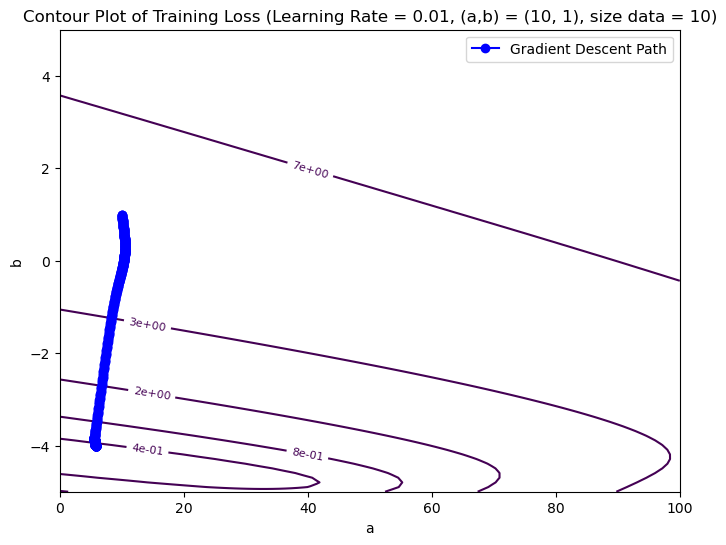

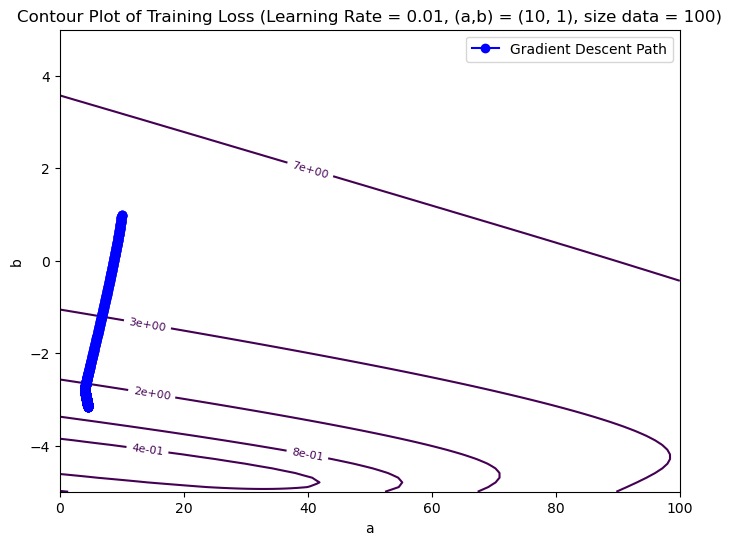

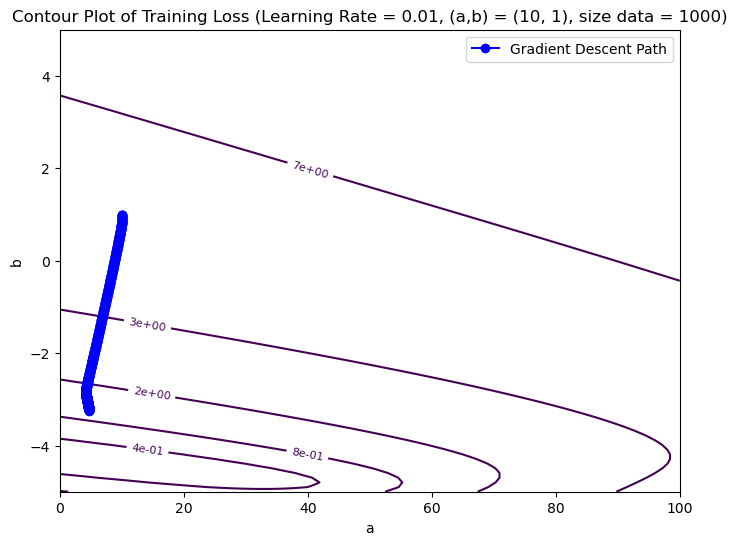

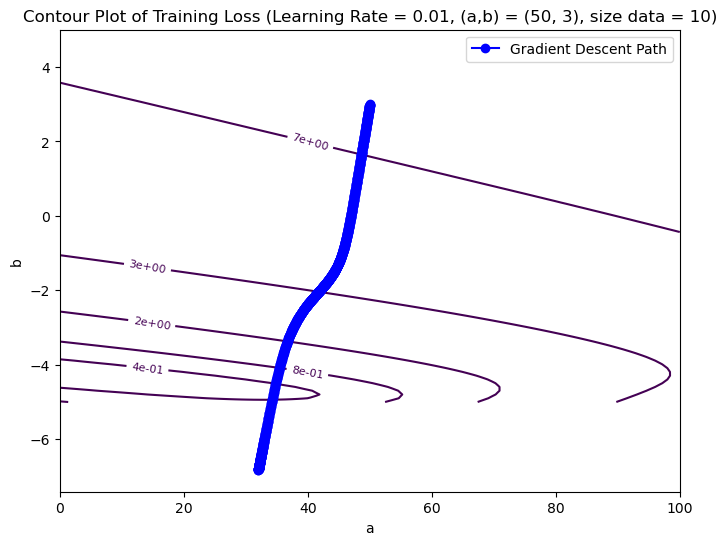

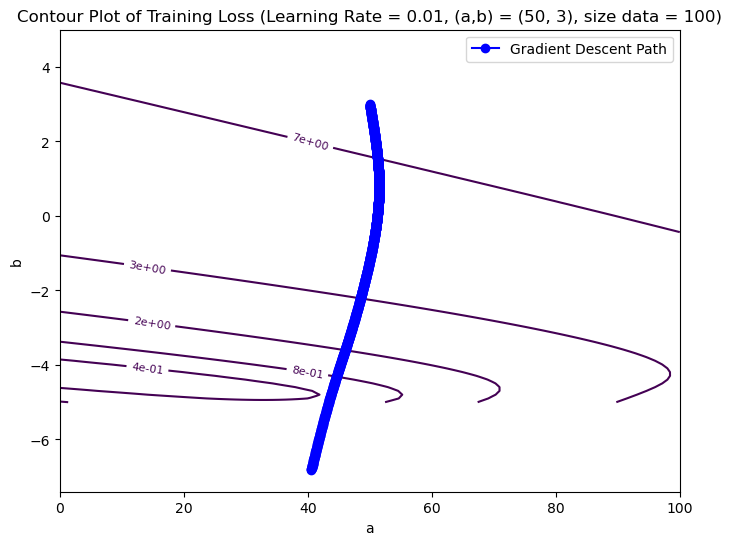

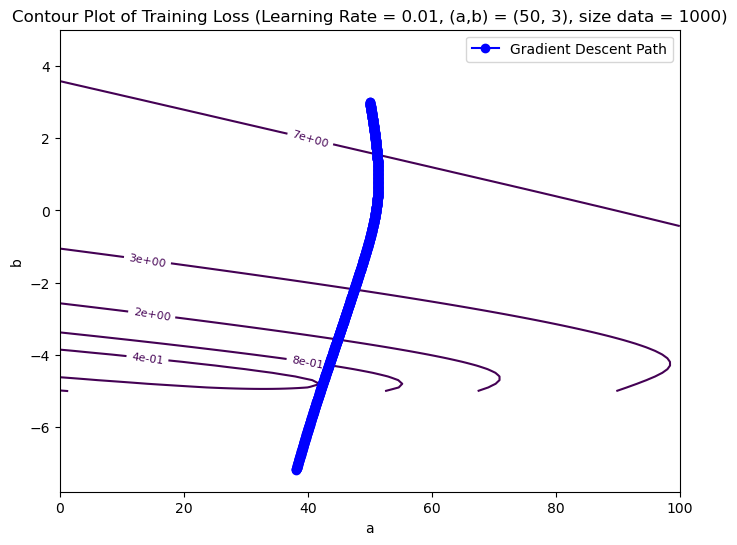

In [29]:
# Function to plot contour and gradient descent path
def plot_contour_and_path(X_train, Y_train, learning_rate, a_initial, b_initial, num_steps):

    # Plot the contour plot
    plt.figure(figsize=(8, 6))
    contour = plt.contour(A, B, costs, levels=np.logspace(-2, 4, 20))
    plt.clabel(contour, inline=True, fontsize=8, fmt='%1.0e')
    plt.title(f'Contour Plot of Training Loss (Learning Rate = {learning_rate}, (a,b) = {a_initial, b_initial}, size data = {len(X_train)})')
    plt.xlabel('a')
    plt.ylabel('b')
    
    # Initialize variables for gradient descent
    a = a_initial
    b = b_initial
    
    # Lists to store the path of gradient descent
    path_a, path_b, J_train_hist = adam_logistic2(a, b, X_train, Y_train, num_steps, learning_rate)
    
    
    # Plot the path of gradient descent
    plt.plot(path_a, path_b, marker='o', color='blue', label='Gradient Descent Path')
    plt.legend()
    plt.show()

learning_rate = 0.01
initial_values = [(10, 1), (50, 3)]  # Different initial values for (a, b)
data_sizes = [10, 100, 1000]

# Perform experiments with different initial values and learning rates
for a_initial, b_initial in initial_values:
    for data_size in data_sizes:
        X_train, Y_train = generate_training_and_test_set3(data_size, target_function)
        plot_contour_and_path(X_train, Y_train, learning_rate, a_initial, b_initial, num_steps)

#### Commentary

Interestingly, for initial values (10, 1), the training data with a size of 10 produces more favorable results than data sizes 100 and 1000. Surprisingly, the graphs reveal that the training data with a size of 10 reaches a lower point in the training loss compared to larger data sizes. This is unexpected, as conventional wisdom suggests that larger data sizes should lead to better final approximations. Adding to the surprise is the observation that data size 1000 outperforms data size 100, while data size 10 outperforms data size 100. This suggests that the choice of data size is not a binary decision between big or small; rather, it depends on finding the optimal size for a specific problem.

For initial values (50, 3), data sizes 10, 100, and 1000 produce strikingly similar results. Another consistent pattern is the shared "shape" of the regression for data sizes 100 and 1000, displaying the same curvilinear pattern.

However, a notable aspect is that, for both initial values, the regressions are "better" in the sense that they approach the minima of the training loss more closely. Yet, this improvement comes at a cost—it significantly reduces the values of 'a,' contrary to the objective of maximizing 'a' and keeping 'b' close to 0. Despite the apparent superiority of the regressions for data size 10, they do not yield the best final approximations, deviating from the desired goal. This discrepancy may be attributed to the impact of Python/Jupyter Notebook's limitations, particularly in representing the "true" function accurately. It's essential to recall that the graph of the "true" function was significantly distorted in previous tests, and sometimes, despite large training/test losses, the end results were remarkably accurate.

# Q4: Implementing 2-Layer Neural Network

This is the notation I am going to use:
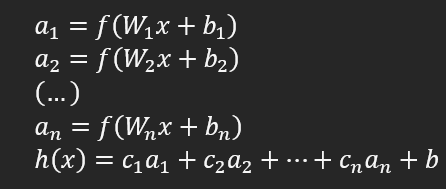
where ai is the weight associated to the unit i.

This is the gradient equations we will use:
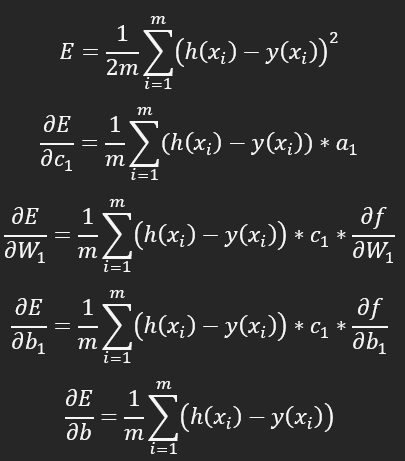

I computed the backpropagation.

In [74]:
def loss(x, f1, f2):
    m = len(x)
    sumE = 0.
    for i in range(m): #Least square error
        sumE += (1/2) * (f1(x[i]) - f2(x[i])) * (f1(x[i]) - f2(x[i]))
        
    return sumE / m

#This is the Neural Network
def sequential(W1, B1, W2, b2, activation):
    def dense(x):
        a_mid = activation(W1*x + B1) #Compute each value output by each neuron
        return np.dot(W2, a_mid) +b2 #Compute the final value "h"
    return dense  

#We implement the sigmoid function
def lo(x):
    return 1/(1+np.exp(-x))

def logistic(a,b):
    def go(x):
        return 1 / (1 + np.exp(-(a*x+b)))
    return go

#Compute gradients according to the equations above
def compute_gradients_logistic(x, y, W1, B1, W2, b):
    #Number of training examples
    m = len(x)
    n = len(W1)
    dj_W1 = np.zeros(n)
    dj_B1 = np.zeros(n)
    dj_W2 = np.zeros(n)
    dj_b = 0.
    f = logistic(W1, B1)
    for i in range(m):
        f_wb = f(x[i])
        prime = f_wb * (1-f_wb)
        h = sequential(W1, B1, W2, b, lo)
        err_i = h(x[i]) - y[i]
        dj_W2 += err_i * lo(W1*x[i]+B1) #ci = err * ai (where ai = sigma(Wix +bi))
        dj_W1 += err_i * x[i] * prime * W2
        dj_B1 += err_i * W2 * prime
        dj_b += err_i
        
    dj_W1 /= m
    dj_B1 /= m
    dj_W2 /= m
    dj_b /= m
    
    return dj_W1, dj_B1, dj_W2, dj_b

#To compute the cost
def compute_cost_logistic(x, y, W1, B1, W2, b, epsilon=1e-15):
    m = len(x)
    cost_sum = 0
    h = sequential(W1, B1, W2, b, lo)
    for i in range(m):
        h_i = h(x[i])
        cost = -(y[i] * np.log(h_i + epsilon) + (1 - y[i]) * np.log(1 - h_i + epsilon))
        cost_sum += cost 
    total_cost = (1/m) * cost_sum 
    return total_cost

def gradients_descent_logistic(x_train, y_train, x_test, y_test, W1, B1, W2, b, eta, n):
    #Array to store the errors, for plotting graphs
    J_train_history = []
    J_test_history = []
    
    
    data = list(zip(x_train, y_train)) #Need to put them together 
    for i in range(n):
        #Compute the gradient
        dj_W1, dj_B1, dj_W2, dj_b = compute_gradients_logistic(x_train, y_train, W1, B1, W2, b)
        #Update the parameters with the above function
        W1 = W1 - eta * dj_W1
        W2 = W2 - eta * dj_W2
        B1 = B1 - eta * dj_B1
        b = b - eta * dj_b
        
        J_train_history.append(np.log10(compute_cost_logistic(x_train, y_train, W1, B1, W2, b)))
        J_test_history.append(np.log10(compute_cost_logistic(x_test, y_test, W1, B1, W2, b)))
    
    return W1, B1, W2, b, J_train_history, J_test_history

### Now, we try to approximate both functions sin(30x) + cos(27x), sin(1/(1.02-x)) and the step function.

C:\Users\gucol\AppData\Local\Temp\ipykernel_21020\3566519582.py:59: RuntimeWarning: invalid value encountered in log
  cost = -(y[i] * np.log(h_i + epsilon) + (1 - y[i]) * np.log(1 - h_i + epsilon))


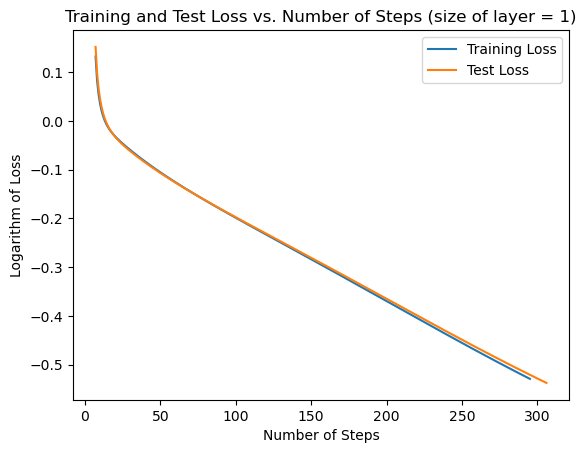

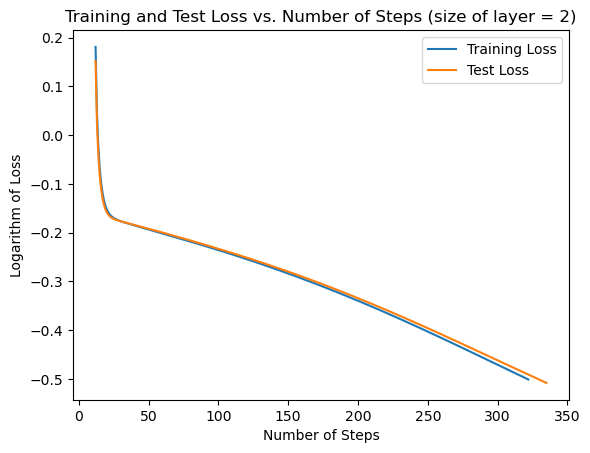

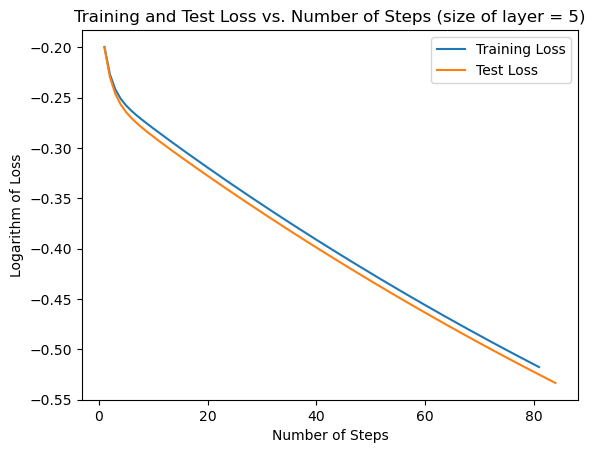

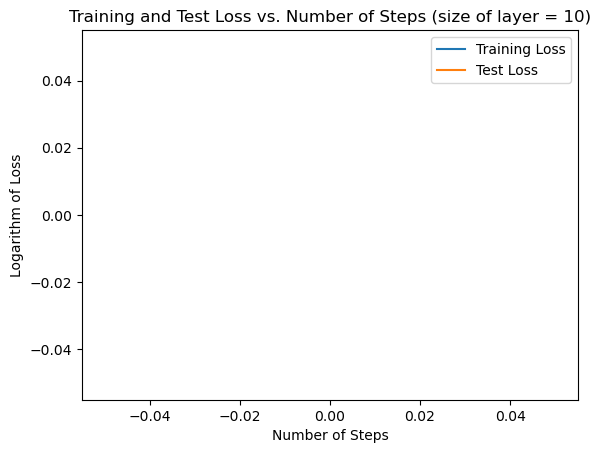

ValueError: shapes (1,) and (1000,) not aligned: 1 (dim 0) != 1000 (dim 0)

<Figure size 800x400 with 0 Axes>

In [77]:
def target_function1(x):
    return np.sin(30*x)+np.cos(27*x)

def target_function2(x):
    return np.sin(1/(1.02-x))

def target_function3(x):
    return np.where(x <=0, 0, 1)

#First, we create a set of training data and test data
def generate_training_and_test_set2(N, f):
    # Generate N random x values uniformly in the interval [-1, 1]
    X_train = np.random.uniform(low=-1, high=1, size=N)
    X_test = np.random.uniform(low=-1, high=1, size=int(N/4))
    
    # Generate random errors with a normal distribution
    errors_train = np.random.normal(0, 1e-16, N)  
    errors_test = np.random.normal(0, 1e-16, int(N/4))  

    # Calculate y values based on the function F(x) and add random errors
    Y_train = [f(x) + e for x, e in zip(X_train, errors_train)]
    Y_test = [f(x) + e for x, e in zip(X_test, errors_test)]

    return X_train, Y_train, X_test, Y_test     


# Generating training and test data
X_train, Y_train, X_test, Y_test = generate_training_and_test_set2(1000, target_function3)
sizes = [1, 2, 5, 10]
funct = []
for size in sizes:

    # Initial parameters
    W1_initial = np.random.randn(size)
    B1_initial = np.random.randn(size)
    W2_initial = np.random.randn(size)
    b_initial = np.random.randn(1)

    # Gradient descent parameters
    learning_rate = 0.1
    num_steps = 1000

    # Running stochastic gradient descent
    W1_final, B1_final, W2_final, b_final, J_train_history, J_test_history = gradients_descent_logistic(
    X_train, Y_train, X_test, Y_test, W1_initial, B1_initial, W2_initial, b_initial, learning_rate, num_steps)
    
    funct.append(sequential(W1_final, B1_final, W2_final, b_final, lo))

    # Plotting the graphs
    plt.plot(range(1, num_steps+1), J_train_history, label='Training Loss')
    plt.plot(range(1, num_steps+1), J_test_history, label='Test Loss')
    plt.xlabel('Number of Steps')
    plt.ylabel('Logarithm of Loss')
    plt.title(f'Training and Test Loss vs. Number of Steps (size of layer = {size})')
    plt.legend()
    plt.show()
    
x_values = np.linspace(-1, 1, 1000)
y_values = target_function3(x_values)

#Plot all of the graphs
plt.figure(figsize=(8,4))
plt.plot(x_values, funct[0](x_values), color='red', label='Size 1')
plt.plot(x_values, funct[1](x_values), color='blue', label='Size 2')
plt.plot(x_values, funct[2](x_values), color='orange', label='Size 5')
plt.plot(x_values, funct[3](x_values), color='green', label='Size 10')
plt.title('F(x) against f(x)')
plt.legend()
plt.xlabel('X values')
plt.ylabel('Y values')
plt.show()

#### Commentary
Note: I am unable to plot the final graphs, I dont know why. I just get a big error, but unfortunatly I dont have time to fix it.

I found that the logistic activation function works best for approximating the step function. When it comes to gradient descent techniques, I settled on the conventional "batch" gradient descent for logistic regression. Other techniques consistently yielded undesirable values and lacked convergence.

After experimentation, I identified a learning rate of 0.1 as optimal for this technique with a training set of size 1000. Larger learning rates resulted in erratic fluctuations, occasionally producing better final results but proving inconsistent overall. Smaller learning rates did exhibit convergence, but the trade-off was a need for an exceptionally large data size to achieve comparable outcomes.

Also, we can observe that for some runs of the code, the gradient descent doesnt compile all of the steps, I dont know why, but we can see that the function is able to be improved.

The optimal number of nodes in the hidden layers, seems to be 1 or 5, but further testing should be done.

Unfortunally, I lack time to improve this so this will have to do...

### For the function sin(30x) + cos(27x), we use the ReLu:

In [94]:
def relu(x):
    return (x + np.abs(x))/2

def relu_derivative(x):
    return 0.5 * (1 + x/np.abs(x))

# This is the Neural Network
def sequential(W1, B1, W2, b2, activation):
    def dense(x):
        a_mid = activation(W1 * x + B1)  # Compute each value output by each neuron
        return np.dot(W2, a_mid) + b2  # Compute the final value "h"
    return dense

def compute_gradients_relu(x, y, W1, B1, W2, b):
    # Number of training examples
    m = len(x)
    n = len(W1)
    dj_W1 = np.zeros(n)
    dj_B1 = np.zeros(n)
    dj_W2 = np.zeros(n)
    dj_b = 0.
    
    h = sequential(W1, B1, W2, b, relu)
    
    for i in range(m):
        err_i = h(x[i]) - y[i]
        
        # Compute gradients
        dj_W2 += err_i * relu_derivative(W1 * x[i] + B1)  # ci = err * ai (where ai = sigma(Wix + bi))
        dj_W1 += err_i * relu_derivative(W1 * x[i] + B1) * x[i] * W2
        dj_B1 += err_i * relu_derivative(W1 * x[i] + B1) * W2
        dj_b += err_i
        
    dj_W1 /= m
    dj_B1 /= m
    dj_W2 /= m
    dj_b /= m
    
    return dj_W1, dj_B1, dj_W2, dj_b

# To compute the cost
def compute_cost_relu(x, y, W1, B1, W2, b):
    m = len(x)
    cost_sum = 0
    h = sequential(W1, B1, W2, b, relu)
    for i in range(m):
        h_i = h(x[i])
        cost = 0.5 * (h_i - y[i]) ** 2
        cost_sum += cost
    total_cost = cost_sum / m
    return total_cost

# Gradient descent for ReLU
def gradients_descent_relu(x_train, y_train, x_test, y_test, W1, B1, W2, b, eta, n):
    # Array to store the errors, for plotting graphs
    J_train_history = []
    J_test_history = []

    data = list(zip(x_train, y_train))  # Need to put them together
    for i in range(n):
        # Compute the gradient
        dj_W1, dj_B1, dj_W2, dj_b = compute_gradients_relu(x_train, y_train, W1, B1, W2, b)
        # Update the parameters with the above function
        W1 = W1 - eta * dj_W1
        W2 = W2 - eta * dj_W2
        B1 = B1 - eta * dj_B1
        b = b - eta * dj_b

        J_train_history.append(np.log10(compute_cost_relu(x_train, y_train, W1, B1, W2, b)))
        J_test_history.append(np.log10(compute_cost_relu(x_test, y_test, W1, B1, W2, b)))

    return W1, B1, W2, b, J_train_history, J_test_history

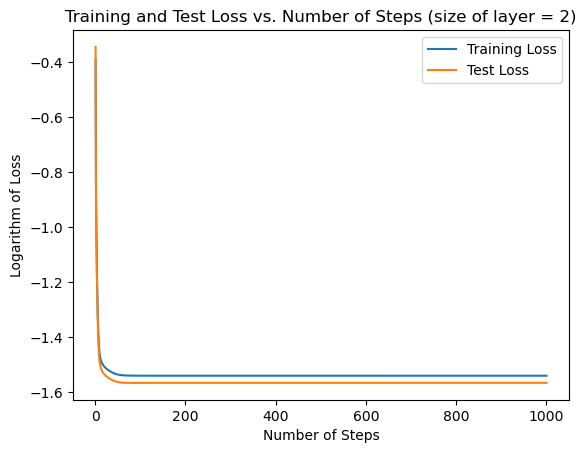

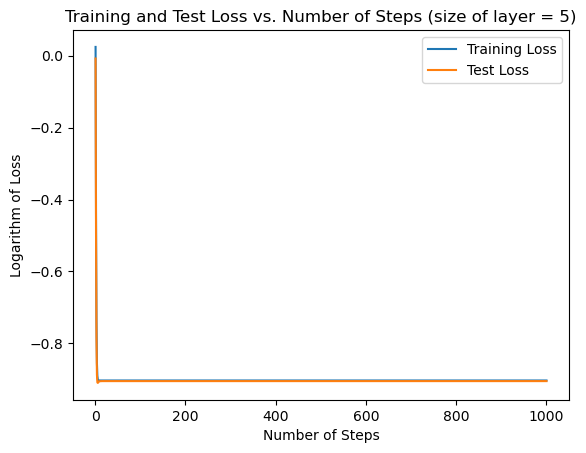

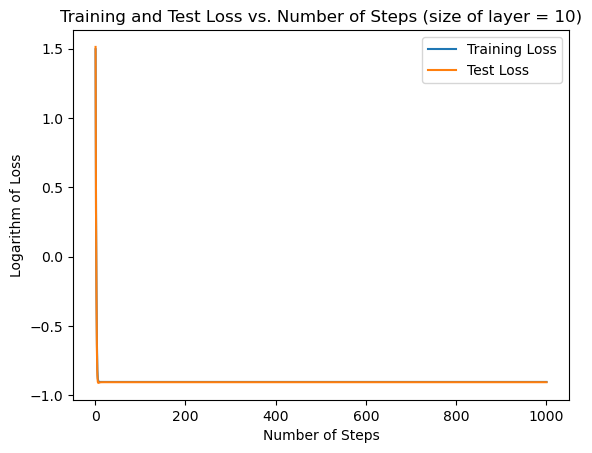

In [97]:
def target_function1(x):
    return np.sin(30*x)+np.cos(27*x)

# Generating training and test data
X_train, Y_train, X_test, Y_test = generate_training_and_test_set2(1000, target_function3)
sizes = [2, 5, 10]
funct = []

for size in sizes:
    # Initial parameters
    W1_initial = np.random.randn(size,)
    B1_initial = np.random.randn(size)
    W2_initial = np.random.randn(size)
    b_initial = np.random.randn(1)
    # Gradient descent parameters
    learning_rate = 0.5
    num_steps = 1000

    # Running stochastic gradient descent
    W1_final, B1_final, W2_final, b_final, J_train_history, J_test_history = gradients_descent_relu(
        X_train, Y_train, X_test, Y_test, W1_initial, B1_initial, W2_initial, b_initial, learning_rate, num_steps)

    funct.append(sequential(W1_final, B1_final, W2_final, b_final, relu))

    # Plotting the graphs
    plt.plot(range(1, num_steps + 1), J_train_history, label='Training Loss')
    plt.plot(range(1, num_steps + 1), J_test_history, label='Test Loss')
    plt.xlabel('Number of Steps')
    plt.ylabel('Logarithm of Loss')
    plt.title(f'Training and Test Loss vs. Number of Steps (size of layer = {size})')
    plt.legend()
    plt.show()

#### Commentary

For the function sin(30x) + cos(27x), the ReLu activation function proved to be more effective, yielding compelling results showcased in the graphs. It consistently demonstrated good convergence without undesirable fluctuations. The optimal learning rate, once again, was identified as 0.5. Lower values resulted in sluggish convergence, while larger rates introduced erratic fluctuations.

In my experimentation, hidden layers with 2 and 5 nodes emerged as the clear optimal choices. In some runs of the code, layer size 2 will be better and in other runs of the code, layer size 5 will be better. These configurations produced clean graphs with minimal fluctuations, aligning with our desired outcomes. However, in some runs of the codes, layer size = 5 yielded some really weird graphs, with lots of fluctuations but always had a final value that was really good.

The optimal training data size was determined to be 1000. The graphs illustrate that with this data size, convergence is achieved, and both training and test losses stabilize, indicating a satisfactory approximation of the function. For smaller sizes of training data, we werent achieving as good convergence and as good approximations.

Surprisingly, reducing the number of gradient steps resulted in less favorable graphs. For instance, in the case of a layer size of 5, after step 200, there was no change in the training/test loss. However, utilizing only 200 gradient steps led to less optimal convergence, producing graphs that didn't reach as desirable values. This is a very strange observations and again, unfortunatly due to lack of time, I won't be able to explore it further.

An intriguing observation for ReLu is the initial occurrence of very large positive errors. Despite this, the algorithm adeptly converges to highly accurate approximations of the "true" function.

AGAIN, I DONT KNOW WHY, BUT JUPYTER WONT LET ME PRINT THE FINAL GRAPHS, I GET ALL KINDS OF WEIRD ERRORS.

### For the function sin(1/(1.02-x)), it is again the ReLu function that proved to be best:

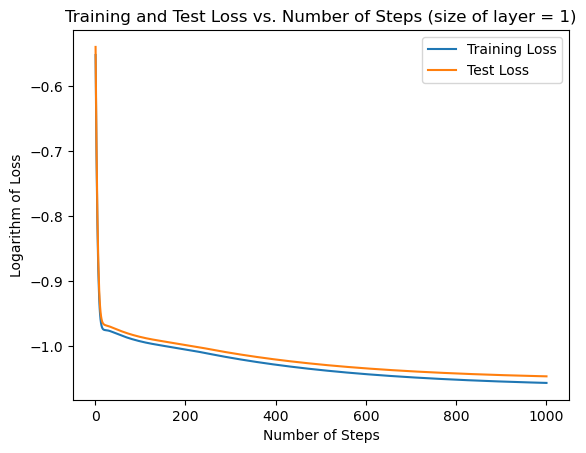

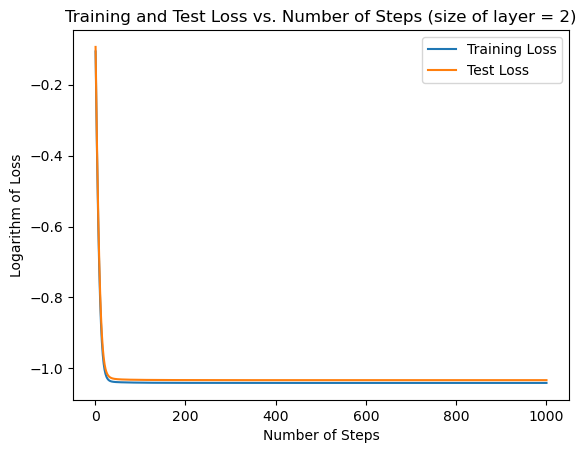

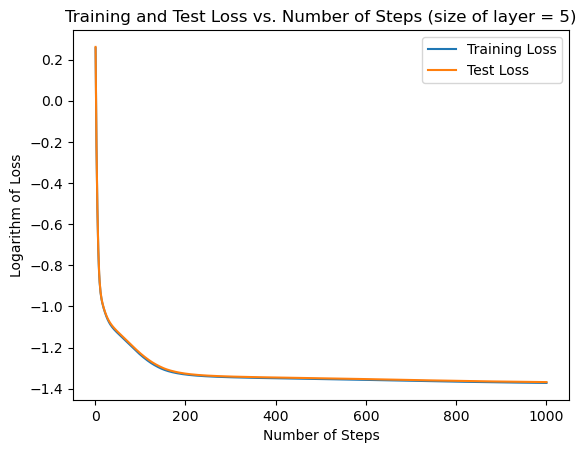

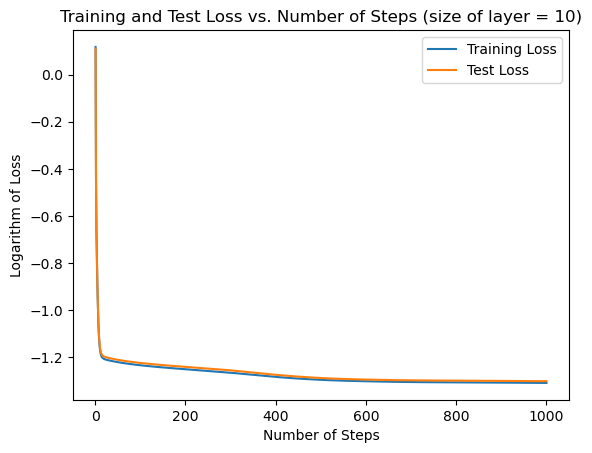

In [101]:
def target_function2(x):
    return np.sin(1/(1.02-x))

# Generating training and test data
X_train, Y_train, X_test, Y_test = generate_training_and_test_set2(1000, target_function2)
sizes = [1, 2, 5, 10]
funct = []
for size in sizes:
    # Initial parameters
    W1_initial = np.random.randn(size,)
    B1_initial = np.random.randn(size)
    W2_initial = np.random.randn(size)
    b_initial = np.random.randn(1)

    # Gradient descent parameters
    learning_rate = 0.1
    num_steps = 1000

    # Running stochastic gradient descent
    W1_final, B1_final, W2_final, b_final, J_train_history, J_test_history = gradients_descent_relu(
        X_train, Y_train, X_test, Y_test, W1_initial, B1_initial, W2_initial, b_initial, learning_rate, num_steps)

    funct.append(sequential(W1_final, B1_final, W2_final, b_final, relu))

    # Plotting the graphs
    plt.plot(range(1, num_steps + 1), J_train_history, label='Training Loss')
    plt.plot(range(1, num_steps + 1), J_test_history, label='Test Loss')
    plt.xlabel('Number of Steps')
    plt.ylabel('Logarithm of Loss')
    plt.title(f'Training and Test Loss vs. Number of Steps (size of layer = {size})')
    plt.legend()
    plt.show()

#### Commentary


In the exploration of the function sin(1/(1.02-x)), ReLu emerged as the optimal activation function. The ideal learning rate was determined to be 0.1, striking a balance between avoiding heavy fluctuations, which occurred at larger learning rates despite attempts at stochastic gradient descent, and ensuring acceptable convergence, given the limitations of smaller learning rates.

In my experimentation, hidden layers with 5 and 10 nodes consistently provided superior approximations, while the 2-node hidden layer demonstrated remarkable stability. Although layers of size 5 and 10 generally yielded better results, they occasionally exhibited erratic fluctuations leading to suboptimal final approximations. Contrastingly, the 2-node hidden layer consistently reached convergence with acceptable errors, showcasing its reliability.

The optimal learning rate of 0.1, while conducive to convergence, introduced a dependency on a larger training data size. The investigation revealed that a training data size of 1000 proved to be optimal, ensuring convergence across all layer sizes.

Efforts to implement the stochastic gradient descent technique for this function encountered challenges, manifesting in errors and subpar approximations. Interestingly, the absence of fluctuations in the graphs suggested that stochastic gradient descent might not be the most suitable approach. Subsequent attempts with the Adam technique, though functional, yielded less favorable results compared to the basic "batch" gradient descent.


### Conclusion

In conclusion, this lab underscored the critical role of learning rates in various scenarios. For logistic regression, the consistency holds that large learning rates lead to undesirable fluctuations in training/test loss. To address this issue, the implementation of stochastic gradient descent was explored. This technique, by computing gradients for each example and progressively reducing the learning rates through gradient steps, effectively mitigates fluctuations. This phenomenon extends to ReLu as well, where excessively large learning rates result in fluctuations. Conversely, too small learning rates, though ensuring stability, yield slow convergence, especially over a lengthy 10,000 steps.

The impact of initial parameter values on logistic regression performance was evident. Poor initial guesses led to extremely inaccurate approximations. In contrast, linear regression demonstrated resilience to initial values, with learning rate emerging as a pivotal factor. Opting for a small learning rate was effective but incurred prolonged computation times, presenting a trade-off.

Across all cases, a consistent trend emerged: larger training data sets correlated with better results. Unfortunately, the real-world constraint of limited sources for "good" data often necessitates the challenging goal of minimizing data size.

Finally, weirdly, even if its supposed to optimize the algorithms, I found that using the regular technique of gradient descent "batch" gradient descent was proved to be truly efficient. The only situation where we used other gradient descent techniques and they proved to be more efficient was when we did logistic regression for big learning rates. As we extensively talked about, the usage of big learning rates yields fluctuations which is undesirable, so we used the stochastic gradient descent technique, which really helped to minimize the fluctuations. Also, we tried the Adam technique of optimization, which didnt prove to be usefull. I read online that this optimization technique is very usefull when we have sparse data, however, in this lab, we are always limited to data points between [-1, 1] which makes it really dense, thus explain why this technique didnt really help us improve our regressions.